In [5]:
import rpy2
%load_ext rpy2.ipython
%R library(lme4)
%R library(sjPlot)
%R library(ggplot2)
%R library(readr)

import os
import sys
import math
#import fminbnd
import pandas as pd
from joblib import Parallel, delayed
import scipy.stats as stats
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as ptch
import multiprocessing
import seaborn as sns
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy
from scipy.stats import norm
from scipy.signal import fftconvolve
import pickle
import datetime
from statistics import mean
import brewer2mpl as b2mpl


/Users/alicexue/anaconda2/lib/python2.7/site-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning: Loading required package: Matrix

  warnings.warn(x, RRuntimeWarning)
/Users/alicexue/anaconda2/lib/python2.7/site-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning: Need help? Try the ggplot2 mailing list:
http://groups.google.com/group/ggplot2.

  warnings.warn(x, RRuntimeWarning)


In [7]:
expId = 'MDMRTS'

_thisDir = os.path.dirname(os.path.abspath('__file__')).decode(sys.getfilesystemencoding())

_dataDir = os.path.dirname(_thisDir) # move one directory up
_dataDir = _dataDir + '/data/' + expId + '/' # move to data folder

auctionFileEnd = '_AuctionData2.csv'
choiceFileEnd = '_SceneChoiceTaskData.csv'
familiarityRatingsFileEnd = '_FamiliarityData.csv'

def get_all_subjects():
    subjects = []
    dataDir = _thisDir + '/' + expId + '/'
    
    subjectInfoFile = _dataDir + expId + '_subject_assignment_info.csv'
    df = pd.read_csv(subjectInfoFile)
    subjects = df['subjectId'].values
    return subjects

# get subjects who completed up to familiarity task
def get_subjects_w_full_data():
    subjectInfoFile = _dataDir + expId + '_subject_assignment_info.csv'
    all_subjects = get_all_subjects()
    print "total number of people who accepted the HIT",len(all_subjects)
    subjects = []
    
    subjects_to_exclude = []
    
    if os.path.exists(subjectInfoFile):
        df = pd.read_csv(subjectInfoFile)
        for subject in all_subjects:
            fromMTurk = df.loc[df['subjectId'] == subject]['turkSubmitTo'] == 'https://www.mturk.com'
            completedAuction = df.loc[df['subjectId'] == subject]['completedAuction2'] 
            completedChoiceTask = df.loc[df['subjectId'] == subject]['completedSceneChoiceTask']
            if int(subject[7:]) > 194 and subject not in subjects_to_exclude and fromMTurk.bool() and completedAuction.bool() and completedChoiceTask.bool():
                subjects.append(subject)
    print len(subjects), 'subjects completed the auction and choice tasks.'
    return subjects

# get subjects who completed everything, including familiarity task
def get_subjects_w_all_data():
    subjectInfoFile = _dataDir + expId + '_subject_assignment_info.csv'
    all_subjects = get_all_subjects()
    print "total number of people who accepted the HIT",len(all_subjects)
    subjects = []
    
    subjects_to_exclude = []
    
    if os.path.exists(subjectInfoFile):
        df = pd.read_csv(subjectInfoFile)
        for subject in all_subjects:
            fromMTurk = df.loc[df['subjectId'] == subject]['turkSubmitTo'] == 'https://www.mturk.com'
            completedAuction = df.loc[df['subjectId'] == subject]['completedAuction2'] 
            completedChoiceTask = df.loc[df['subjectId'] == subject]['completedSceneChoiceTask']
            completedFamiliarityTask = df.loc[df['subjectId'] == subject]['completedFamiliarityTask']
            
            if int(subject[7:]) > 194 and subject not in subjects_to_exclude and fromMTurk.bool() and completedAuction.bool() and completedChoiceTask.bool() and completedFamiliarityTask.bool():
                subjects.append(subject)
                
    print len(subjects), 'subjects completed all the tasks.'
    return subjects

In [3]:
get_subjects_w_full_data();
get_subjects_w_all_data();

total number of people who accepted the HIT 316
102 subjects completed the auction and choice tasks.
total number of people who accepted the HIT 316
101 subjects completed all the tasks.


In [6]:
def get_subject_consistency_nRsps(subjectId):
    subjectFolder = _dataDir + subjectId + '/'

    auctionFile = subjectFolder + subjectId + auctionFileEnd
    choiceFile = subjectFolder + subjectId + choiceFileEnd

    if os.path.exists(choiceFile):
        choiceData = pd.read_csv(choiceFile)

        receivedResponseClmn = choiceData['receivedResponse']

        # where stimulus 1 would be correct (consistent) choice
        stim1CorrectRsp = choiceData['stimulus1Bid'] > choiceData['stimulus2Bid']
        
        choices = choiceData['selected'] == choiceData['stimulus1']
        consistentRsps = stim1CorrectRsp == choices
        consistentRsps = consistentRsps[receivedResponseClmn == True]
        consistency = round(consistentRsps.mean(), 2)
        nResponses = receivedResponseClmn.sum()

        return [consistency, nResponses]
    return [0, 0]

def get_consistency_nRsps():
    subjects = get_subjects_w_full_data()
    all_consistency = []
    all_nRsps = []
    n = len(subjects)
    for subject in subjects:
        [consistency, nRsps] = get_subject_consistency_nRsps(subject)
        all_consistency.append(consistency)
        all_nRsps.append(nRsps)
    d = {'subject':subjects, 'consistency':all_consistency, 'nRsps':all_nRsps}
    df = pd.DataFrame(data=d)
    print
    print "Minimum Consistency Rate:\t", min(all_consistency)
    print "Maximum Consistency Rate:\t", max(all_consistency)
    print "Mean Consistency Rate:\t\t", round(np.mean(all_consistency),2), "±", round(np.std(all_consistency) / math.sqrt(n),2)
    print
    print "Minimum Number of Responses:\t", min(all_nRsps)
    print "Maximum Number of Responses:\t", max(all_nRsps)
    print "Mean Number of Responses:\t", round(np.mean(all_nRsps),2), "±", round(np.std(all_nRsps) / math.sqrt(n),2)

In [5]:
get_consistency_nRsps();

total number of people who accepted the HIT 316
102 subjects completed the auction and choice tasks.

Minimum Consistency Rate:	0.43
Maximum Consistency Rate:	0.82
Mean Consistency Rate:		0.65 ± 0.01

Minimum Number of Responses:	140
Maximum Number of Responses:	280
Mean Number of Responses:	274.97 ± 1.52


In [7]:
def get_ratings_mean_and_std(subjectId):
    subjectFolder = _dataDir + subjectId + '/'
    auctionFile = subjectFolder + subjectId + auctionFileEnd
    df = pd.read_csv(auctionFile)
    ratings = df["rating"]
    mean = np.mean(ratings)
    std = np.std(ratings)
    return mean, std

In [8]:
def get_subject_p_logistic(subjectId, zscoreRatings, printFigs):
    subjectFolder = _dataDir + subjectId + '/'
    choiceFile = subjectFolder + subjectId + choiceFileEnd
    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        
        # remove trials with no response and where RT <= 300ms
        df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
        
        rightStimRatings = df["stimulus2Bid"]
        leftStimRatings = df["stimulus1Bid"]
        
        if zscoreRatings:
            mean, std = get_ratings_mean_and_std(subjectId)
            rightStimRatings = (rightStimRatings - mean) / std
            leftStimRatings = (leftStimRatings - mean) / std
        
        delta = rightStimRatings - leftStimRatings
        choseRight = df["selected"] == df["stimulus2"]
        choseRight.replace([True],[1],inplace=True)
        choseRight.replace([False],[0],inplace=True)
        
        d = {'delta':delta, 'PRight':choseRight}
        df2 = pd.DataFrame(data=d)
        
        df2 = df2.sort_values('delta',axis=0, ascending = True) 
        df2 = df2.reset_index(drop=True)
        y = df2.rolling(window=10,min_periods=1).mean()

        if printFigs:
            plt.plot(y['delta'],y['PRight'],color='grey')
            axes = plt.gca()
            axes.set_title(subjectId)
            axes.set_xlabel(r'$\Delta$Value (Right - Left)')
            axes.set_ylabel('P(respond right)')
            axes.set_xlim(-10,10)
            axes.set_ylim(0,1)

            sns.set_style("whitegrid")
            sns.set(style="ticks")
            sns.despine(offset=5)
            plt.show()

            [consistency, nResponses] = get_subject_consistency_nRsps(subjectId)
            print "consistency:", consistency
            print "nTrials:", nResponses

        model = sm.Logit(df2["PRight"], df2["delta"])
        result = model.fit(disp=0)
        
        if printFigs:
            print result.summary()
            
        pval = result.pvalues["delta"]
        return df2, pval
        
def get_p_logistic_plots(zscoreRatings, printFigs):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    pvals = []
    for subject in subjects:
        sub_df, pval = get_subject_p_logistic(subject, zscoreRatings, printFigs)
        pvals.append(pval)
    results = {"subjectId":subjects, "p value":pvals}
    df = pd.DataFrame(data=results)
    df_sig_pval = df.loc[df['p value'] < 0.05]
    #print df_sig_pval.to_string()
    print "Of", df.shape[0], "subjects,", df_sig_pval.shape[0], "subjects had significant p values for the logistic regression."
    return df_sig_pval

total number of people who accepted the HIT 316
102 subjects completed the auction and choice tasks.


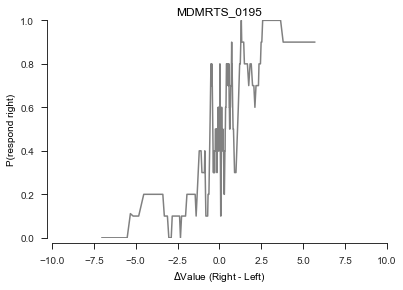

consistency: 0.68
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1819
Time:                        20:29:55   Log-Likelihood:                -156.50
converged:                       True   LL-Null:                       -191.31
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.7194      0.117      6.148      0.000       0.490       0.949


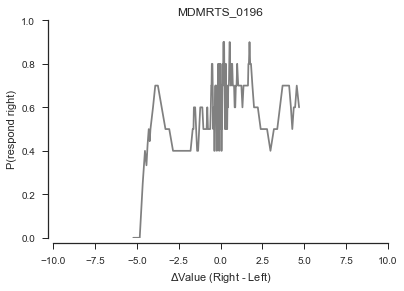

consistency: 0.55
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  241
Model:                          Logit   Df Residuals:                      240
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                -0.03785
Time:                        20:29:55   Log-Likelihood:                -166.31
converged:                       True   LL-Null:                       -160.24
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.0935      0.078      1.206      0.228      -0.058       0.245


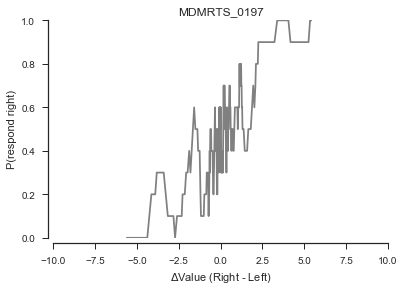

consistency: 0.68
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1863
Time:                        20:29:55   Log-Likelihood:                -157.56
converged:                       True   LL-Null:                       -193.62
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6079      0.094      6.450      0.000       0.423       0.793


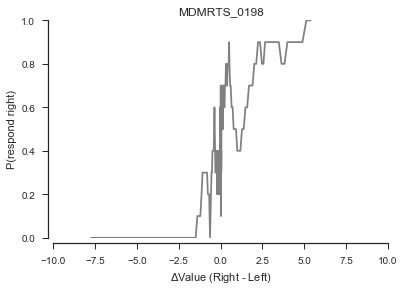

consistency: 0.65
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1933
Time:                        20:29:56   Log-Likelihood:                -151.50
converged:                       True   LL-Null:                       -187.80
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.9190      0.168      5.482      0.000       0.590       1.248


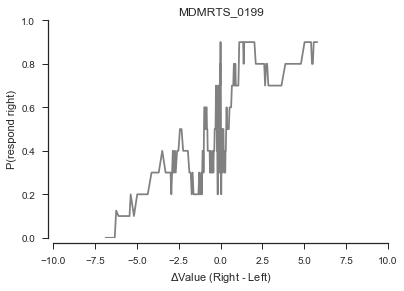

consistency: 0.65
nTrials: 273
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  273
Model:                          Logit   Df Residuals:                      272
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1276
Time:                        20:29:56   Log-Likelihood:                -164.72
converged:                       True   LL-Null:                       -188.82
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4236      0.074      5.716      0.000       0.278       0.569


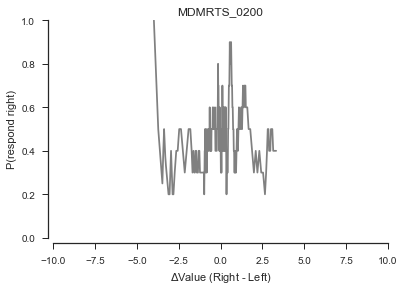

consistency: 0.54
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  266
Model:                          Logit   Df Residuals:                      265
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:               0.0001147
Time:                        20:29:56   Log-Likelihood:                -183.75
converged:                       True   LL-Null:                       -183.77
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.0993      0.089      1.118      0.264      -0.075       0.273


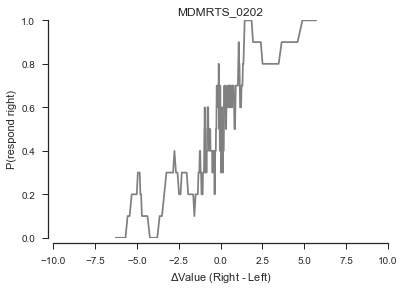

consistency: 0.66
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1563
Time:                        20:29:57   Log-Likelihood:                -162.52
converged:                       True   LL-Null:                       -192.63
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5399      0.090      6.000      0.000       0.364       0.716


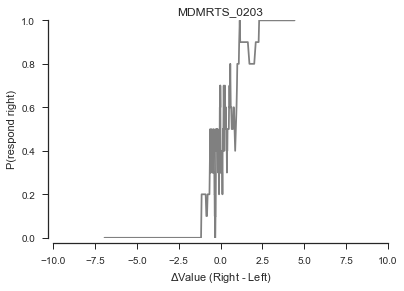

consistency: 0.7
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2953
Time:                        20:29:57   Log-Likelihood:                -135.49
converged:                       True   LL-Null:                       -192.25
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.4799      0.228      6.497      0.000       1.034       1.926


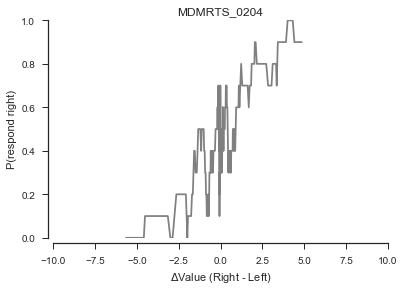

consistency: 0.63
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1379
Time:                        20:29:57   Log-Likelihood:                -167.01
converged:                       True   LL-Null:                       -193.73
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5769      0.097      5.960      0.000       0.387       0.767


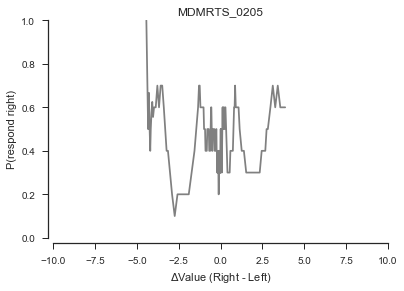

consistency: 0.51
nTrials: 267
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  160
Model:                          Logit   Df Residuals:                      159
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:               -0.007047
Time:                        20:29:58   Log-Likelihood:                -110.88
converged:                       True   LL-Null:                       -110.10
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.0194      0.086      0.225      0.822      -0.150       0.189


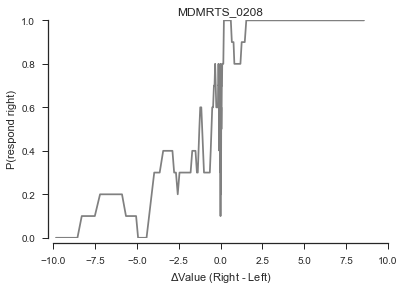

consistency: 0.64
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1744
Time:                        20:29:58   Log-Likelihood:                -158.91
converged:                       True   LL-Null:                       -192.47
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5358      0.098      5.446      0.000       0.343       0.729


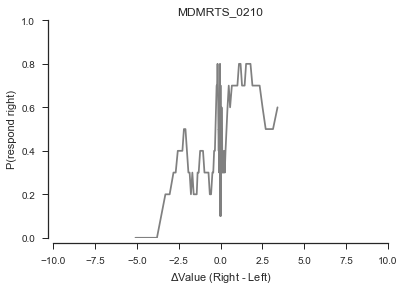

consistency: 0.52
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.02470
Time:                        20:29:58   Log-Likelihood:                -188.11
converged:                       True   LL-Null:                       -192.87
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3969      0.127      3.117      0.002       0.147       0.646


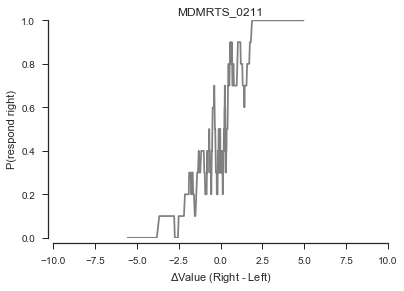

consistency: 0.72
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2908
Time:                        20:29:59   Log-Likelihood:                -137.52
converged:                       True   LL-Null:                       -193.90
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.9965      0.143      6.974      0.000       0.716       1.277


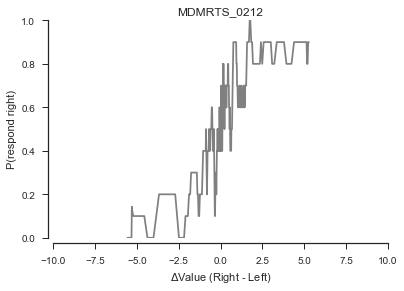

consistency: 0.72
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1727
Time:                        20:29:59   Log-Likelihood:                -159.71
converged:                       True   LL-Null:                       -193.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5770      0.091      6.361      0.000       0.399       0.755


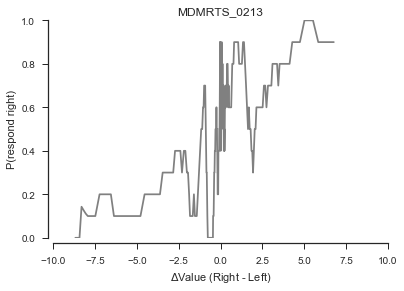

consistency: 0.68
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1111
Time:                        20:29:59   Log-Likelihood:                -171.87
converged:                       True   LL-Null:                       -193.34
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3707      0.070      5.262      0.000       0.233       0.509


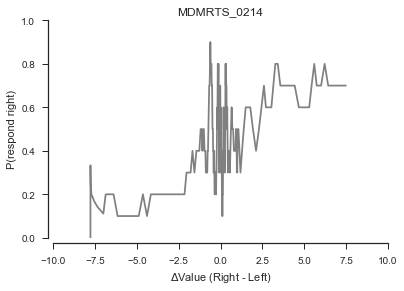

consistency: 0.55
nTrials: 264
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  258
Model:                          Logit   Df Residuals:                      257
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.04076
Time:                        20:30:00   Log-Likelihood:                -170.94
converged:                       True   LL-Null:                       -178.20
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2028      0.056      3.634      0.000       0.093       0.312


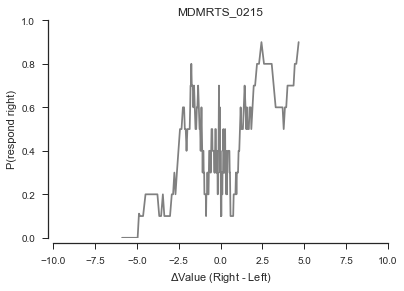

consistency: 0.53
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.01835
Time:                        20:30:00   Log-Likelihood:                -183.47
converged:                       True   LL-Null:                       -186.90
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2667      0.069      3.889      0.000       0.132       0.401


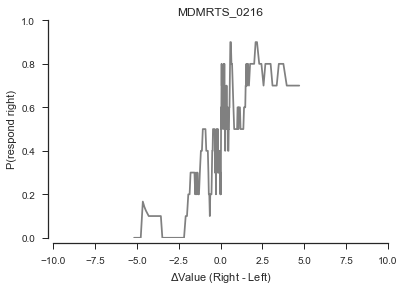

consistency: 0.65
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.09072
Time:                        20:30:01   Log-Likelihood:                -175.54
converged:                       True   LL-Null:                       -193.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5336      0.105      5.081      0.000       0.328       0.739


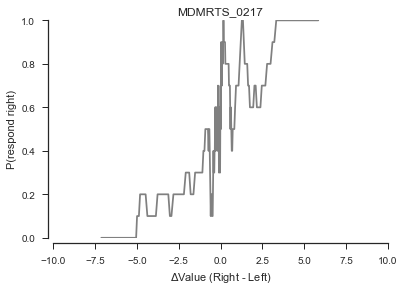

consistency: 0.74
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2053
Time:                        20:30:01   Log-Likelihood:                -152.44
converged:                       True   LL-Null:                       -191.82
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6153      0.098      6.276      0.000       0.423       0.808


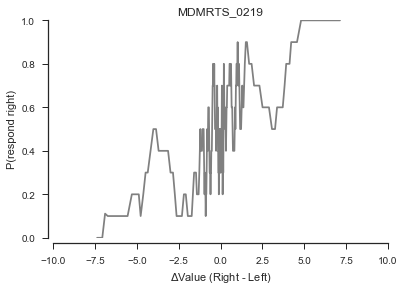

consistency: 0.64
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1142
Time:                        20:30:01   Log-Likelihood:                -171.30
converged:                       True   LL-Null:                       -193.37
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3979      0.075      5.314      0.000       0.251       0.545


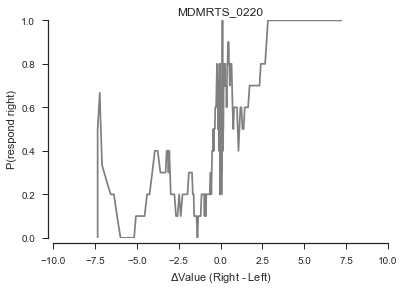

consistency: 0.69
nTrials: 270
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  270
Model:                          Logit   Df Residuals:                      269
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1727
Time:                        20:30:02   Log-Likelihood:                -154.78
converged:                       True   LL-Null:                       -187.08
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5056      0.085      5.945      0.000       0.339       0.672


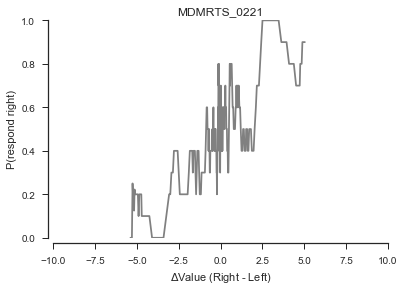

consistency: 0.64
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1010
Time:                        20:30:02   Log-Likelihood:                -171.88
converged:                       True   LL-Null:                       -191.19
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3839      0.071      5.433      0.000       0.245       0.522


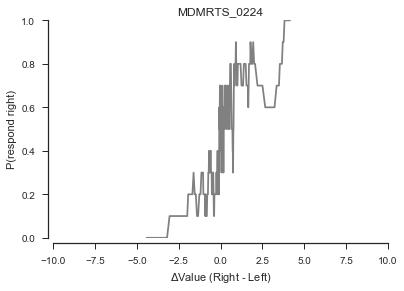

consistency: 0.7
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1721
Time:                        20:30:02   Log-Likelihood:                -157.90
converged:                       True   LL-Null:                       -190.72
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.7909      0.128      6.180      0.000       0.540       1.042


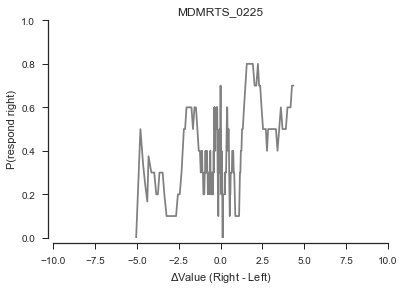

consistency: 0.53
nTrials: 274
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  274
Model:                          Logit   Df Residuals:                      273
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                -0.03442
Time:                        20:30:03   Log-Likelihood:                -187.64
converged:                       True   LL-Null:                       -181.40
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.1553      0.074      2.098      0.036       0.010       0.300


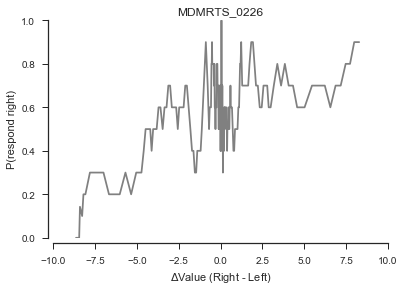

consistency: 0.55
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.01686
Time:                        20:30:03   Log-Likelihood:                -184.64
converged:                       True   LL-Null:                       -187.80
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.1702      0.046      3.703      0.000       0.080       0.260


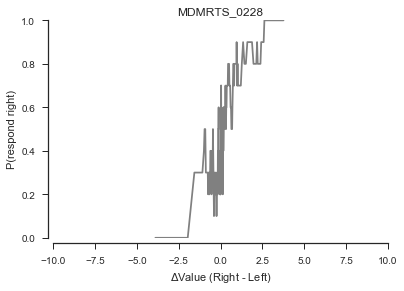

consistency: 0.7
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2190
Time:                        20:30:03   Log-Likelihood:                -148.95
converged:                       True   LL-Null:                       -190.72
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.1838      0.192      6.153      0.000       0.807       1.561


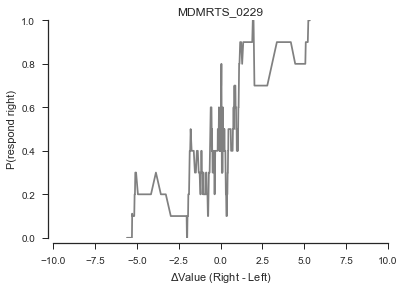

consistency: 0.65
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1268
Time:                        20:30:04   Log-Likelihood:                -168.96
converged:                       True   LL-Null:                       -193.50
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4953      0.088      5.635      0.000       0.323       0.668


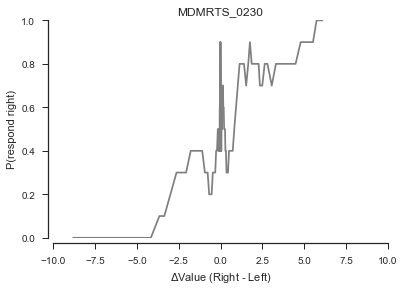

consistency: 0.62
nTrials: 140
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  140
Model:                          Logit   Df Residuals:                      139
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1479
Time:                        20:30:04   Log-Likelihood:                -81.910
converged:                       True   LL-Null:                       -96.124
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5731      0.148      3.884      0.000       0.284       0.862


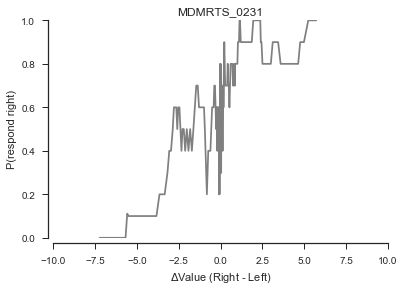

consistency: 0.62
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.09429
Time:                        20:30:05   Log-Likelihood:                -171.36
converged:                       True   LL-Null:                       -189.20
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4753      0.090      5.274      0.000       0.299       0.652


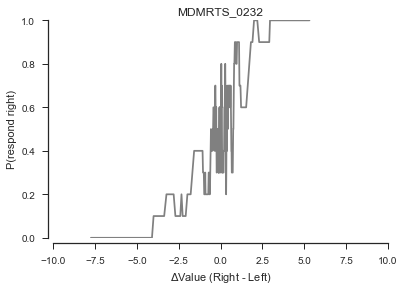

consistency: 0.67
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2195
Time:                        20:30:05   Log-Likelihood:                -151.48
converged:                       True   LL-Null:                       -194.07
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8446      0.137      6.183      0.000       0.577       1.112


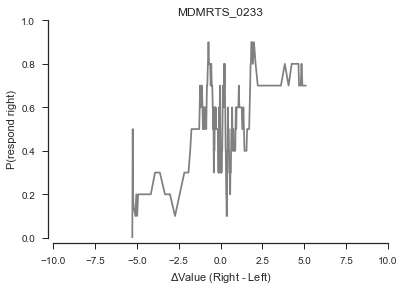

consistency: 0.53
nTrials: 267
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  264
Model:                          Logit   Df Residuals:                      263
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.03372
Time:                        20:30:05   Log-Likelihood:                -176.75
converged:                       True   LL-Null:                       -182.92
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2240      0.067      3.334      0.001       0.092       0.356


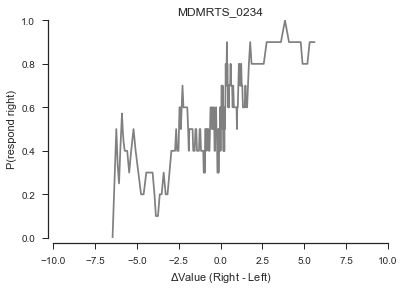

consistency: 0.62
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.04350
Time:                        20:30:06   Log-Likelihood:                -183.66
converged:                       True   LL-Null:                       -192.01
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2640      0.063      4.195      0.000       0.141       0.387


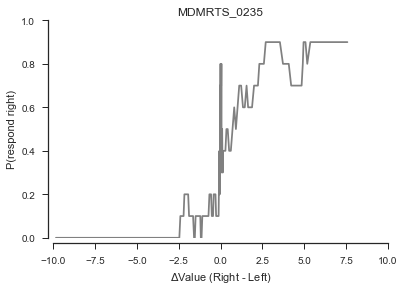

consistency: 0.7
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1928
Time:                        20:30:06   Log-Likelihood:                -151.89
converged:                       True   LL-Null:                       -188.17
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6412      0.111      5.765      0.000       0.423       0.859


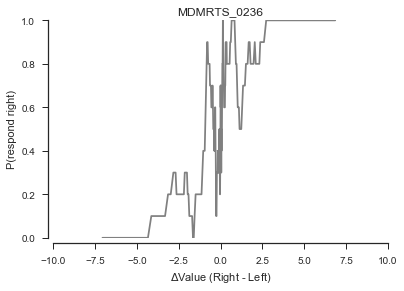

consistency: 0.74
nTrials: 269
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  268
Model:                          Logit   Df Residuals:                      267
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2597
Time:                        20:30:06   Log-Likelihood:                -136.96
converged:                       True   LL-Null:                       -185.02
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.7813      0.125      6.226      0.000       0.535       1.027


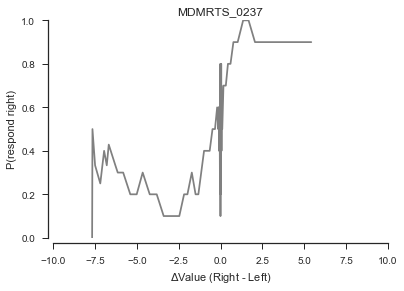

consistency: 0.56
nTrials: 252
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  252
Model:                          Logit   Df Residuals:                      251
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.04029
Time:                        20:30:07   Log-Likelihood:                -167.57
converged:                       True   LL-Null:                       -174.60
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3222      0.103      3.136      0.002       0.121       0.524


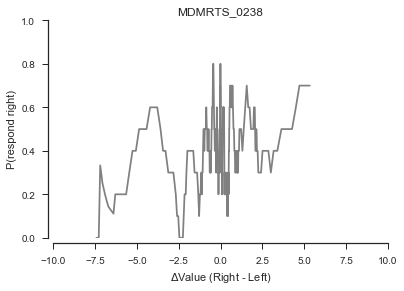

consistency: 0.51
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:               -0.008851
Time:                        20:30:07   Log-Likelihood:                -191.09
converged:                       True   LL-Null:                       -189.41
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.1235      0.059      2.097      0.036       0.008       0.239


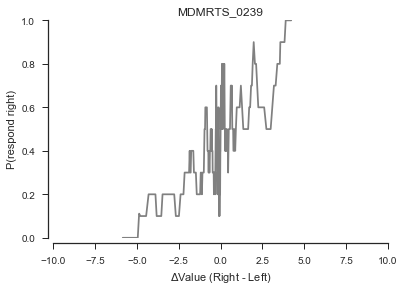

consistency: 0.66
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1026
Time:                        20:30:07   Log-Likelihood:                -172.14
converged:                       True   LL-Null:                       -191.82
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4746      0.086      5.499      0.000       0.305       0.644


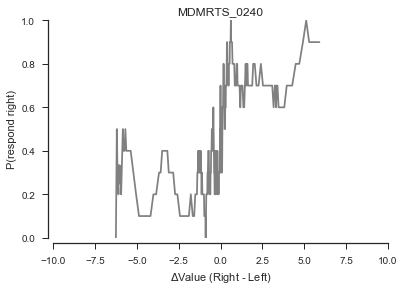

consistency: 0.7
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.08197
Time:                        20:30:08   Log-Likelihood:                -177.49
converged:                       True   LL-Null:                       -193.34
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3062      0.061      4.983      0.000       0.186       0.427


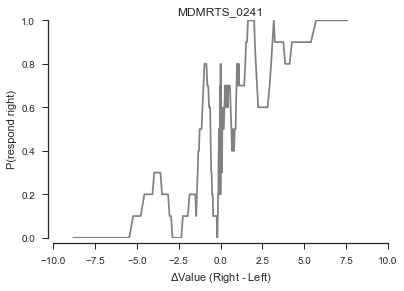

consistency: 0.66
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1672
Time:                        20:30:08   Log-Likelihood:                -161.57
converged:                       True   LL-Null:                       -194.02
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5572      0.094      5.903      0.000       0.372       0.742


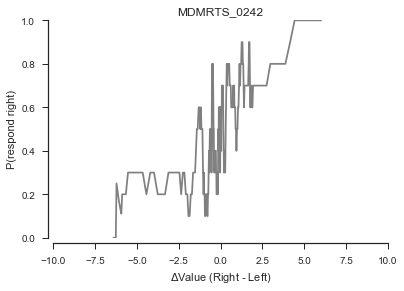

consistency: 0.67
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1224
Time:                        20:30:09   Log-Likelihood:                -167.49
converged:                       True   LL-Null:                       -190.84
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4506      0.082      5.497      0.000       0.290       0.611


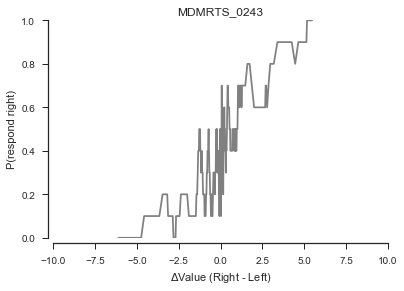

consistency: 0.67
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1699
Time:                        20:30:09   Log-Likelihood:                -155.57
converged:                       True   LL-Null:                       -187.42
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6011      0.094      6.367      0.000       0.416       0.786


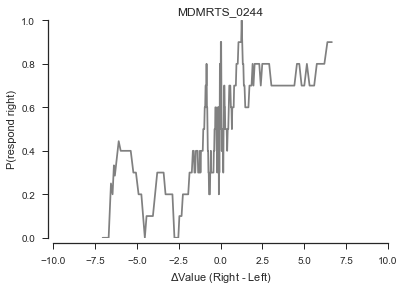

consistency: 0.65
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.09130
Time:                        20:30:09   Log-Likelihood:                -176.04
converged:                       True   LL-Null:                       -193.73
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3337      0.064      5.181      0.000       0.207       0.460


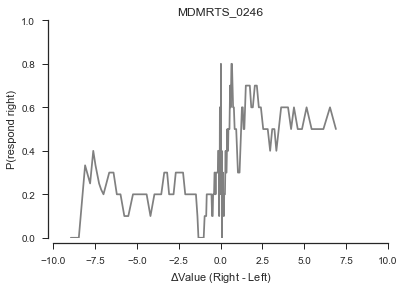

consistency: 0.58
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                -0.02303
Time:                        20:30:10   Log-Likelihood:                -189.50
converged:                       True   LL-Null:                       -185.24
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.1611      0.056      2.859      0.004       0.051       0.272


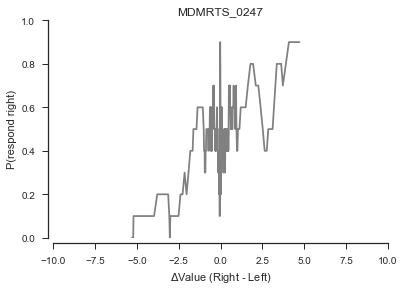

consistency: 0.58
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.07619
Time:                        20:30:10   Log-Likelihood:                -175.60
converged:                       True   LL-Null:                       -190.08
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3883      0.079      4.904      0.000       0.233       0.544


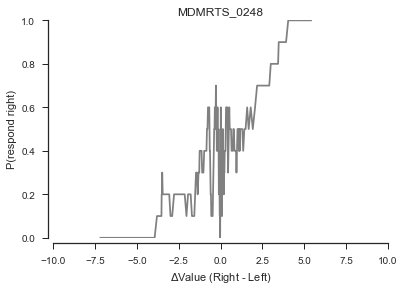

consistency: 0.64
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1090
Time:                        20:30:10   Log-Likelihood:                -167.15
converged:                       True   LL-Null:                       -187.60
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5312      0.091      5.828      0.000       0.353       0.710


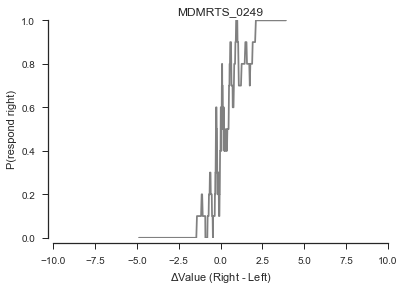

consistency: 0.82
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.4055
Time:                        20:30:11   Log-Likelihood:                -113.72
converged:                       True   LL-Null:                       -191.28
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.7866      0.242      7.380      0.000       1.312       2.261


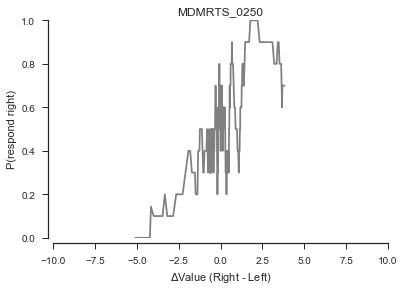

consistency: 0.61
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.08523
Time:                        20:30:11   Log-Likelihood:                -175.56
converged:                       True   LL-Null:                       -191.91
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4927      0.098      5.005      0.000       0.300       0.686


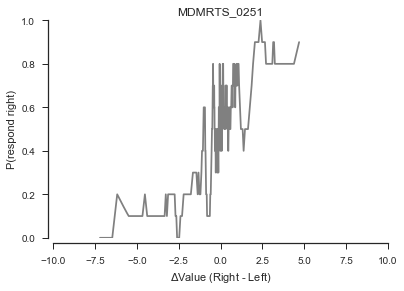

consistency: 0.66
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1207
Time:                        20:30:11   Log-Likelihood:                -169.86
converged:                       True   LL-Null:                       -193.17
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5250      0.094      5.587      0.000       0.341       0.709


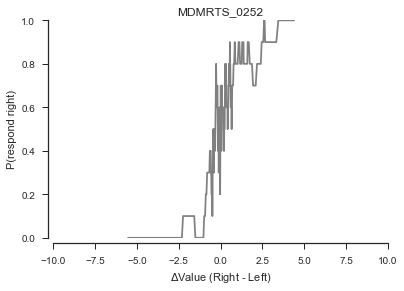

consistency: 0.74
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2798
Time:                        20:30:12   Log-Likelihood:                -139.13
converged:                       True   LL-Null:                       -193.17
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.2077      0.176      6.864      0.000       0.863       1.553


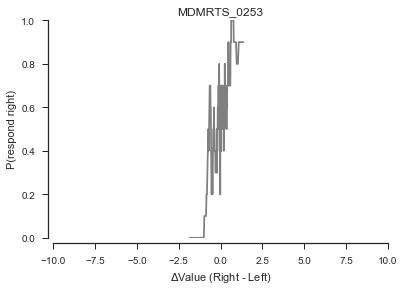

consistency: 0.65
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1107
Time:                        20:30:12   Log-Likelihood:                -170.24
converged:                       True   LL-Null:                       -191.43
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.8805      0.329      5.715      0.000       1.236       2.525


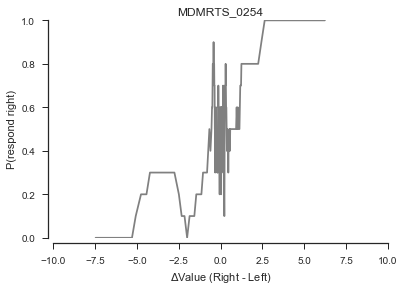

consistency: 0.59
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1329
Time:                        20:30:13   Log-Likelihood:                -166.98
converged:                       True   LL-Null:                       -192.58
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6066      0.126      4.805      0.000       0.359       0.854


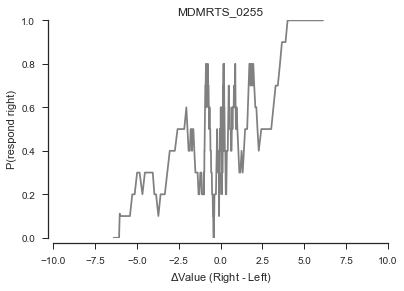

consistency: 0.63
nTrials: 272
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  272
Model:                          Logit   Df Residuals:                      271
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.09765
Time:                        20:30:13   Log-Likelihood:                -169.70
converged:                       True   LL-Null:                       -188.07
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3747      0.072      5.197      0.000       0.233       0.516


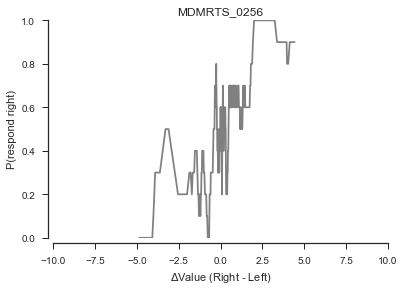

consistency: 0.64
nTrials: 268
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  268
Model:                          Logit   Df Residuals:                      267
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1146
Time:                        20:30:13   Log-Likelihood:                -164.45
converged:                       True   LL-Null:                       -185.73
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5507      0.101      5.438      0.000       0.352       0.749


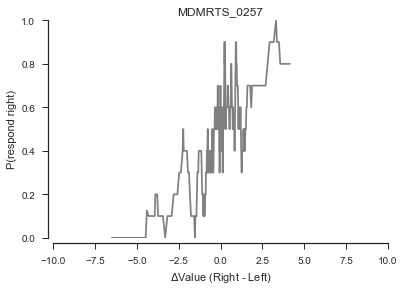

consistency: 0.66
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1145
Time:                        20:30:14   Log-Likelihood:                -171.21
converged:                       True   LL-Null:                       -193.34
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5351      0.094      5.665      0.000       0.350       0.720


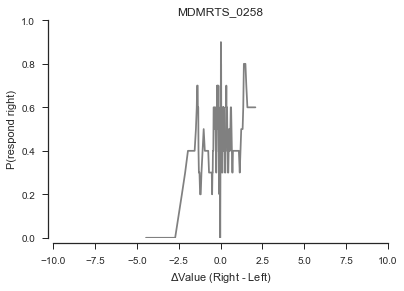

consistency: 0.56
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.02122
Time:                        20:30:14   Log-Likelihood:                -185.43
converged:                       True   LL-Null:                       -189.45
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4217      0.134      3.143      0.002       0.159       0.685


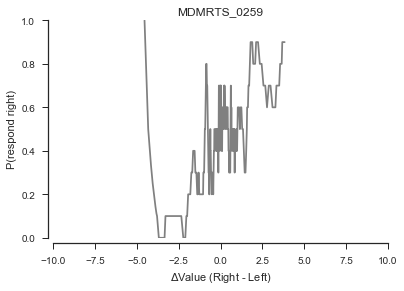

consistency: 0.61
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.07855
Time:                        20:30:14   Log-Likelihood:                -177.83
converged:                       True   LL-Null:                       -192.98
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4689      0.094      4.978      0.000       0.284       0.654


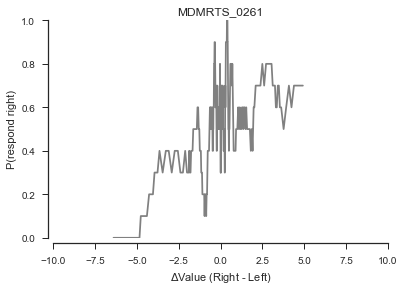

consistency: 0.57
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.04036
Time:                        20:30:15   Log-Likelihood:                -182.74
converged:                       True   LL-Null:                       -190.43
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2869      0.075      3.840      0.000       0.140       0.433


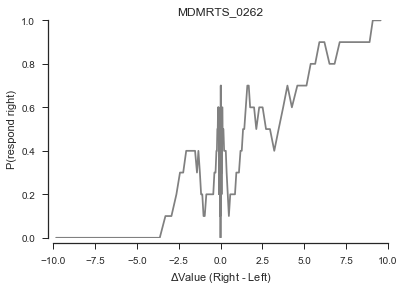

consistency: 0.62
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1225
Time:                        20:30:15   Log-Likelihood:                -161.30
converged:                       True   LL-Null:                       -183.82
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3850      0.074      5.204      0.000       0.240       0.530


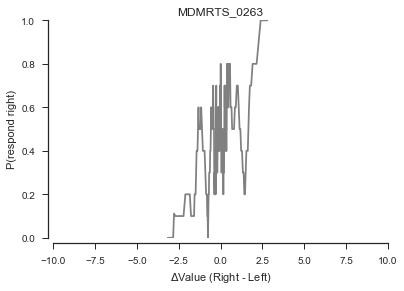

consistency: 0.59
nTrials: 273
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  272
Model:                          Logit   Df Residuals:                      271
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.06627
Time:                        20:30:15   Log-Likelihood:                -175.79
converged:                       True   LL-Null:                       -188.27
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6701      0.149      4.495      0.000       0.378       0.962


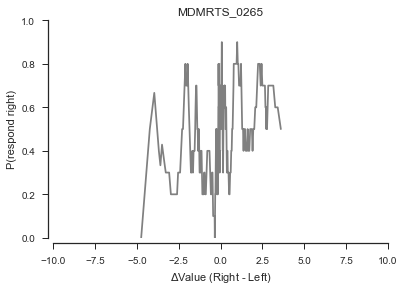

consistency: 0.59
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                0.009819
Time:                        20:30:16   Log-Likelihood:                -191.44
converged:                       True   LL-Null:                       -193.34
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.1581      0.081      1.947      0.052      -0.001       0.317


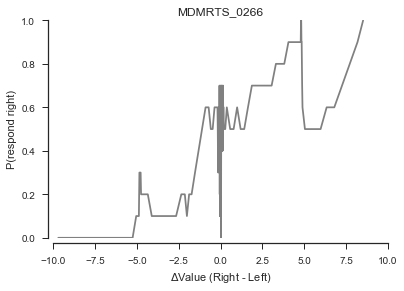

consistency: 0.62
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1054
Time:                        20:30:16   Log-Likelihood:                -169.14
converged:                       True   LL-Null:                       -189.06
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3445      0.066      5.241      0.000       0.216       0.473


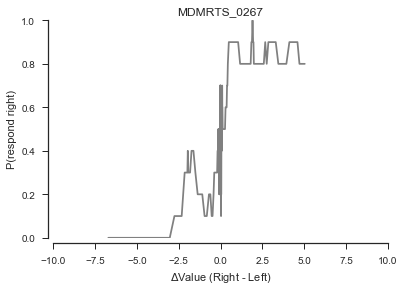

consistency: 0.61
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1006
Time:                        20:30:17   Log-Likelihood:                -173.86
converged:                       True   LL-Null:                       -193.30
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6371      0.133      4.802      0.000       0.377       0.897


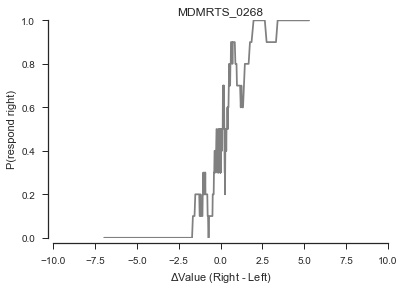

consistency: 0.76
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.3496
Time:                        20:30:17   Log-Likelihood:                -124.18
converged:                       True   LL-Null:                       -190.92
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.3892      0.211      6.585      0.000       0.976       1.803


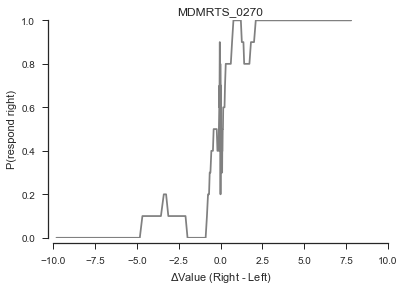

consistency: 0.68
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2845
Time:                        20:30:17   Log-Likelihood:                -136.62
converged:                       True   LL-Null:                       -190.93
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.2258      0.248      4.943      0.000       0.740       1.712


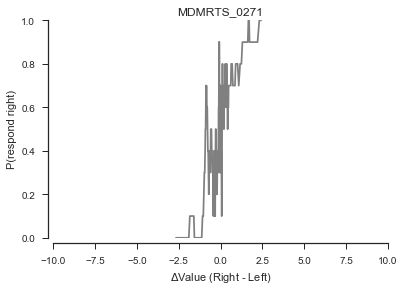

consistency: 0.67
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  266
Model:                          Logit   Df Residuals:                      265
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1750
Time:                        20:30:18   Log-Likelihood:                -152.11
converged:                       True   LL-Null:                       -184.37
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.4132      0.229      6.169      0.000       0.964       1.862


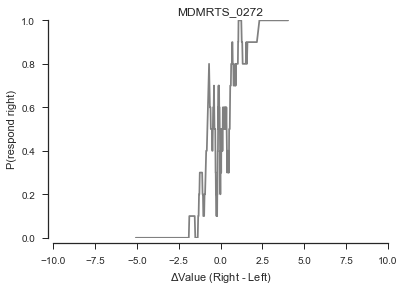

consistency: 0.71
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.3202
Time:                        20:30:18   Log-Likelihood:                -129.88
converged:                       True   LL-Null:                       -191.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.3334      0.187      7.134      0.000       0.967       1.700


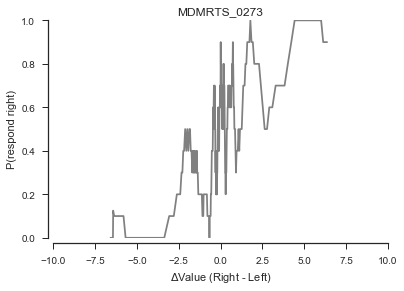

consistency: 0.69
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1453
Time:                        20:30:18   Log-Likelihood:                -165.10
converged:                       True   LL-Null:                       -193.17
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5027      0.089      5.647      0.000       0.328       0.677


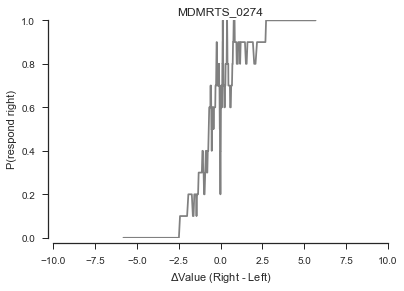

consistency: 0.72
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2732
Time:                        20:30:19   Log-Likelihood:                -135.69
converged:                       True   LL-Null:                       -186.70
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.1530      0.170      6.788      0.000       0.820       1.486


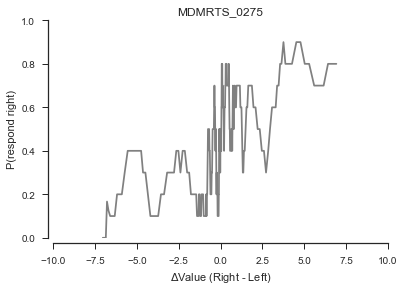

consistency: 0.67
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  274
Model:                          Logit   Df Residuals:                      273
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.07435
Time:                        20:30:19   Log-Likelihood:                -174.98
converged:                       True   LL-Null:                       -189.04
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2927      0.062      4.749      0.000       0.172       0.413


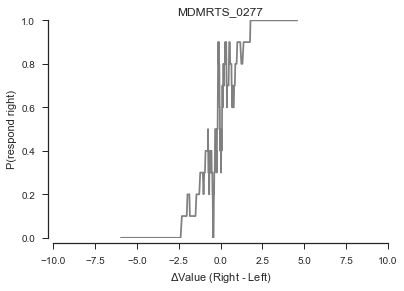

consistency: 0.76
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.3584
Time:                        20:30:19   Log-Likelihood:                -123.96
converged:                       True   LL-Null:                       -193.22
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.4721      0.210      7.008      0.000       1.060       1.884


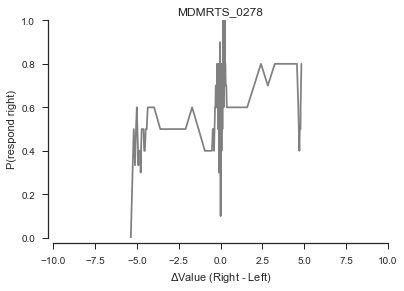

consistency: 0.55
nTrials: 267
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  261
Model:                          Logit   Df Residuals:                      260
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                -0.01447
Time:                        20:30:20   Log-Likelihood:                -179.21
converged:                       True   LL-Null:                       -176.66
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.1130      0.062      1.811      0.070      -0.009       0.235


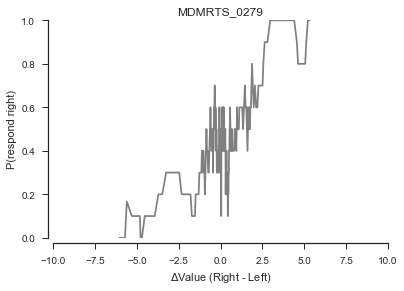

consistency: 0.59
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1069
Time:                        20:30:20   Log-Likelihood:                -171.01
converged:                       True   LL-Null:                       -191.48
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4531      0.084      5.399      0.000       0.289       0.618


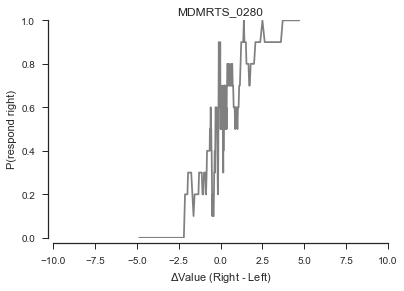

consistency: 0.68
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2243
Time:                        20:30:20   Log-Likelihood:                -149.51
converged:                       True   LL-Null:                       -192.74
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.9723      0.152      6.380      0.000       0.674       1.271


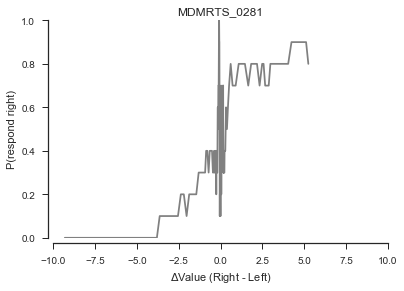

consistency: 0.59
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.09333
Time:                        20:30:21   Log-Likelihood:                -171.82
converged:                       True   LL-Null:                       -189.51
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5543      0.117      4.731      0.000       0.325       0.784


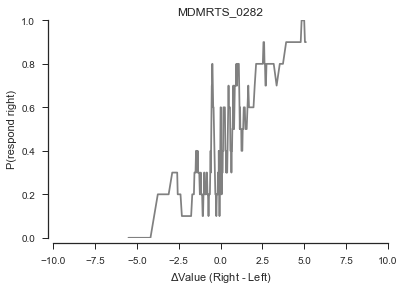

consistency: 0.68
nTrials: 272
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  272
Model:                          Logit   Df Residuals:                      271
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1570
Time:                        20:30:21   Log-Likelihood:                -157.35
converged:                       True   LL-Null:                       -186.65
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5522      0.088      6.242      0.000       0.379       0.726


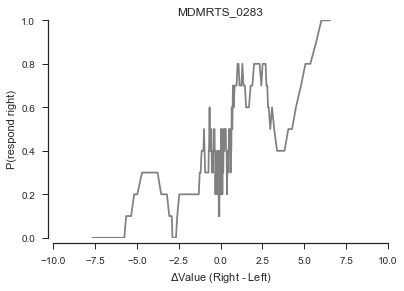

consistency: 0.63
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.07968
Time:                        20:30:22   Log-Likelihood:                -170.41
converged:                       True   LL-Null:                       -185.17
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4137      0.081      5.110      0.000       0.255       0.572


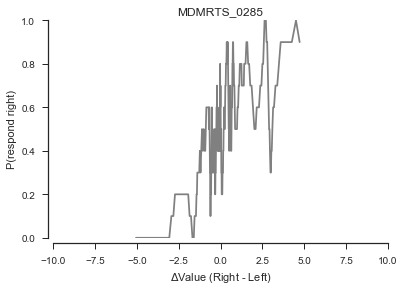

consistency: 0.64
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.09374
Time:                        20:30:22   Log-Likelihood:                -175.88
converged:                       True   LL-Null:                       -194.07
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4788      0.091      5.239      0.000       0.300       0.658


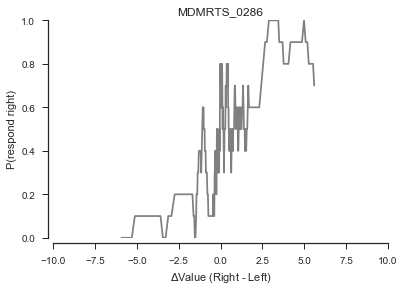

consistency: 0.69
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1230
Time:                        20:30:22   Log-Likelihood:                -169.47
converged:                       True   LL-Null:                       -193.24
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4632      0.081      5.694      0.000       0.304       0.623


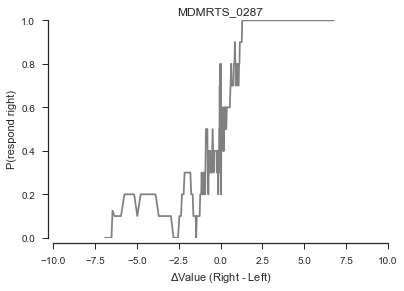

consistency: 0.75
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2821
Time:                        20:30:23   Log-Likelihood:                -138.59
converged:                       True   LL-Null:                       -193.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8886      0.136      6.558      0.000       0.623       1.154


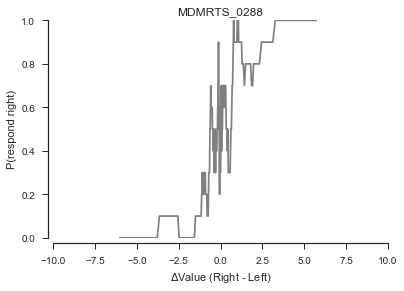

consistency: 0.75
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.3375
Time:                        20:30:23   Log-Likelihood:                -128.57
converged:                       True   LL-Null:                       -194.07
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.1324      0.167      6.785      0.000       0.805       1.460


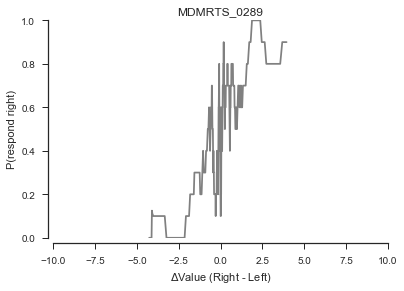

consistency: 0.69
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1843
Time:                        20:30:23   Log-Likelihood:                -155.84
converged:                       True   LL-Null:                       -191.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8984      0.144      6.239      0.000       0.616       1.181


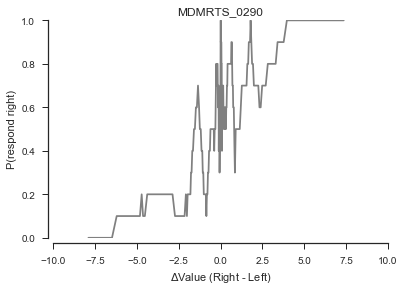

consistency: 0.7
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1789
Time:                        20:30:24   Log-Likelihood:                -157.01
converged:                       True   LL-Null:                       -191.21
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5717      0.094      6.058      0.000       0.387       0.757


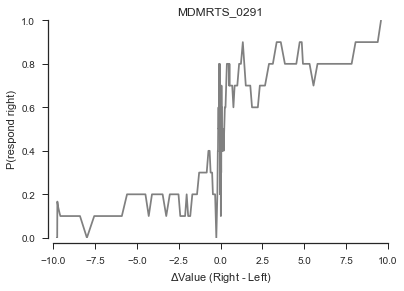

consistency: 0.62
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1252
Time:                        20:30:24   Log-Likelihood:                -167.13
converged:                       True   LL-Null:                       -191.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3287      0.064      5.161      0.000       0.204       0.453


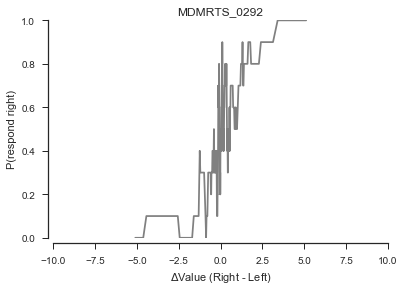

consistency: 0.71
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2298
Time:                        20:30:24   Log-Likelihood:                -149.21
converged:                       True   LL-Null:                       -193.73
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.0269      0.173      5.932      0.000       0.688       1.366


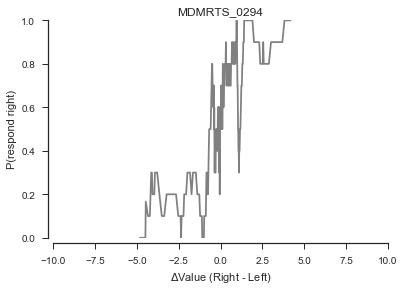

consistency: 0.73
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1947
Time:                        20:30:25   Log-Likelihood:                -154.35
converged:                       True   LL-Null:                       -191.66
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.7581      0.114      6.655      0.000       0.535       0.981


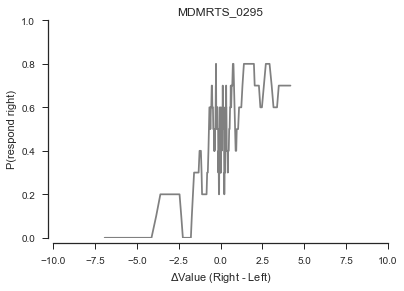

consistency: 0.6
nTrials: 256
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  256
Model:                          Logit   Df Residuals:                      255
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.08998
Time:                        20:30:25   Log-Likelihood:                -161.02
converged:                       True   LL-Null:                       -176.95
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5293      0.111      4.773      0.000       0.312       0.747


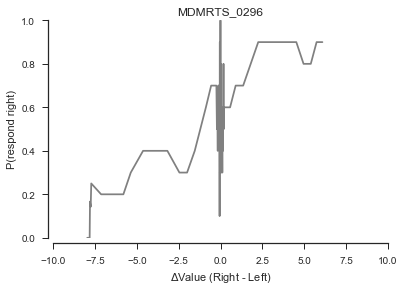

consistency: 0.54
nTrials: 270
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  268
Model:                          Logit   Df Residuals:                      267
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                0.009302
Time:                        20:30:26   Log-Likelihood:                -180.44
converged:                       True   LL-Null:                       -182.14
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2344      0.083      2.826      0.005       0.072       0.397


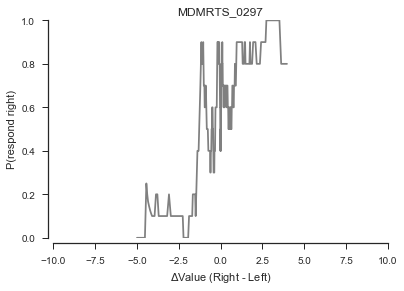

consistency: 0.67
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1472
Time:                        20:30:26   Log-Likelihood:                -158.27
converged:                       True   LL-Null:                       -185.59
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6950      0.106      6.559      0.000       0.487       0.903


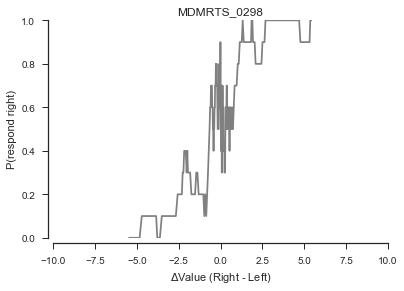

consistency: 0.67
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2299
Time:                        20:30:26   Log-Likelihood:                -146.36
converged:                       True   LL-Null:                       -190.06
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.7388      0.111      6.675      0.000       0.522       0.956


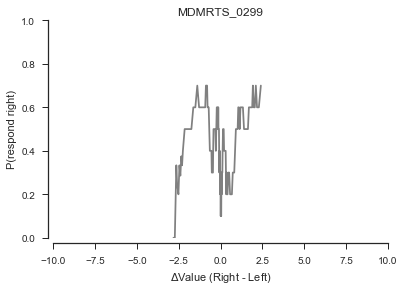

consistency: 0.43
nTrials: 219
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  137
Model:                          Logit   Df Residuals:                      136
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                -0.01089
Time:                        20:30:27   Log-Likelihood:                -94.659
converged:                       True   LL-Null:                       -93.639
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.1158      0.150      0.774      0.439      -0.177       0.409


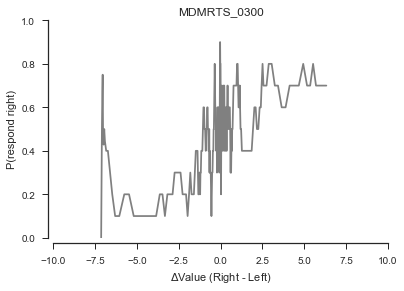

consistency: 0.6
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.03623
Time:                        20:30:27   Log-Likelihood:                -186.37
converged:                       True   LL-Null:                       -193.37
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.1955      0.056      3.500      0.000       0.086       0.305


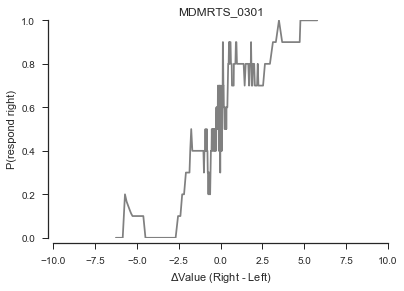

consistency: 0.69
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1746
Time:                        20:30:27   Log-Likelihood:                -155.71
converged:                       True   LL-Null:                       -188.65
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6607      0.107      6.149      0.000       0.450       0.871


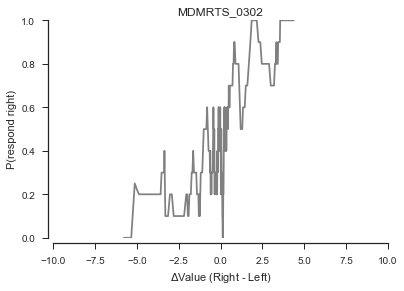

consistency: 0.65
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1388
Time:                        20:30:28   Log-Likelihood:                -166.40
converged:                       True   LL-Null:                       -193.22
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5611      0.093      6.058      0.000       0.380       0.743


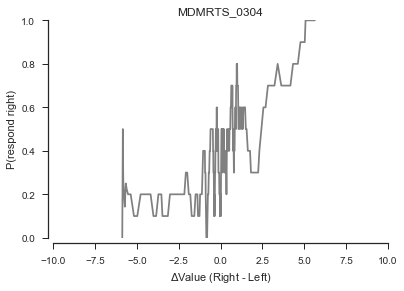

consistency: 0.63
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.07377
Time:                        20:30:28   Log-Likelihood:                -173.80
converged:                       True   LL-Null:                       -187.64
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3917      0.076      5.135      0.000       0.242       0.541


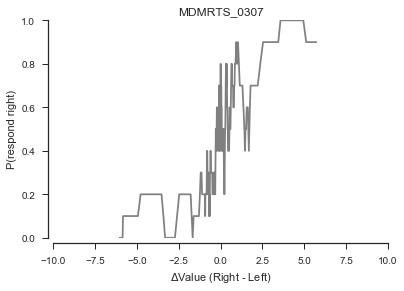

consistency: 0.7
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1773
Time:                        20:30:29   Log-Likelihood:                -157.31
converged:                       True   LL-Null:                       -191.20
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6251      0.103      6.064      0.000       0.423       0.827


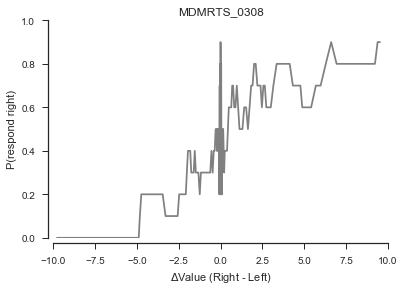

consistency: 0.65
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1157
Time:                        20:30:29   Log-Likelihood:                -170.66
converged:                       True   LL-Null:                       -192.98
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3244      0.062      5.224      0.000       0.203       0.446


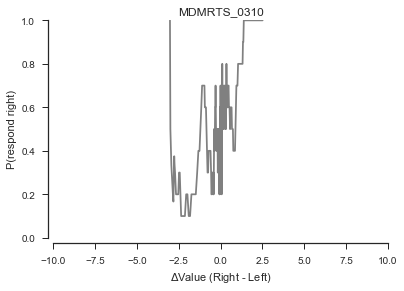

consistency: 0.62
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                 0.09445
Time:                        20:30:30   Log-Likelihood:                -174.76
converged:                       True   LL-Null:                       -192.98
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8145      0.156      5.219      0.000       0.509       1.120


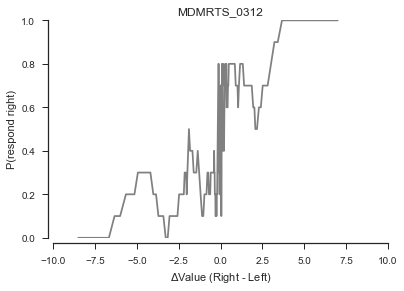

consistency: 0.69
nTrials: 271
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  269
Model:                          Logit   Df Residuals:                      268
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1667
Time:                        20:30:31   Log-Likelihood:                -155.33
converged:                       True   LL-Null:                       -186.41
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5685      0.102      5.557      0.000       0.368       0.769


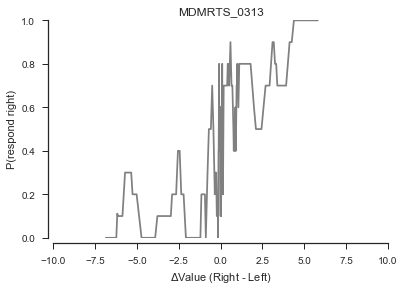

consistency: 0.69
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.1649
Time:                        20:30:31   Log-Likelihood:                -159.22
converged:                       True   LL-Null:                       -190.65
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5275      0.083      6.325      0.000       0.364       0.691


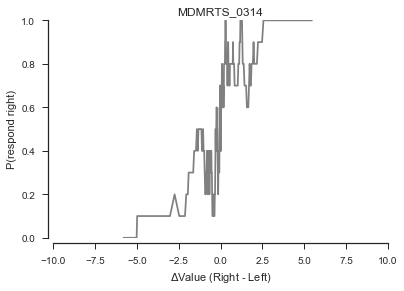

consistency: 0.76
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2442
Time:                        20:30:31   Log-Likelihood:                -143.44
converged:                       True   LL-Null:                       -189.78
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.9108      0.143      6.375      0.000       0.631       1.191


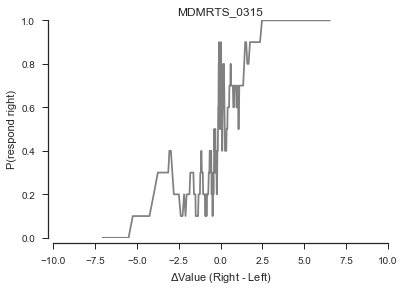

consistency: 0.72
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.2507
Time:                        20:30:32   Log-Likelihood:                -145.23
converged:                       True   LL-Null:                       -193.82
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.7856      0.124      6.348      0.000       0.543       1.028


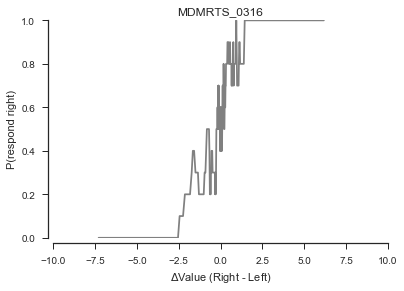

consistency: 0.76
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Wed, 12 Sep 2018   Pseudo R-squ.:                  0.3392
Time:                        20:30:32   Log-Likelihood:                -126.15
converged:                       True   LL-Null:                       -190.92
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.3860      0.209      6.634      0.000       0.976       1.796
Of 102 subjects, 96 subjects had significant p values for the logistic regression.


In [16]:
df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=True)

In [17]:
def get_subject_rt(subjectId, zscoreRatings, printFigs):
    subjectFolder = _dataDir + subjectId + '/'
    choiceFile = subjectFolder + subjectId + choiceFileEnd
    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        
        # remove trials with no response and where RT <= 300ms
        df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
        
        rightStimRatings = df["stimulus2Bid"]
        leftStimRatings = df["stimulus1Bid"]
        
        if zscoreRatings:
            mean, std = get_ratings_mean_and_std(subjectId)
            rightStimRatings = (rightStimRatings - mean) / std
            leftStimRatings = (leftStimRatings - mean) / std
        
        delta = rightStimRatings - leftStimRatings
        rt = df["rt"]
        if np.mean(rt) > 3000: # need to use UNIX times, 3000 was max RT
            rt = df['rt_UNIX']
        
        d = {'delta':delta, 'RT':rt}
        df2 = pd.DataFrame(data=d)
        df2 = df2.sort_values('delta',axis=0, ascending = True) 
        df2 = df2.reset_index(drop=True)
        y = df2.rolling(window=10,min_periods=1).mean()

        if printFigs:
            plt.plot(y['delta'],y['RT'],color='grey')
            axes = plt.gca()
            axes.set_title(subjectId)
            axes.set_xlabel(r'$\Delta$Value (Right - Left)')
            axes.set_ylabel('RT (ms)')
            axes.set_xlim(-10,10)

            sns.set_style("whitegrid")
            sns.set(style="ticks")
            sns.despine(offset=5)
            plt.show()

            [consistency, nResponses] = get_subject_consistency_nRsps(subjectId)
            print "consistency:", consistency
            print "nTrials:", nResponses
        
        return df2
        
def get_rt_plots(zscoreRatings, printFigs):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    for subject in subjects:
        get_subject_rt(subject, zscoreRatings, printFigs)

total number of people who accepted the HIT 316
102 subjects completed the auction and choice tasks.


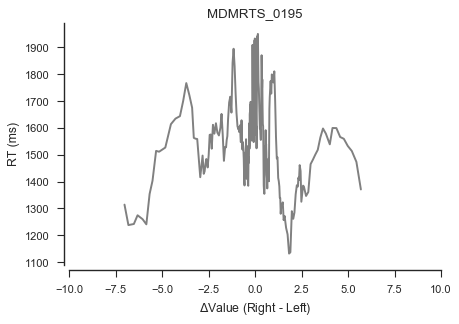

consistency: 0.68
nTrials: 276


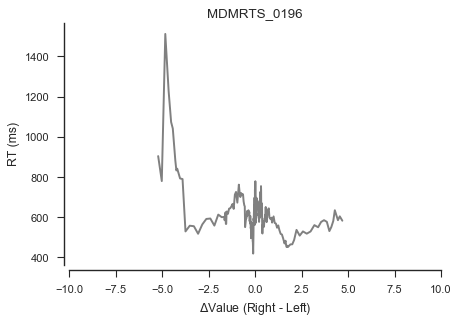

consistency: 0.55
nTrials: 277


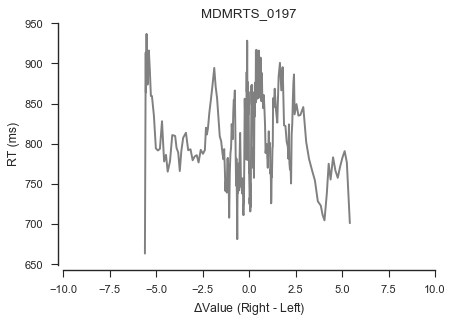

consistency: 0.68
nTrials: 280


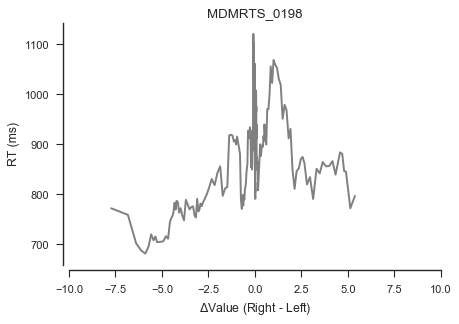

consistency: 0.65
nTrials: 278


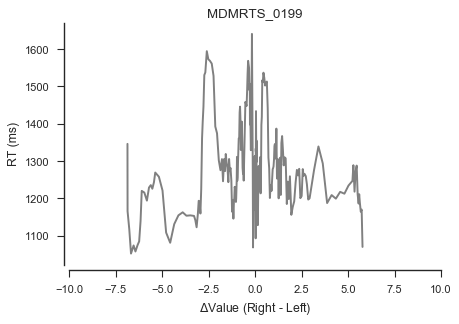

consistency: 0.65
nTrials: 273


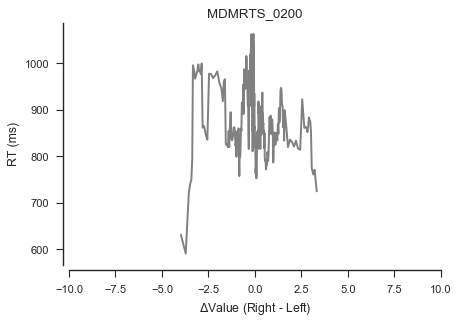

consistency: 0.54
nTrials: 279


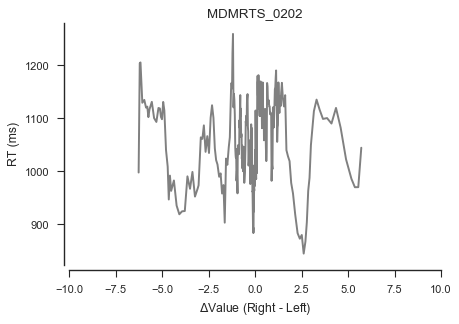

consistency: 0.66
nTrials: 279


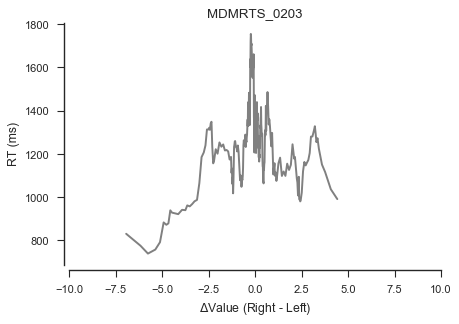

consistency: 0.7
nTrials: 280


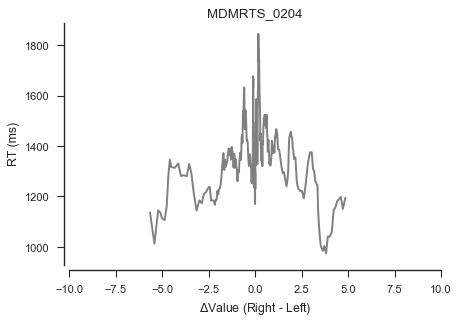

consistency: 0.63
nTrials: 280


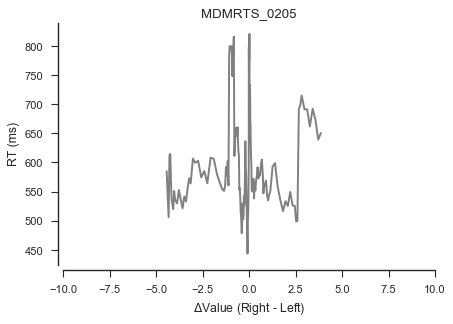

consistency: 0.51
nTrials: 267


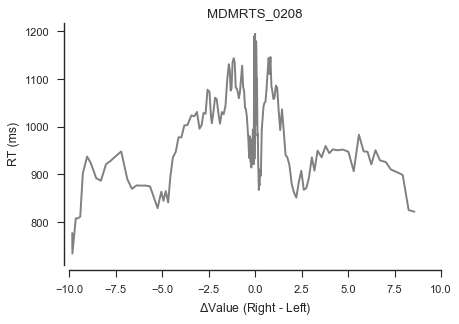

consistency: 0.64
nTrials: 280


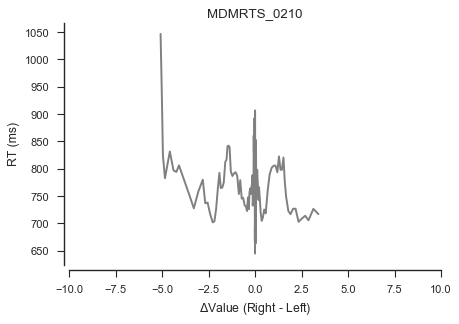

consistency: 0.52
nTrials: 280


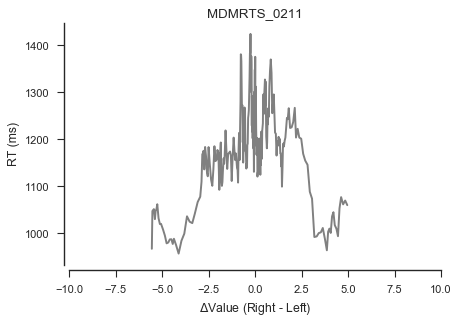

consistency: 0.72
nTrials: 280


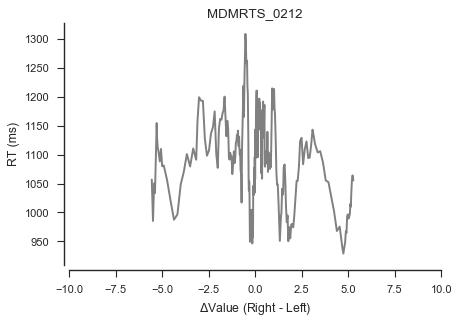

consistency: 0.72
nTrials: 280


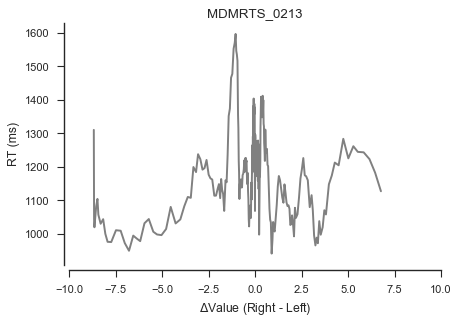

consistency: 0.68
nTrials: 279


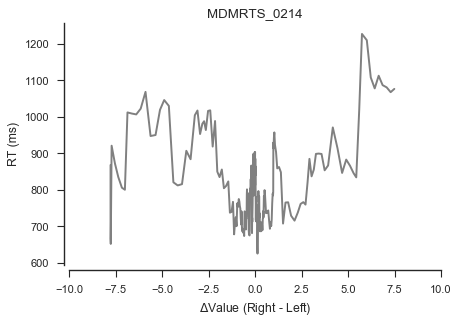

consistency: 0.55
nTrials: 264


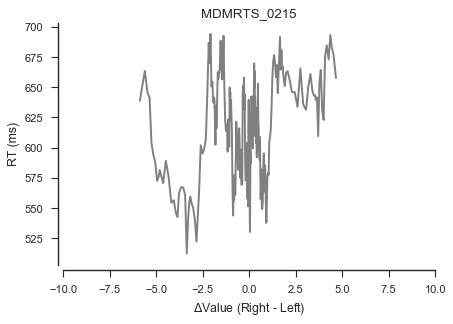

consistency: 0.53
nTrials: 280


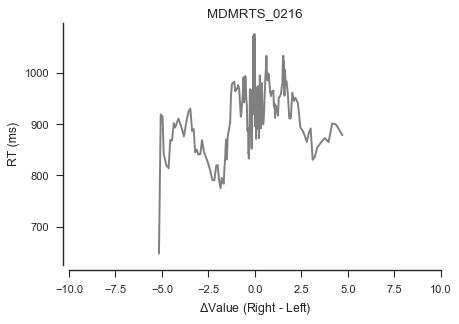

consistency: 0.65
nTrials: 280


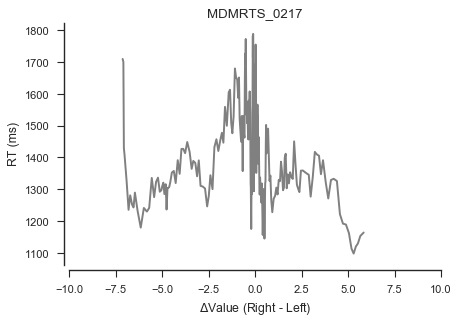

consistency: 0.74
nTrials: 278


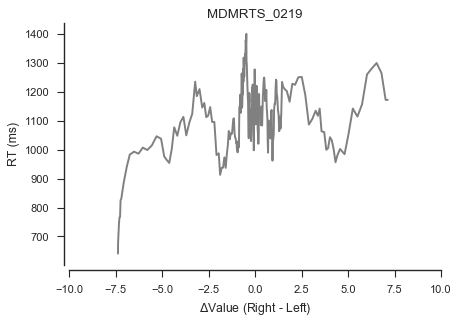

consistency: 0.64
nTrials: 279


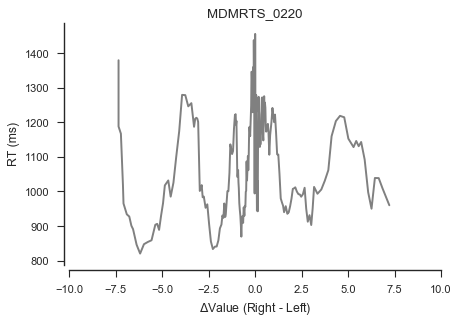

consistency: 0.69
nTrials: 270


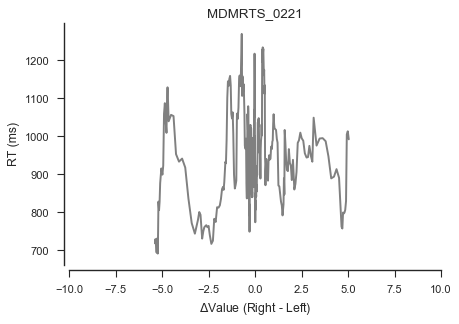

consistency: 0.64
nTrials: 276


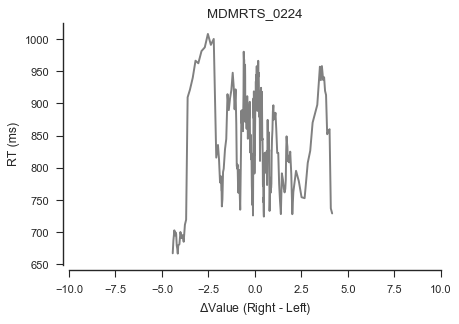

consistency: 0.7
nTrials: 276


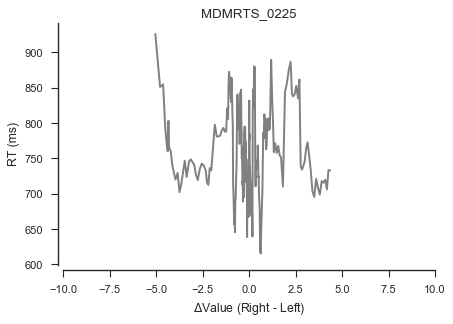

consistency: 0.53
nTrials: 274


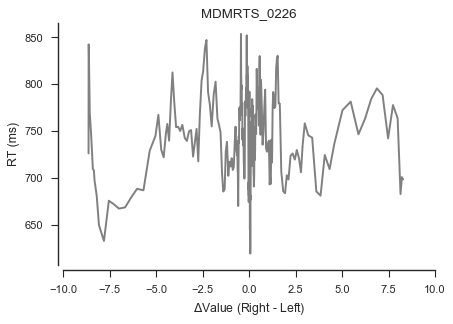

consistency: 0.55
nTrials: 280


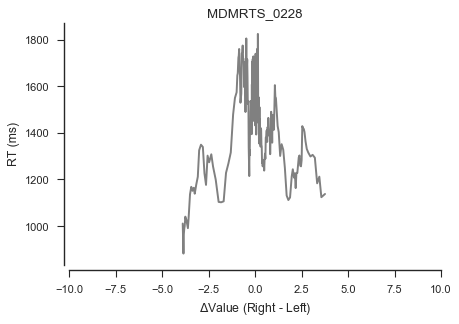

consistency: 0.7
nTrials: 276


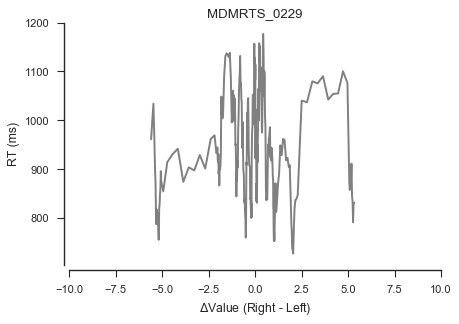

consistency: 0.65
nTrials: 280


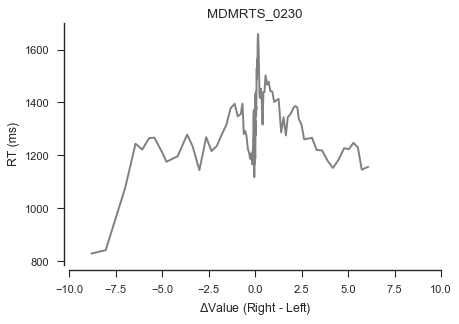

consistency: 0.62
nTrials: 140


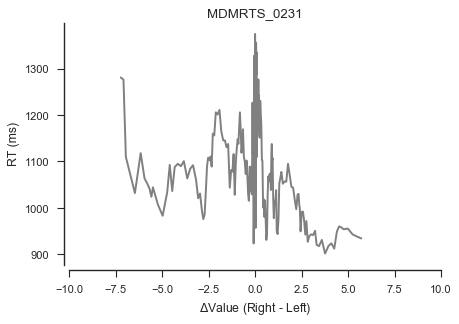

consistency: 0.62
nTrials: 278


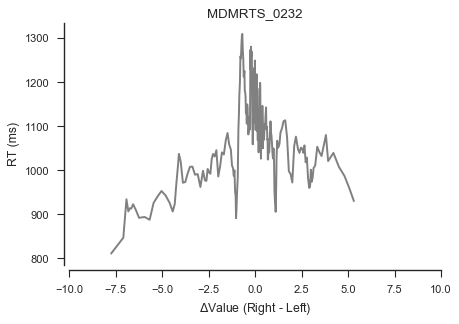

consistency: 0.67
nTrials: 280


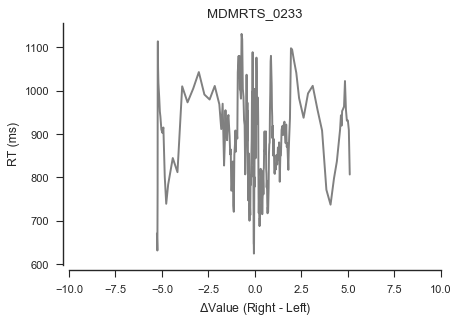

consistency: 0.53
nTrials: 267


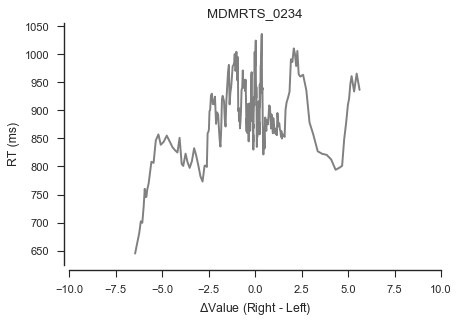

consistency: 0.62
nTrials: 280


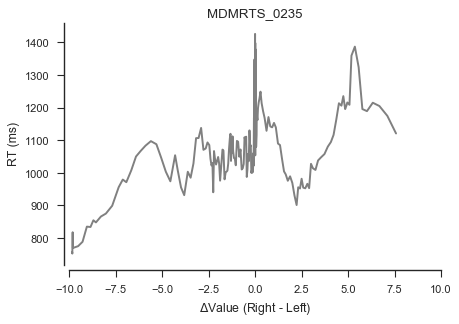

consistency: 0.7
nTrials: 278


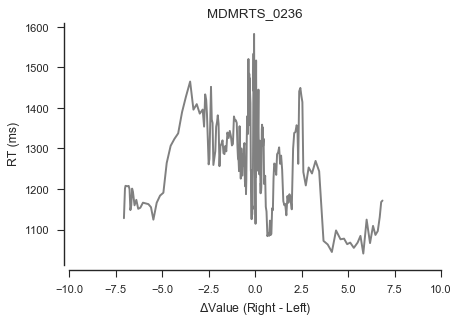

consistency: 0.74
nTrials: 269


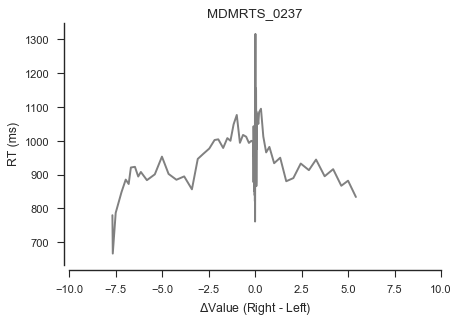

consistency: 0.56
nTrials: 252


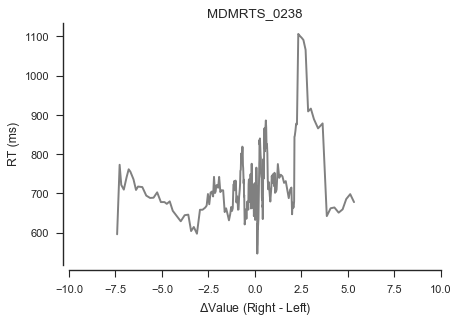

consistency: 0.51
nTrials: 280


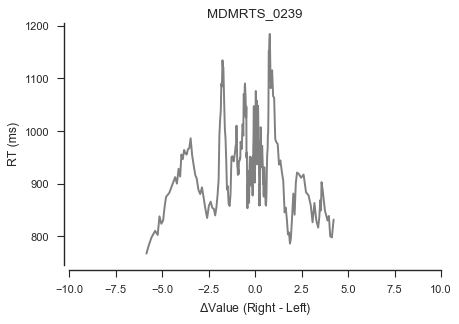

consistency: 0.66
nTrials: 279


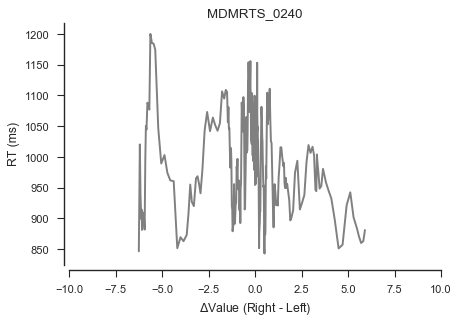

consistency: 0.7
nTrials: 279


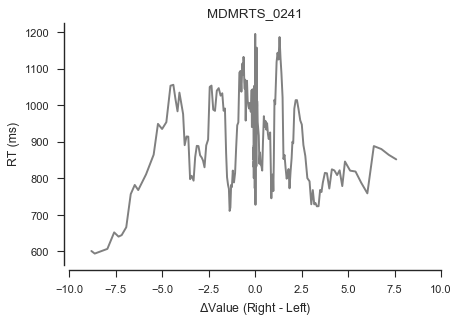

consistency: 0.66
nTrials: 280


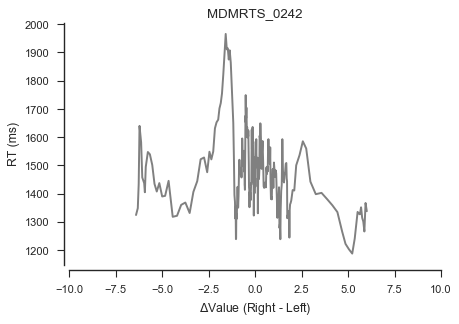

consistency: 0.67
nTrials: 276


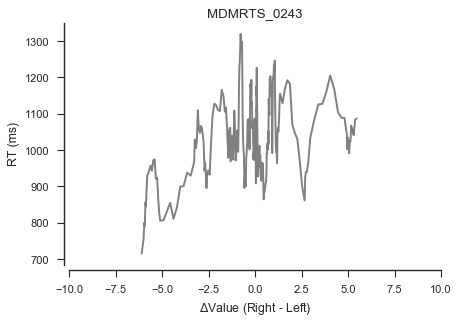

consistency: 0.67
nTrials: 278


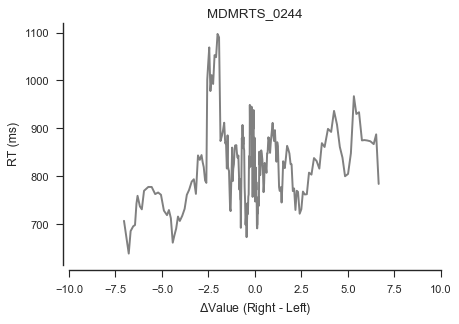

consistency: 0.65
nTrials: 280


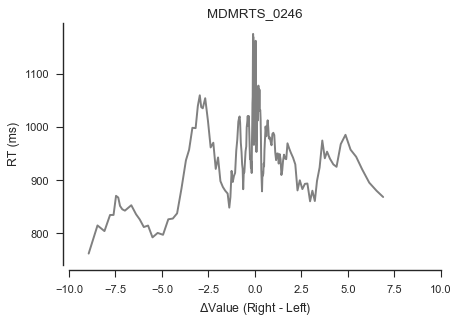

consistency: 0.58
nTrials: 280


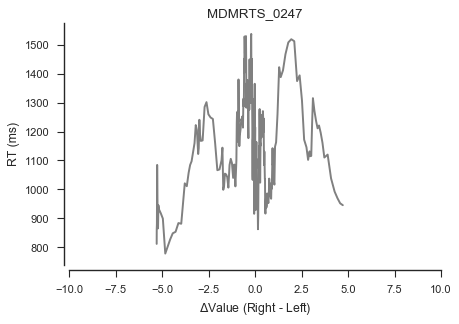

consistency: 0.58
nTrials: 276


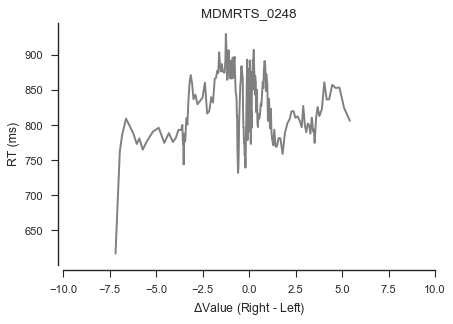

consistency: 0.64
nTrials: 280


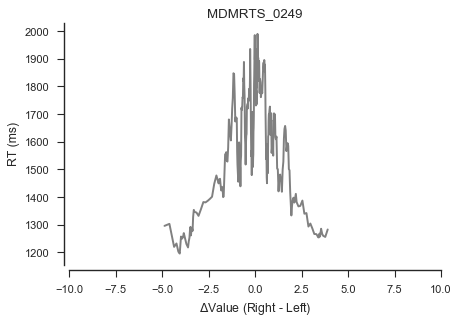

consistency: 0.82
nTrials: 278


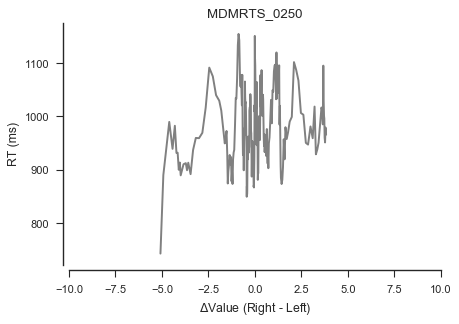

consistency: 0.61
nTrials: 277


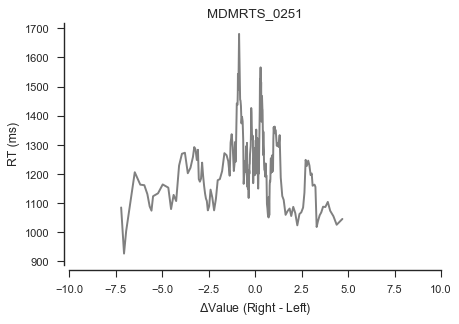

consistency: 0.66
nTrials: 279


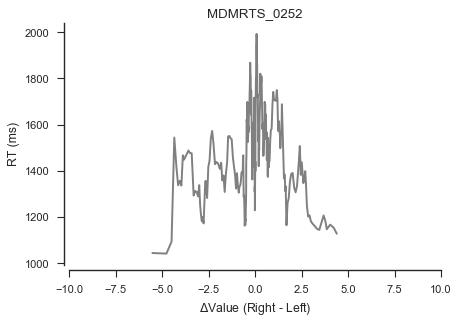

consistency: 0.74
nTrials: 279


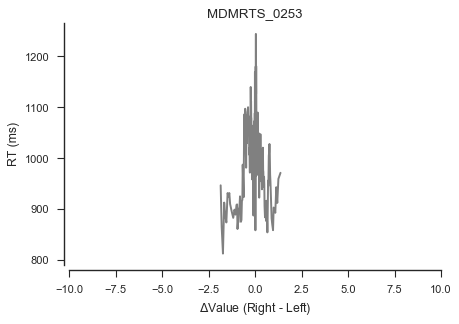

consistency: 0.65
nTrials: 279


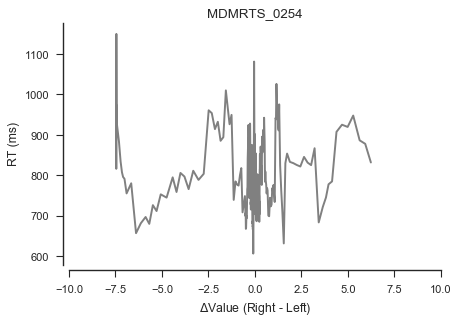

consistency: 0.59
nTrials: 279


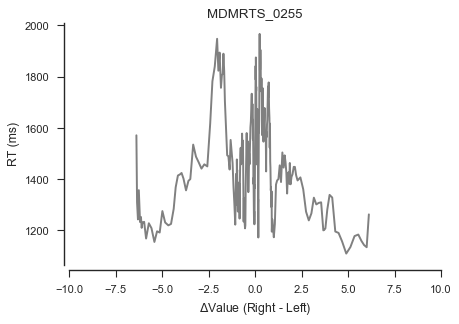

consistency: 0.63
nTrials: 272


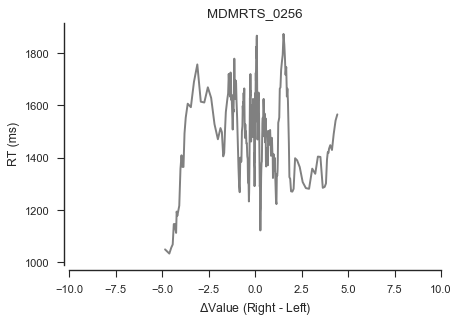

consistency: 0.64
nTrials: 268


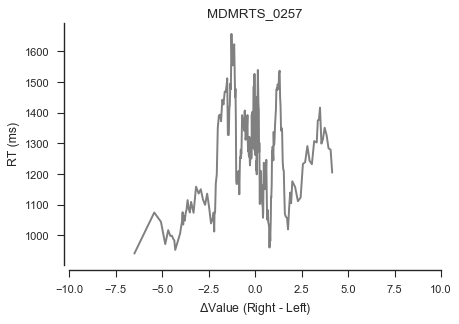

consistency: 0.66
nTrials: 279


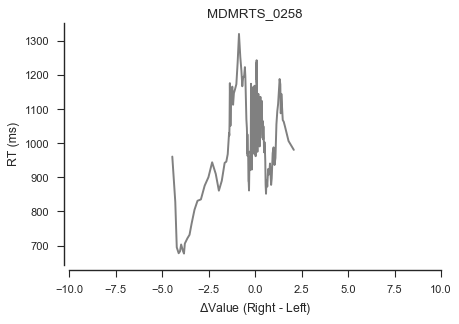

consistency: 0.56
nTrials: 276


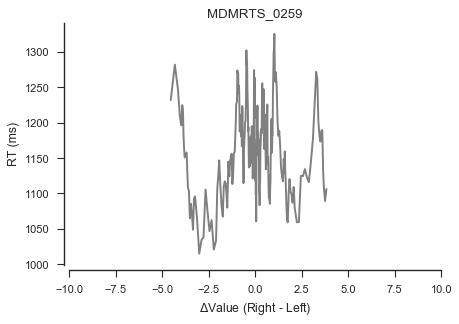

consistency: 0.61
nTrials: 280


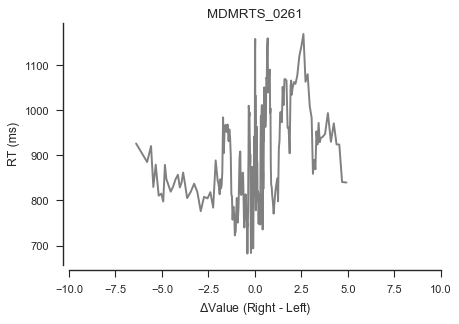

consistency: 0.57
nTrials: 277


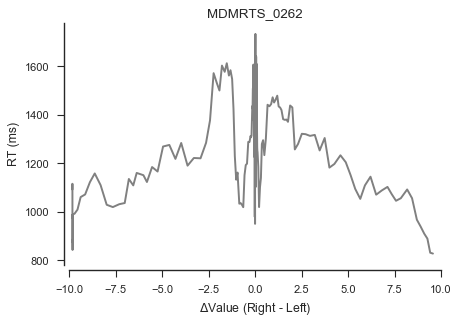

consistency: 0.62
nTrials: 277


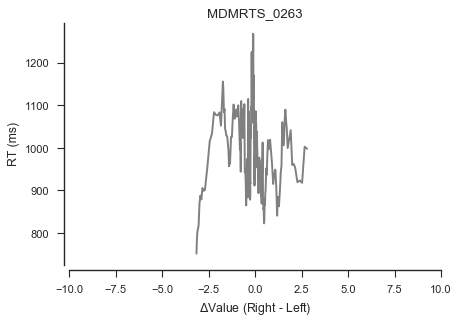

consistency: 0.59
nTrials: 273


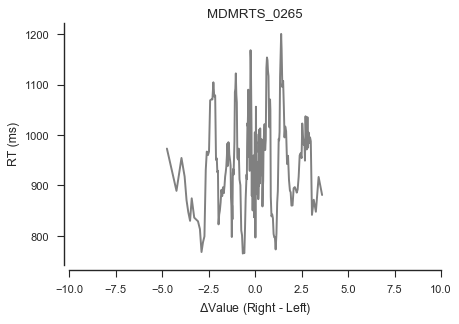

consistency: 0.59
nTrials: 279


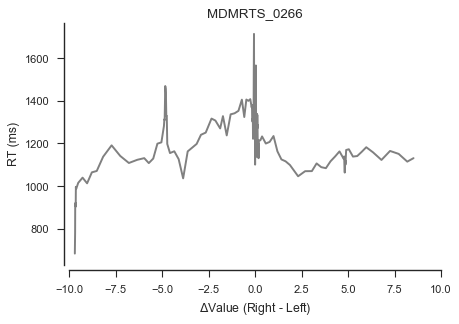

consistency: 0.62
nTrials: 279


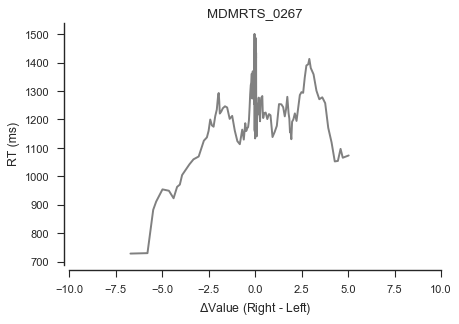

consistency: 0.61
nTrials: 279


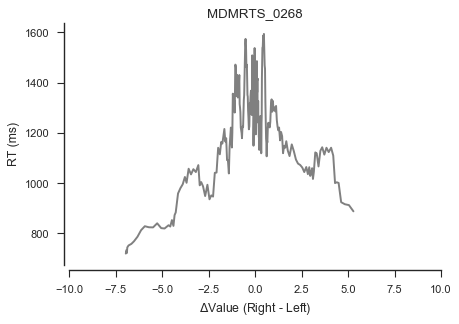

consistency: 0.76
nTrials: 280


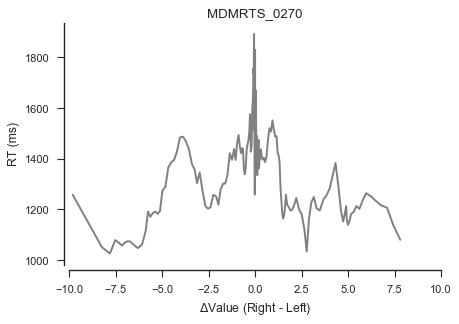

consistency: 0.68
nTrials: 279


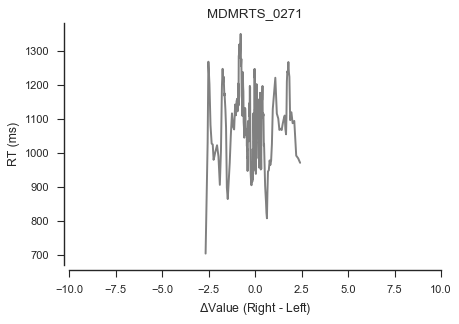

consistency: 0.67
nTrials: 276


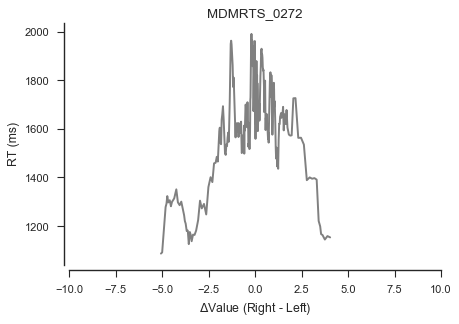

consistency: 0.71
nTrials: 276


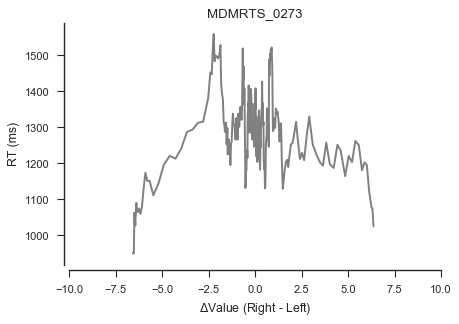

consistency: 0.69
nTrials: 279


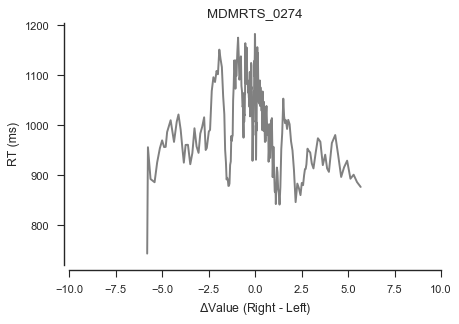

consistency: 0.72
nTrials: 280


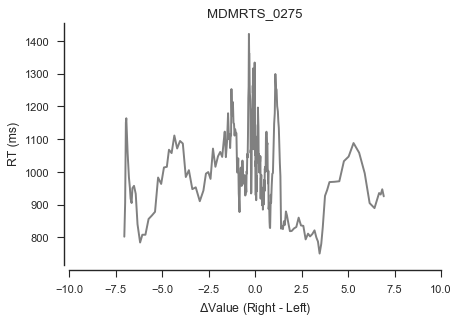

consistency: 0.67
nTrials: 276


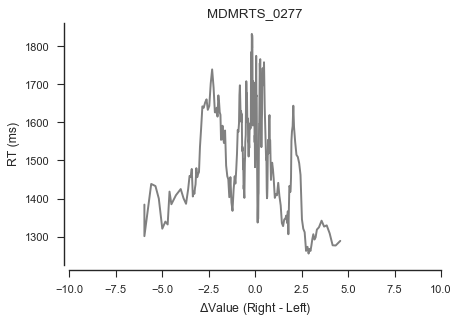

consistency: 0.76
nTrials: 280


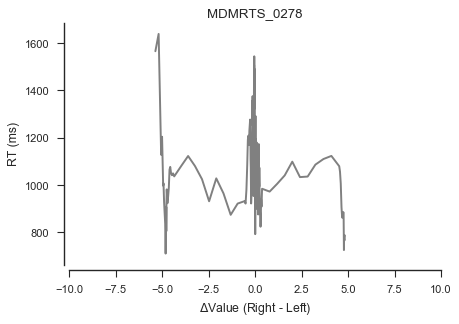

consistency: 0.55
nTrials: 267


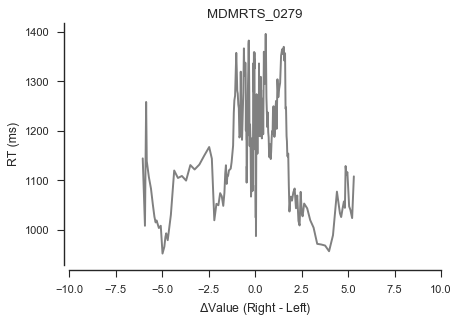

consistency: 0.59
nTrials: 278


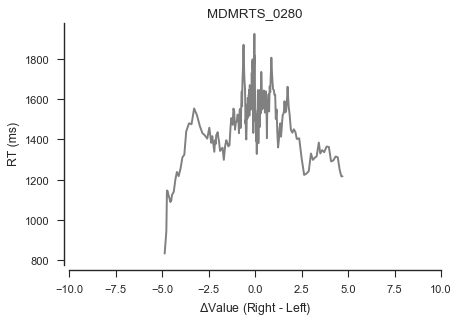

consistency: 0.68
nTrials: 279


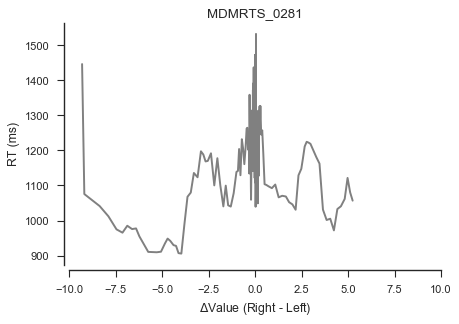

consistency: 0.59
nTrials: 279


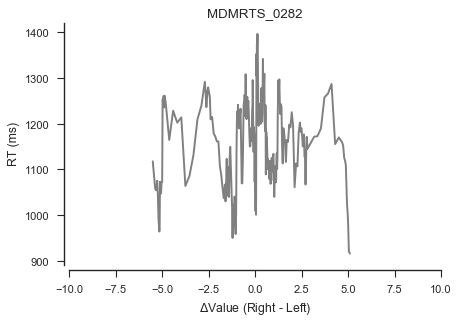

consistency: 0.68
nTrials: 272


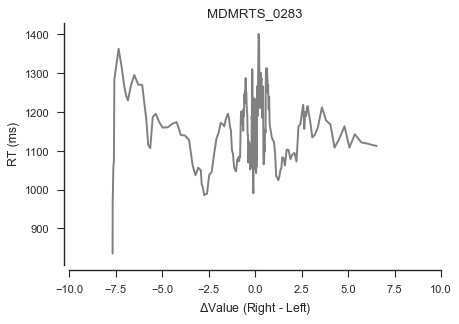

consistency: 0.63
nTrials: 276


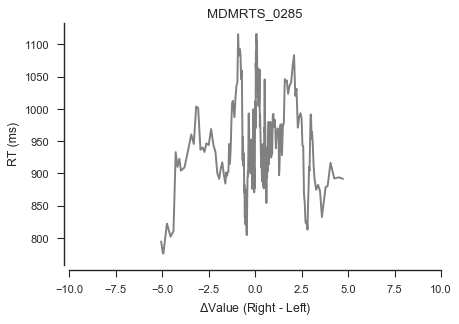

consistency: 0.64
nTrials: 280


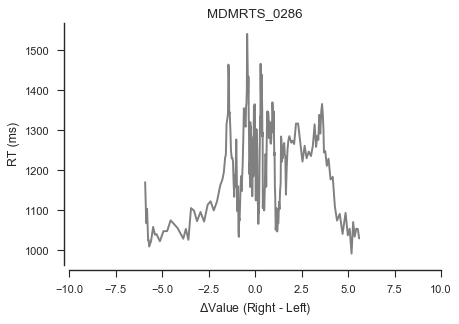

consistency: 0.69
nTrials: 279


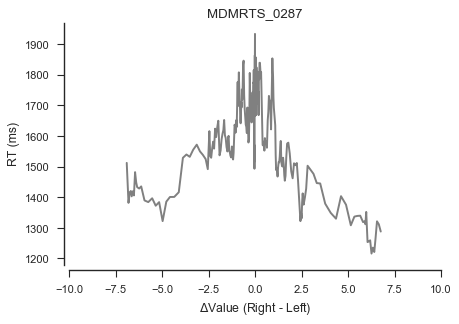

consistency: 0.75
nTrials: 280


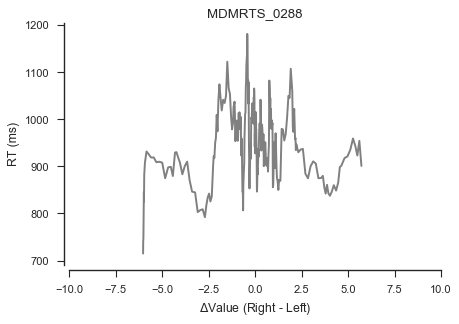

consistency: 0.75
nTrials: 280


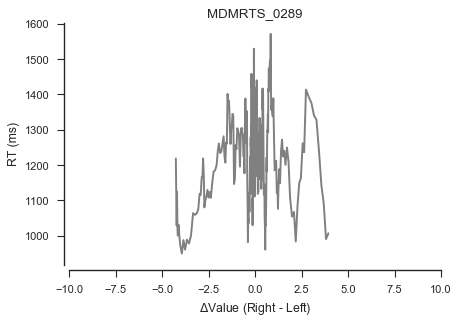

consistency: 0.69
nTrials: 276


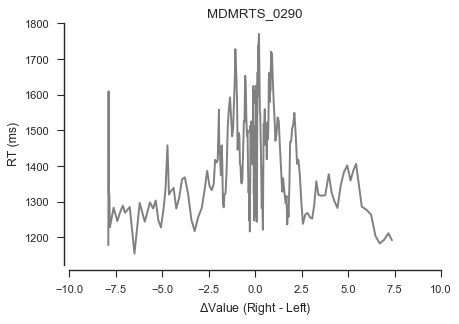

consistency: 0.7
nTrials: 280


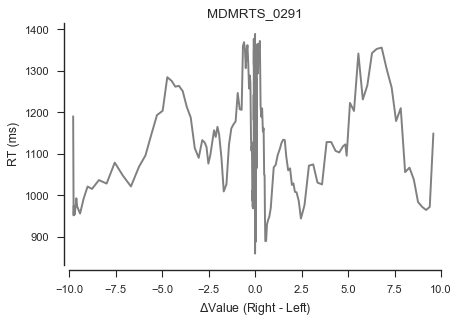

consistency: 0.62
nTrials: 276


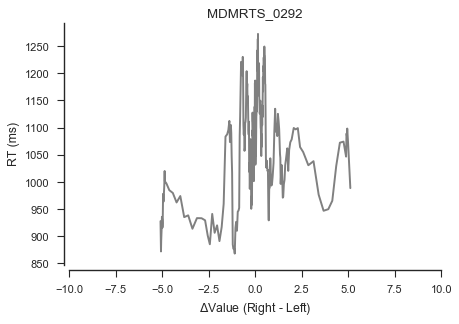

consistency: 0.71
nTrials: 280


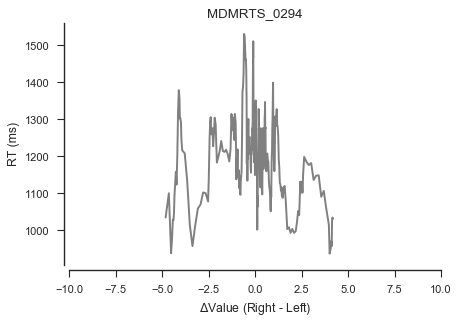

consistency: 0.73
nTrials: 279


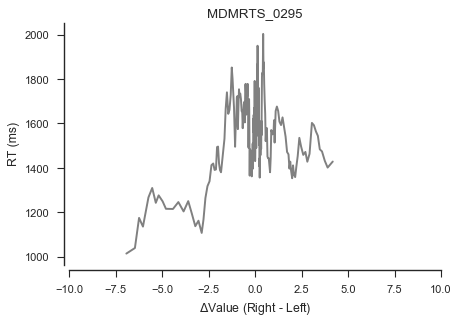

consistency: 0.6
nTrials: 256


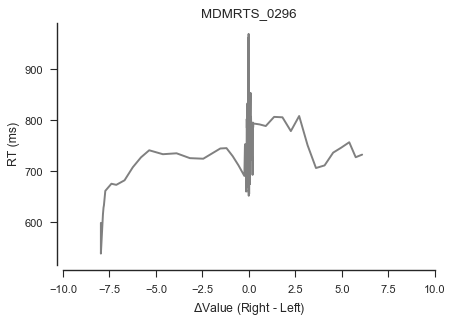

consistency: 0.54
nTrials: 270


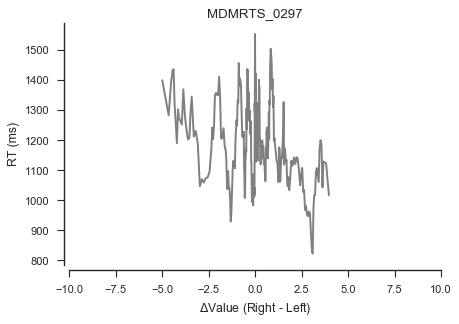

consistency: 0.67
nTrials: 276


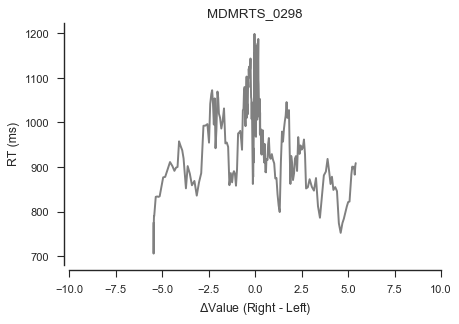

consistency: 0.67
nTrials: 279


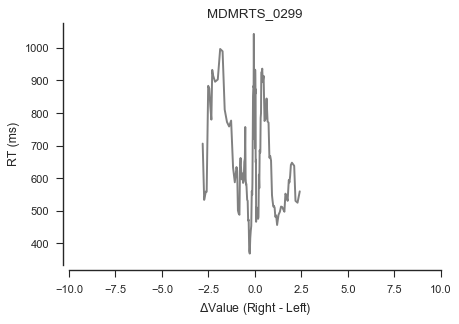

consistency: 0.43
nTrials: 219


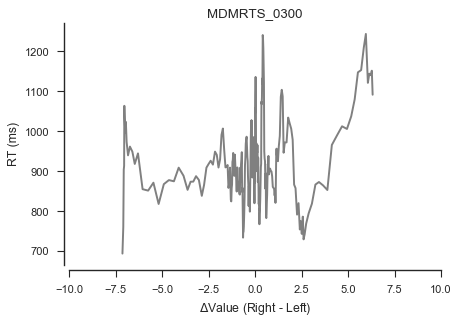

consistency: 0.6
nTrials: 280


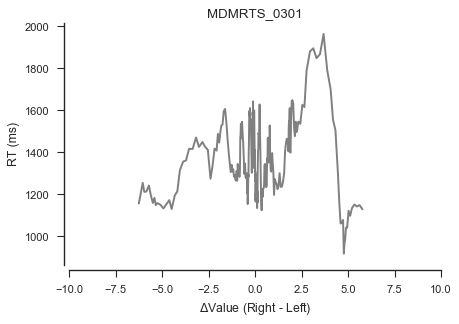

consistency: 0.69
nTrials: 277


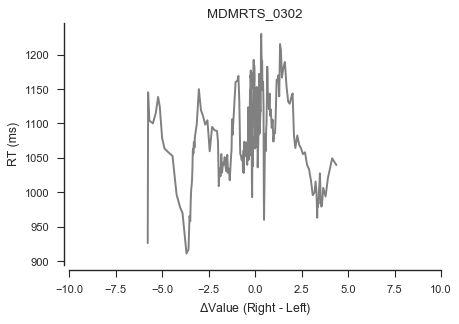

consistency: 0.65
nTrials: 280


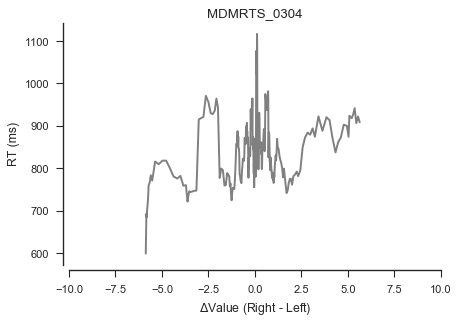

consistency: 0.63
nTrials: 277


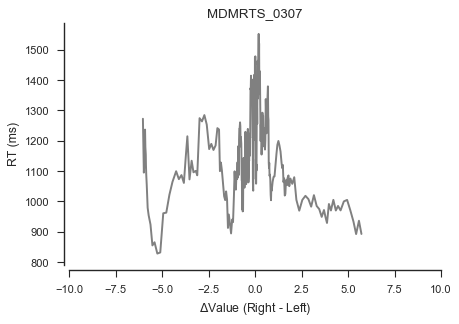

consistency: 0.7
nTrials: 278


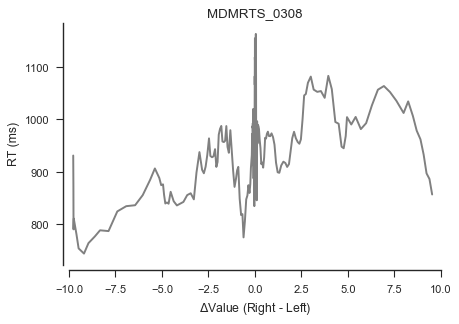

consistency: 0.65
nTrials: 279


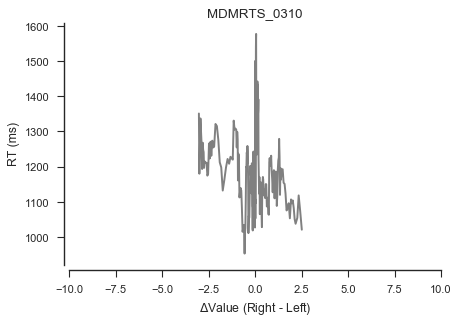

consistency: 0.62
nTrials: 279


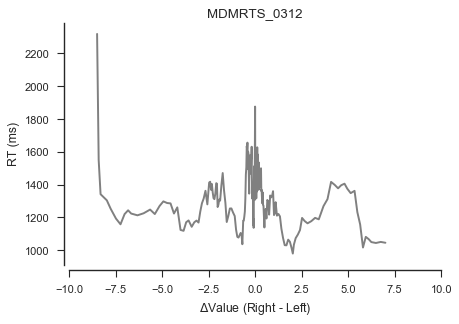

consistency: 0.69
nTrials: 271


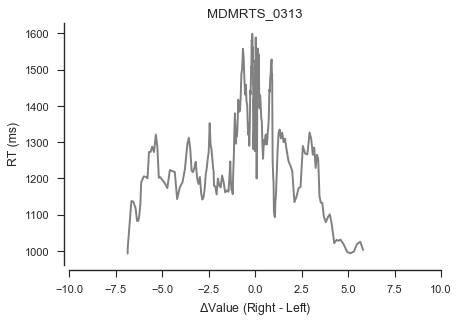

consistency: 0.69
nTrials: 279


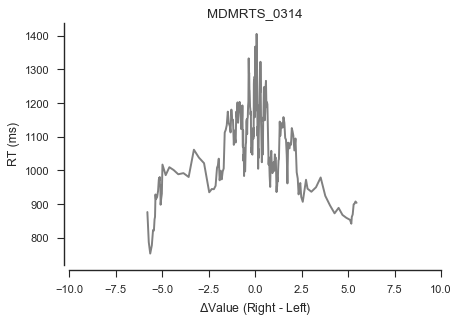

consistency: 0.76
nTrials: 277


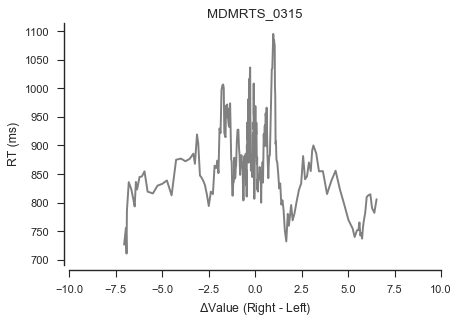

consistency: 0.72
nTrials: 280


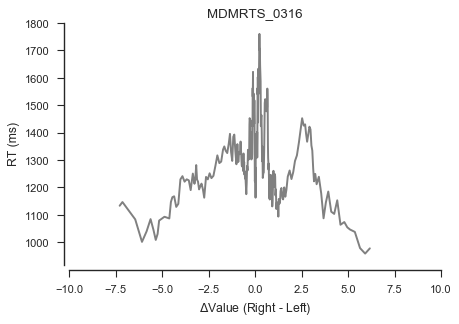

consistency: 0.76
nTrials: 280


In [18]:
get_rt_plots(zscoreRatings=False, printFigs=True)

In [23]:
def get_cleaned_data(df, zscoreRatings):
    # remove trials with no response and where RT <= 300ms
    df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
    
    if np.mean(df['rt']) > 3000:
        df['rt'] = df['rt_UNIX']

    rightStimRatings = df["stimulus2Bid"]
    leftStimRatings = df["stimulus1Bid"]

    if zscoreRatings:
        subjectId = df['subjectId'].values[0]
        mean, std = get_ratings_mean_and_std(subjectId)
        rightStimRatings = (rightStimRatings - mean) / std
        leftStimRatings = (leftStimRatings - mean) / std

    delta = rightStimRatings - leftStimRatings
    rt = df["rt"]
    choseRight = df["selected"] == df["stimulus2"]
    choseRight.replace([True],[1],inplace=True)
    choseRight.replace([False],[0],inplace=True)

    d = {'delta':delta, 'PRight':choseRight, 'RT':rt}

    df2 = pd.DataFrame(data=d)

    df2 = df2.sort_values('delta',axis=0, ascending = True) 
    df2 = df2.reset_index(drop=True)
    return df2

In [24]:
def get_subject_p_logistic_by_familiarity(subjectId, zscoreRatings, printFigs):
    subjectFolder = _dataDir + subjectId + '/'
    choiceFile = subjectFolder + subjectId + choiceFileEnd
    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        familiar_df = df.loc[df['sceneStimulusStatus'] == 'familiar']
        novel_df = df.loc[df['sceneStimulusStatus'] == 'novel']
        
        familiar_df2 = get_cleaned_data(familiar_df, zscoreRatings)
        familiar_y = familiar_df2.rolling(window=10,min_periods=1).mean()
        
        novel_df2 = get_cleaned_data(novel_df, zscoreRatings)
        novel_y = novel_df2.rolling(window=10,min_periods=1).mean()
        
        delta_max = max(np.append(familiar_y['delta'], novel_y['delta'])) + .5
        delta_min = min(np.append(familiar_y['delta'], novel_y['delta'])) - .5
        
        if printFigs:
            plt.rcParams['figure.dpi'] = 80
            fig = plt.figure()
            
            ax_choice = fig.add_subplot(1, 2, 1)
            ax_choice.plot(familiar_y['delta'],familiar_y['PRight'],color='grey')
            ax_choice.set_title(subjectId + ' Familiar')
            ax_choice.set_xlabel(r'$\Delta$Value (Right - Left)')
            ax_choice.set_ylabel('P(respond right)')
            ax_choice.set_xlim(delta_min,delta_max)
            ax_choice.set_ylim(0,1)
            
            ax_choice = fig.add_subplot(1, 2, 2)
            ax_choice.plot(novel_y['delta'],novel_y['PRight'],color='grey')
            ax_choice.set_title(subjectId + ' Novel')
            ax_choice.set_xlabel(r'$\Delta$Value (Right - Left)')
            ax_choice.set_ylabel('P(respond right)')
            ax_choice.set_xlim(delta_min,delta_max)
            ax_choice.set_ylim(0,1)
            
            sns.set_style("whitegrid")
            sns.set(style="ticks")
            sns.despine(offset=5)
            
            plt.tight_layout()
            plt.show()
            
            print "nFamiliarTrials: ", len(familiar_y)
            print "nNovelTrials: ", len(novel_y)
            print

        model = sm.Logit(familiar_df2["PRight"], familiar_df2["delta"])
        result = model.fit(disp=0)
        
        """
        if printFigs:
            print result.summary()
        """
        pval = result.pvalues["delta"]
        
        return familiar_df2, novel_df2, pval
        
def get_p_logistic_plots_by_familiarity(zscoreRatings, printFigs):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    pvals = []
    for subject in subjects:
        sub_fam_df, sub_nov_df, pval = get_subject_p_logistic_by_familiarity(subject, zscoreRatings, printFigs)
        pvals.append(pval)
    results = {"subjectId":subjects, "p value":pvals}
    df = pd.DataFrame(data=results)
    df_sig_pval = df.loc[df['p value'] < 0.05]
    #print df_sig_pval.to_string()
    print "Of", df.shape[0], "subjects,", df_sig_pval.shape[0], "subjects had significant p values for the logistic regression."
    return df_sig_pval

total number of people who accepted the HIT 316
102 subjects completed the auction and choice tasks.


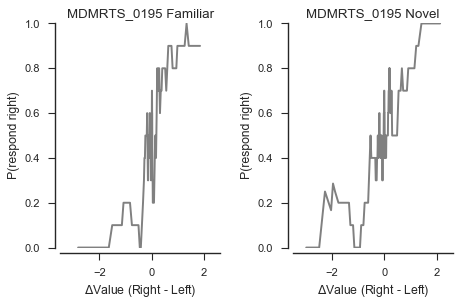

nFamiliarTrials:  137
nNovelTrials:  139



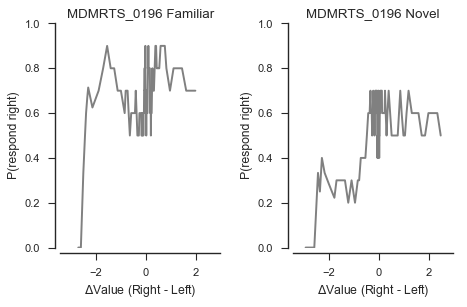

nFamiliarTrials:  121
nNovelTrials:  120



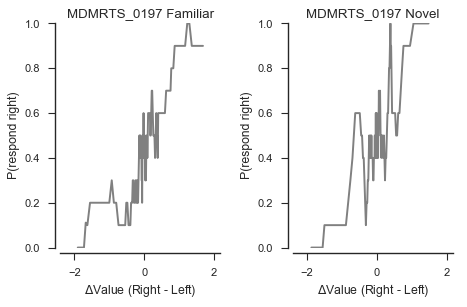

nFamiliarTrials:  140
nNovelTrials:  140



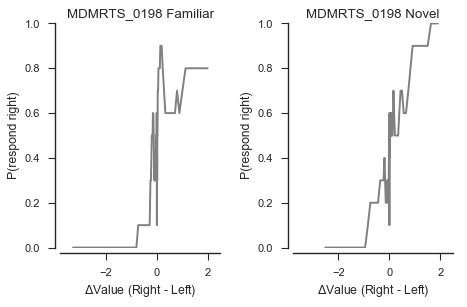

nFamiliarTrials:  139
nNovelTrials:  139



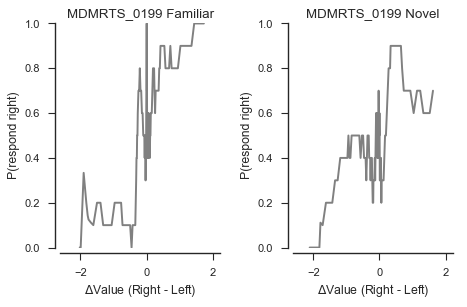

nFamiliarTrials:  137
nNovelTrials:  136



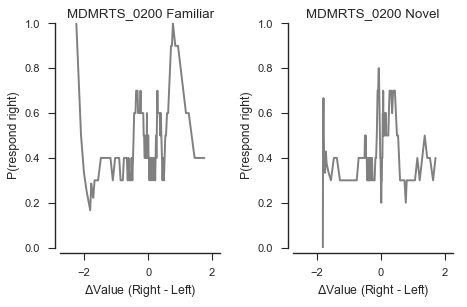

nFamiliarTrials:  136
nNovelTrials:  130



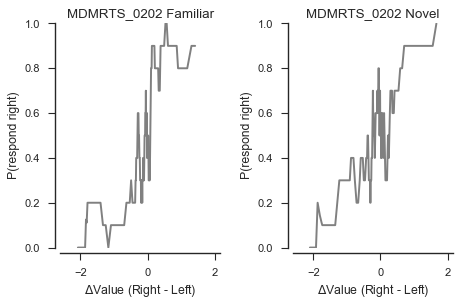

nFamiliarTrials:  139
nNovelTrials:  139



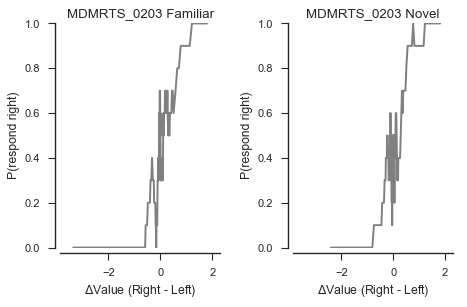

nFamiliarTrials:  140
nNovelTrials:  140



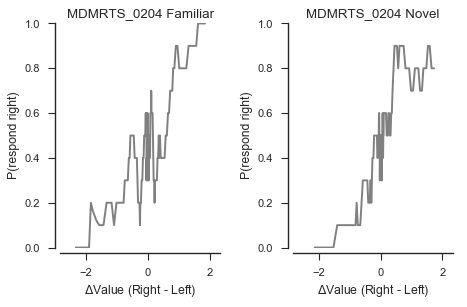

nFamiliarTrials:  140
nNovelTrials:  140



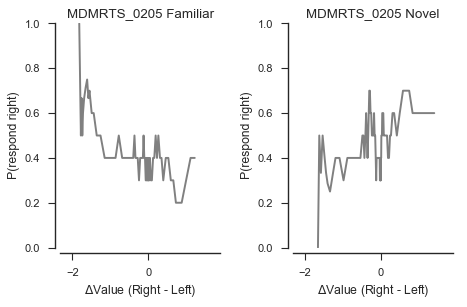

nFamiliarTrials:  71
nNovelTrials:  89



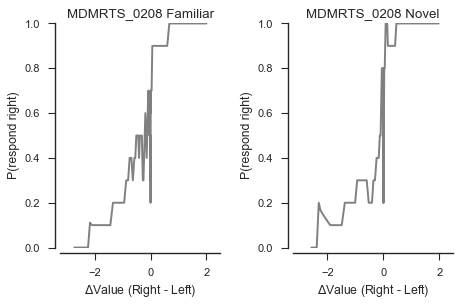

nFamiliarTrials:  140
nNovelTrials:  140



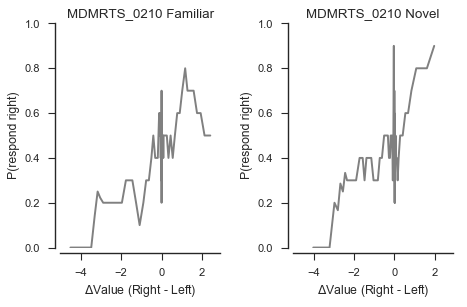

nFamiliarTrials:  140
nNovelTrials:  140



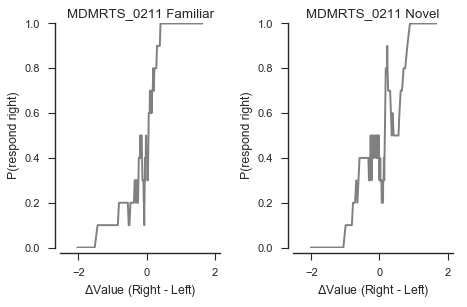

nFamiliarTrials:  140
nNovelTrials:  140



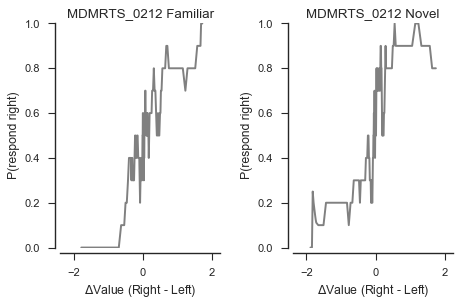

nFamiliarTrials:  140
nNovelTrials:  140



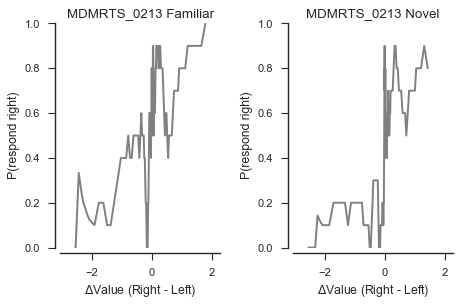

nFamiliarTrials:  139
nNovelTrials:  140



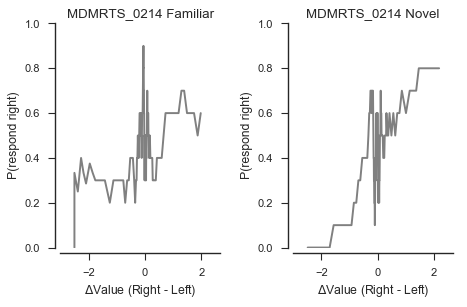

nFamiliarTrials:  125
nNovelTrials:  133



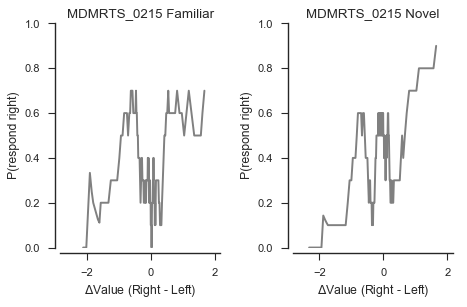

nFamiliarTrials:  138
nNovelTrials:  139



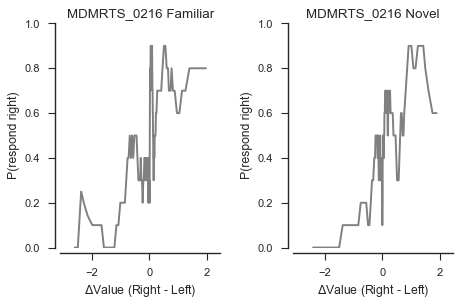

nFamiliarTrials:  140
nNovelTrials:  140



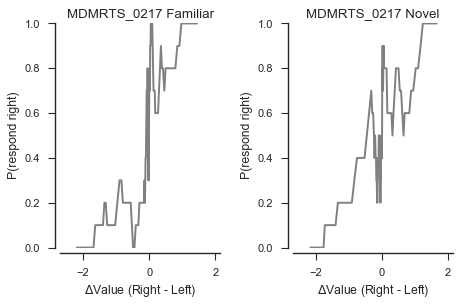

nFamiliarTrials:  140
nNovelTrials:  138



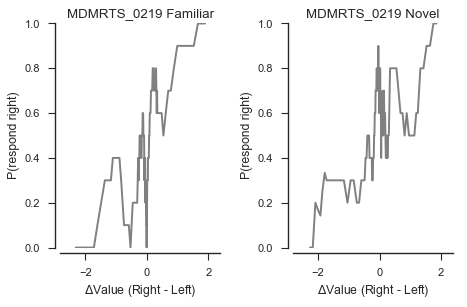

nFamiliarTrials:  140
nNovelTrials:  139



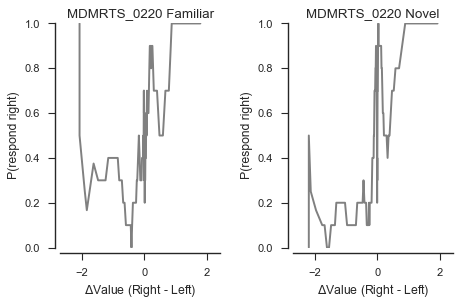

nFamiliarTrials:  130
nNovelTrials:  140



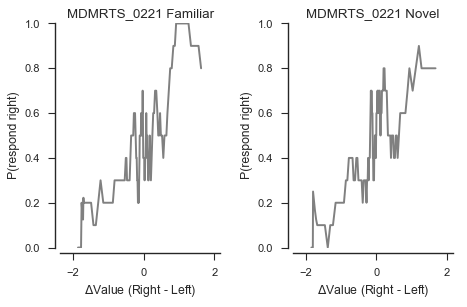

nFamiliarTrials:  138
nNovelTrials:  138



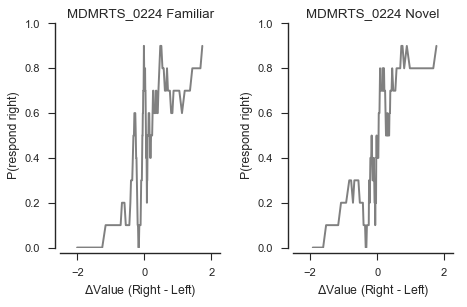

nFamiliarTrials:  138
nNovelTrials:  138



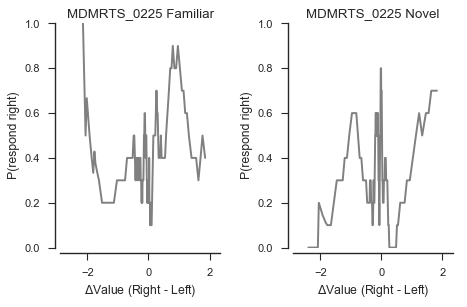

nFamiliarTrials:  139
nNovelTrials:  135



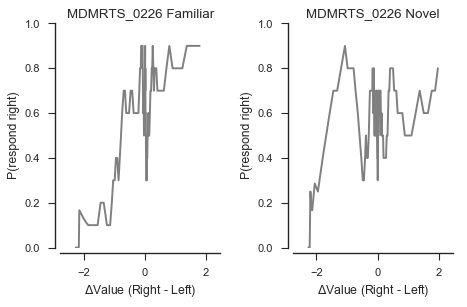

nFamiliarTrials:  140
nNovelTrials:  138



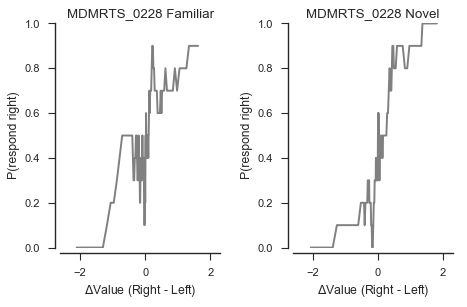

nFamiliarTrials:  138
nNovelTrials:  138



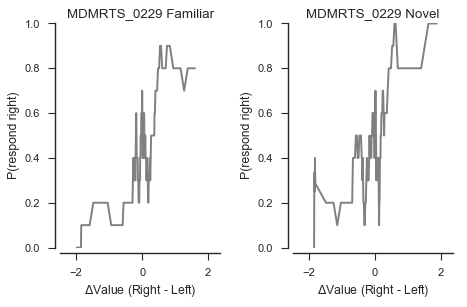

nFamiliarTrials:  140
nNovelTrials:  140



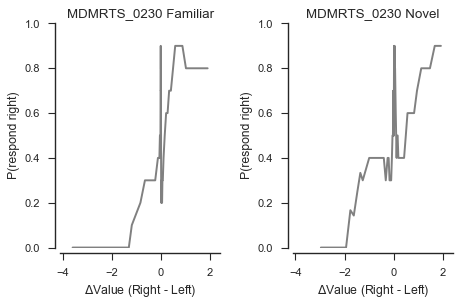

nFamiliarTrials:  64
nNovelTrials:  76



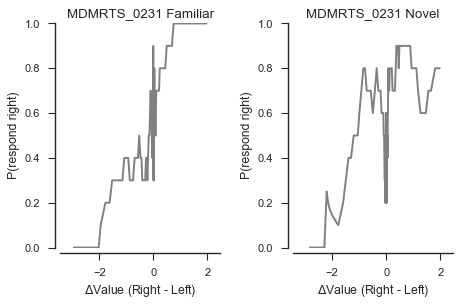

nFamiliarTrials:  140
nNovelTrials:  138



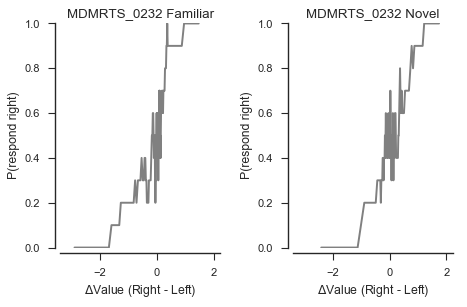

nFamiliarTrials:  140
nNovelTrials:  140



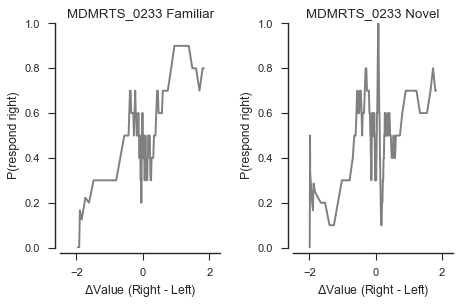

nFamiliarTrials:  132
nNovelTrials:  132



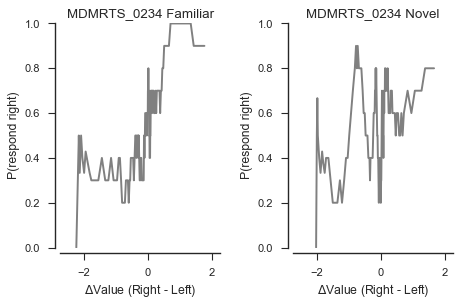

nFamiliarTrials:  140
nNovelTrials:  140



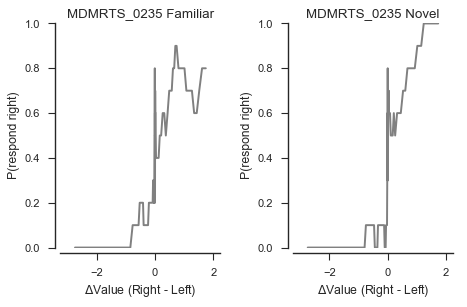

nFamiliarTrials:  140
nNovelTrials:  138



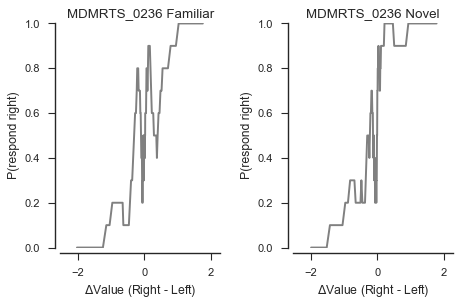

nFamiliarTrials:  134
nNovelTrials:  134



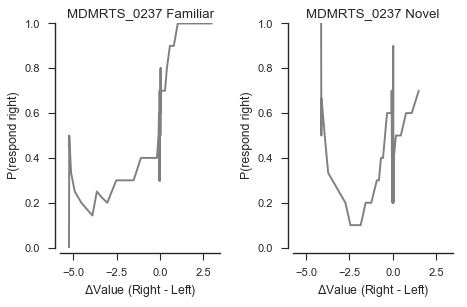

nFamiliarTrials:  126
nNovelTrials:  126



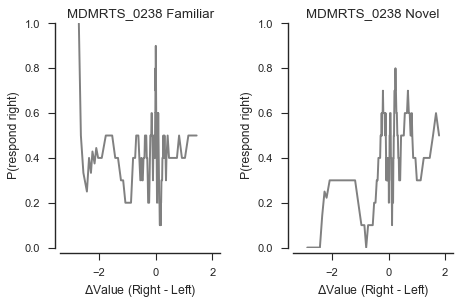

nFamiliarTrials:  139
nNovelTrials:  140



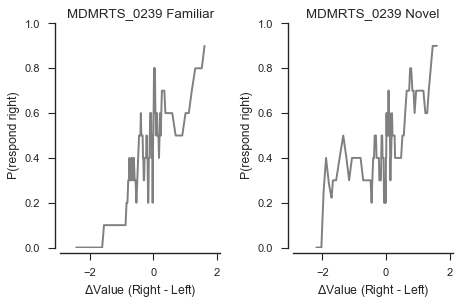

nFamiliarTrials:  140
nNovelTrials:  138



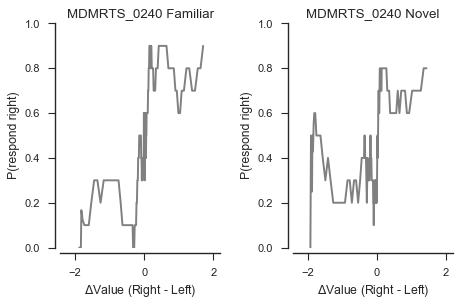

nFamiliarTrials:  140
nNovelTrials:  139



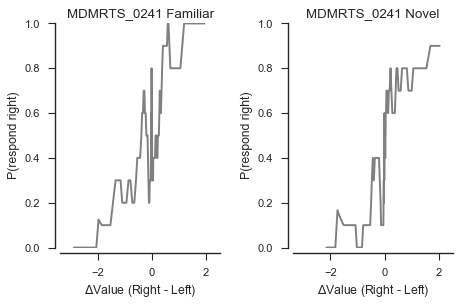

nFamiliarTrials:  140
nNovelTrials:  140



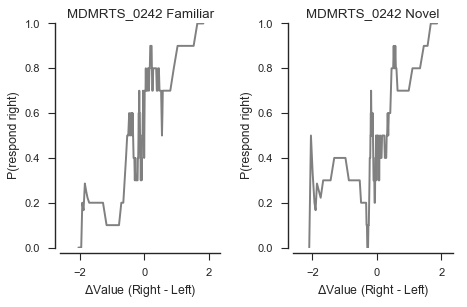

nFamiliarTrials:  137
nNovelTrials:  139



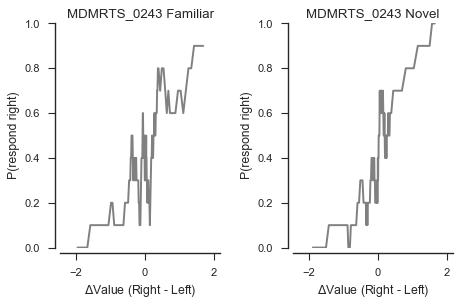

nFamiliarTrials:  139
nNovelTrials:  139



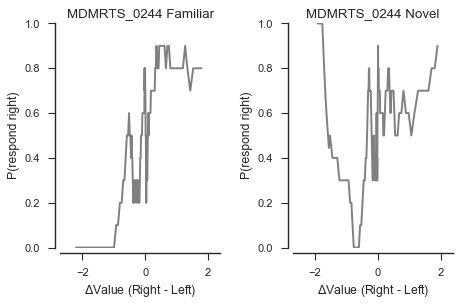

nFamiliarTrials:  140
nNovelTrials:  140



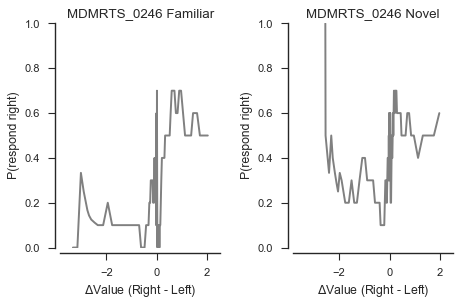

nFamiliarTrials:  140
nNovelTrials:  140



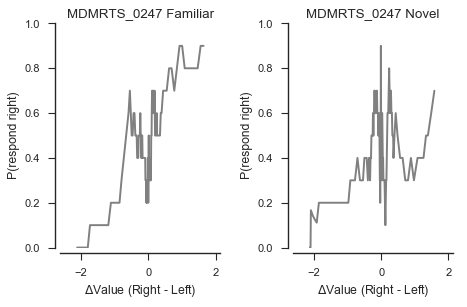

nFamiliarTrials:  139
nNovelTrials:  137



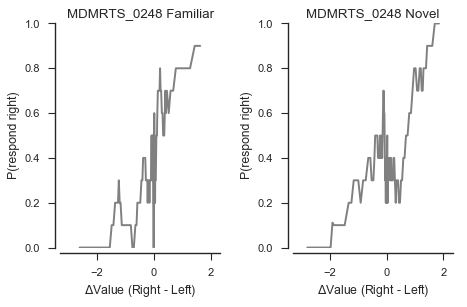

nFamiliarTrials:  140
nNovelTrials:  140



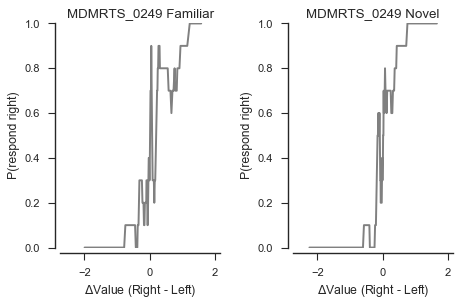

nFamiliarTrials:  140
nNovelTrials:  138



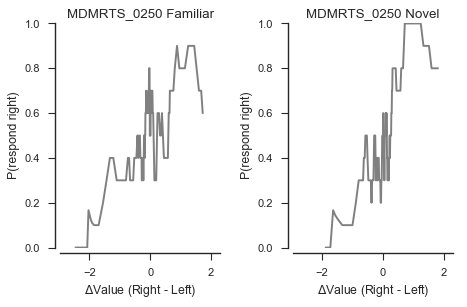

nFamiliarTrials:  138
nNovelTrials:  139



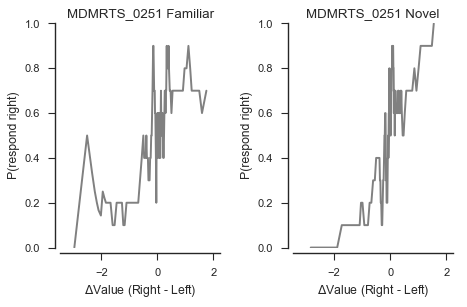

nFamiliarTrials:  139
nNovelTrials:  140



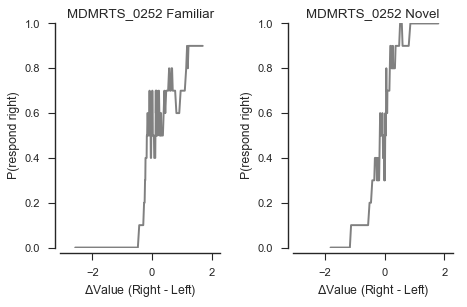

nFamiliarTrials:  140
nNovelTrials:  139



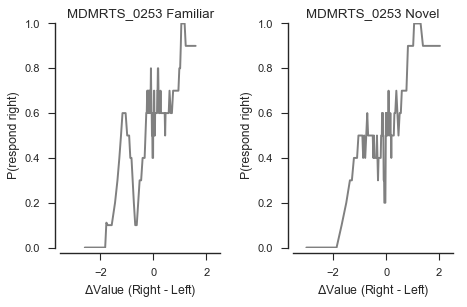

nFamiliarTrials:  140
nNovelTrials:  139



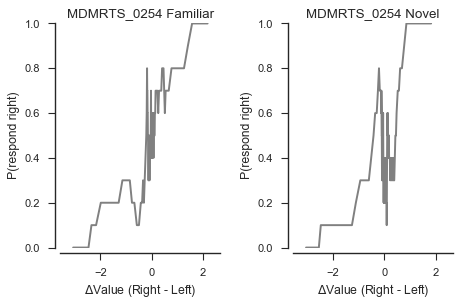

nFamiliarTrials:  139
nNovelTrials:  139



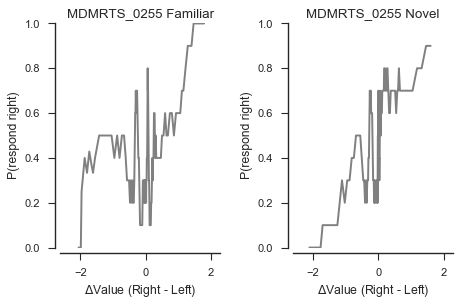

nFamiliarTrials:  135
nNovelTrials:  137



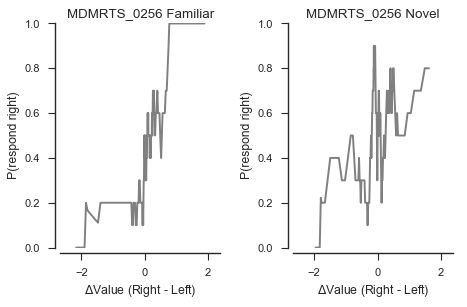

nFamiliarTrials:  132
nNovelTrials:  136



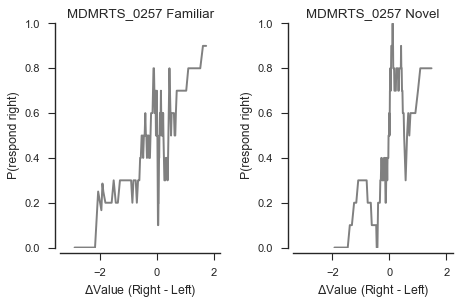

nFamiliarTrials:  140
nNovelTrials:  139



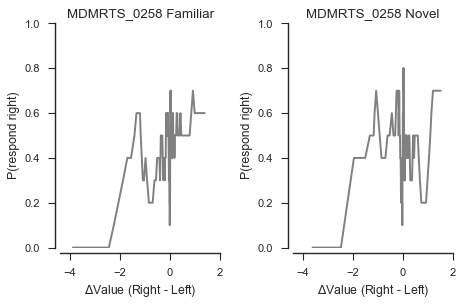

nFamiliarTrials:  139
nNovelTrials:  137



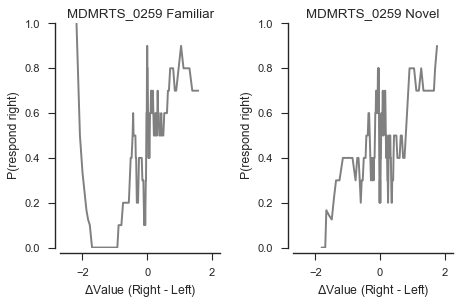

nFamiliarTrials:  140
nNovelTrials:  139



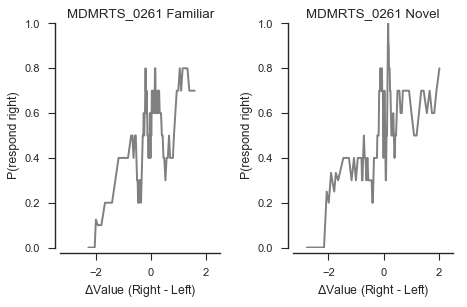

nFamiliarTrials:  137
nNovelTrials:  139



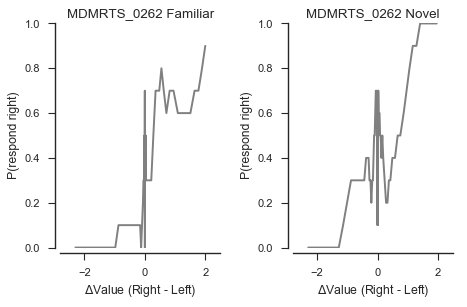

nFamiliarTrials:  139
nNovelTrials:  138



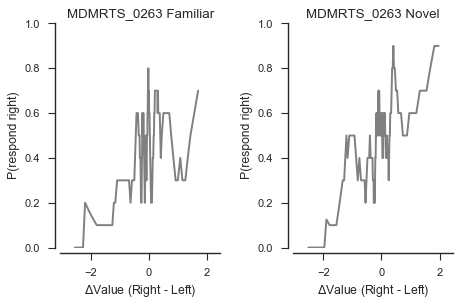

nFamiliarTrials:  136
nNovelTrials:  136



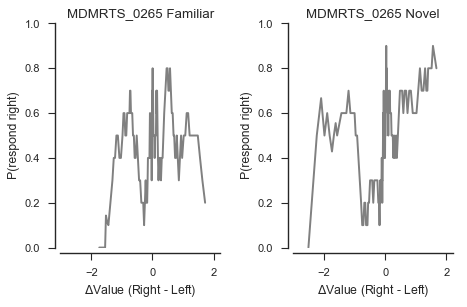

nFamiliarTrials:  140
nNovelTrials:  139



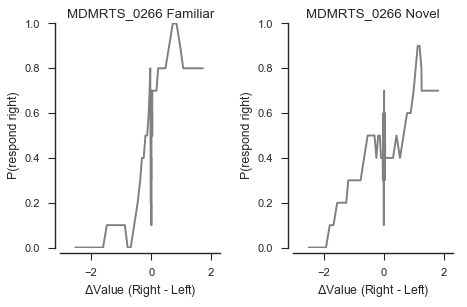

nFamiliarTrials:  139
nNovelTrials:  140



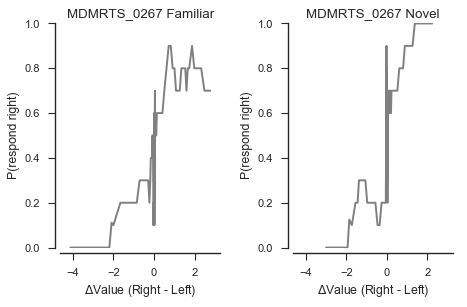

nFamiliarTrials:  140
nNovelTrials:  139



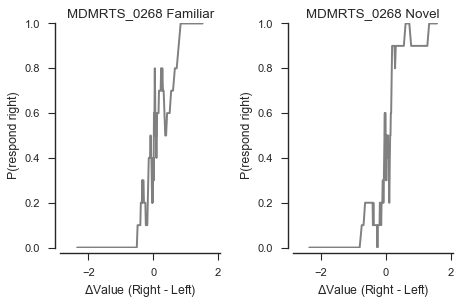

nFamiliarTrials:  140
nNovelTrials:  140



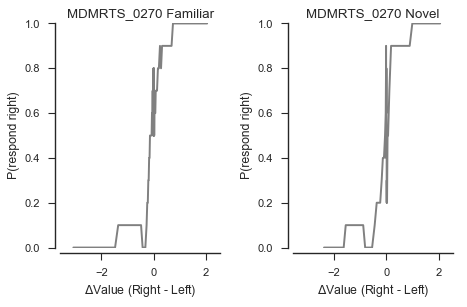

nFamiliarTrials:  139
nNovelTrials:  140



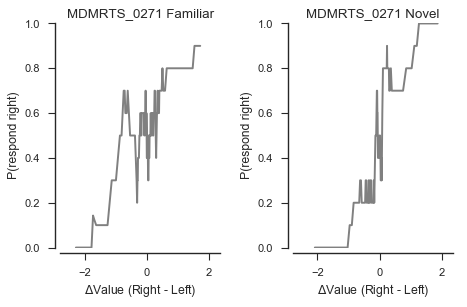

nFamiliarTrials:  132
nNovelTrials:  134



/Users/alicexue/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


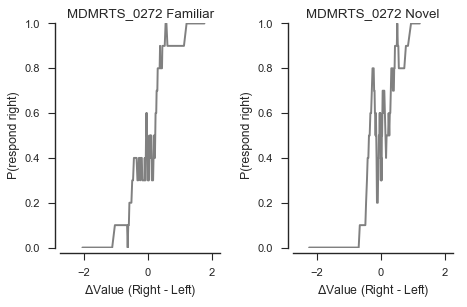

nFamiliarTrials:  138
nNovelTrials:  138



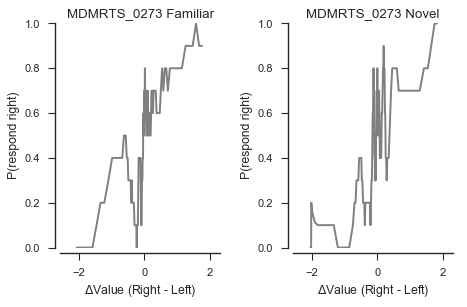

nFamiliarTrials:  140
nNovelTrials:  139



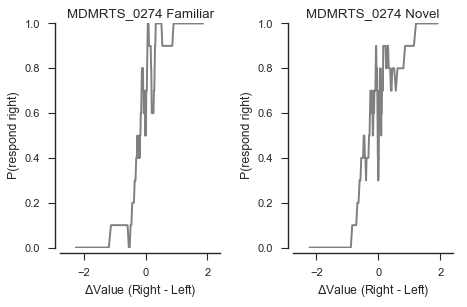

nFamiliarTrials:  140
nNovelTrials:  140



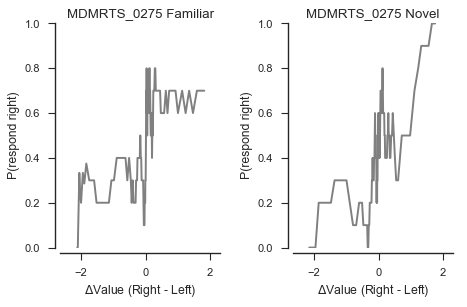

nFamiliarTrials:  135
nNovelTrials:  139



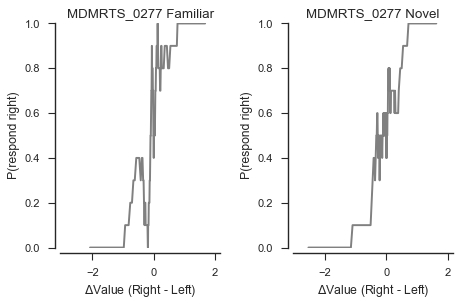

nFamiliarTrials:  140
nNovelTrials:  140



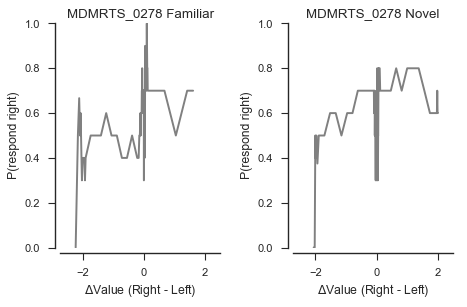

nFamiliarTrials:  130
nNovelTrials:  131



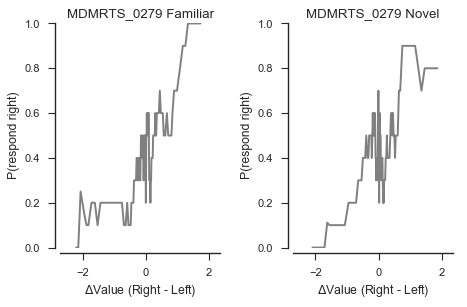

nFamiliarTrials:  138
nNovelTrials:  140



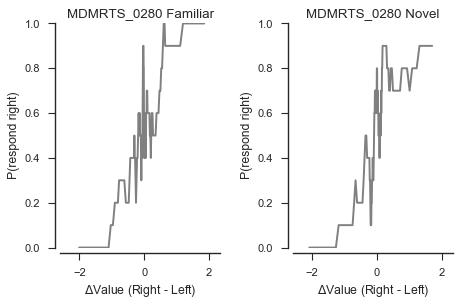

nFamiliarTrials:  139
nNovelTrials:  140



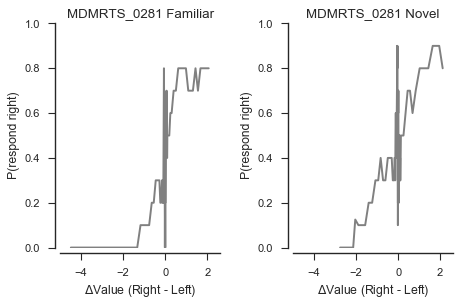

nFamiliarTrials:  140
nNovelTrials:  138



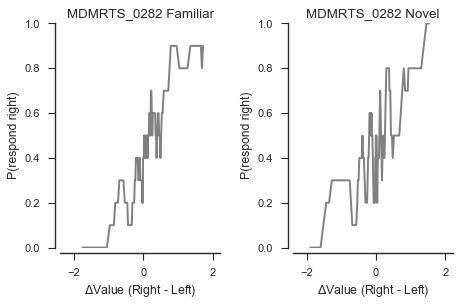

nFamiliarTrials:  135
nNovelTrials:  137



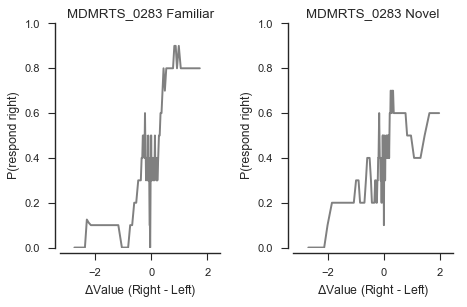

nFamiliarTrials:  138
nNovelTrials:  138



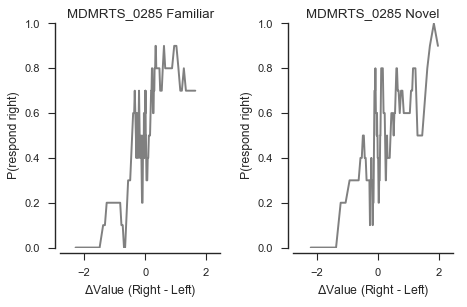

nFamiliarTrials:  140
nNovelTrials:  140



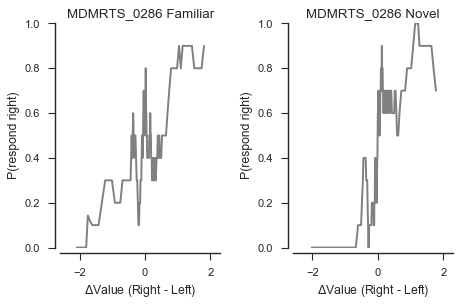

nFamiliarTrials:  139
nNovelTrials:  140



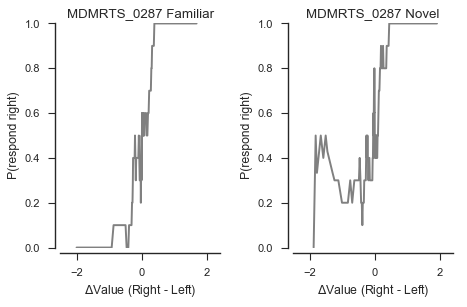

nFamiliarTrials:  140
nNovelTrials:  140



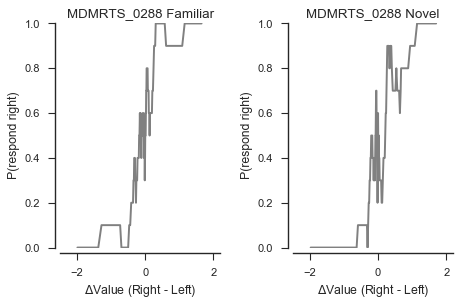

nFamiliarTrials:  140
nNovelTrials:  140



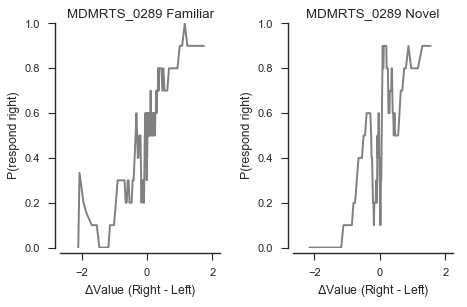

nFamiliarTrials:  138
nNovelTrials:  138



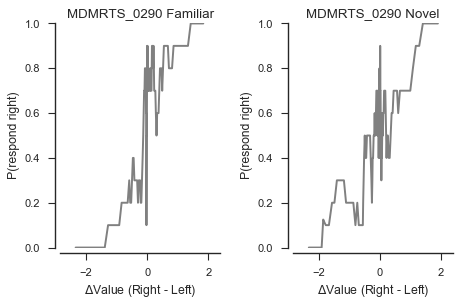

nFamiliarTrials:  140
nNovelTrials:  140



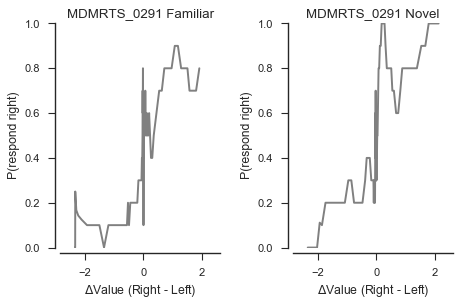

nFamiliarTrials:  138
nNovelTrials:  138



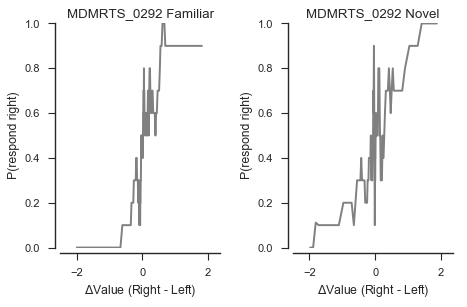

nFamiliarTrials:  140
nNovelTrials:  140



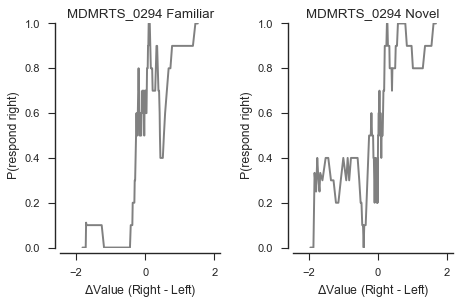

nFamiliarTrials:  139
nNovelTrials:  140



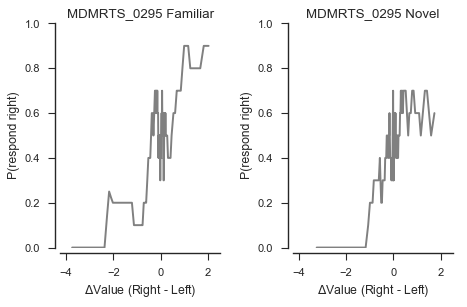

nFamiliarTrials:  127
nNovelTrials:  129



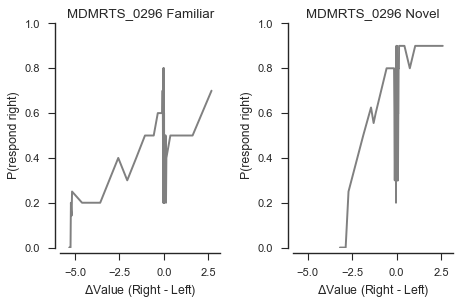

nFamiliarTrials:  126
nNovelTrials:  142



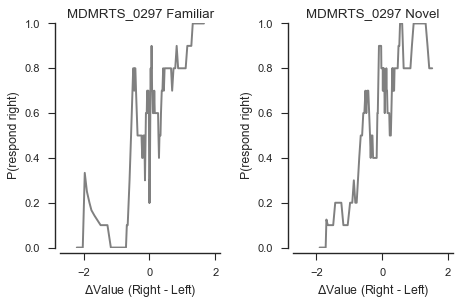

nFamiliarTrials:  138
nNovelTrials:  138



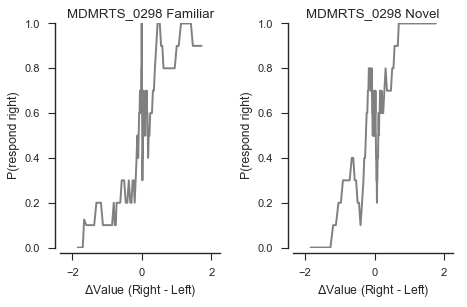

nFamiliarTrials:  139
nNovelTrials:  140



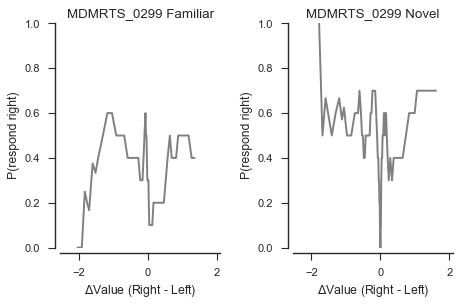

nFamiliarTrials:  60
nNovelTrials:  77



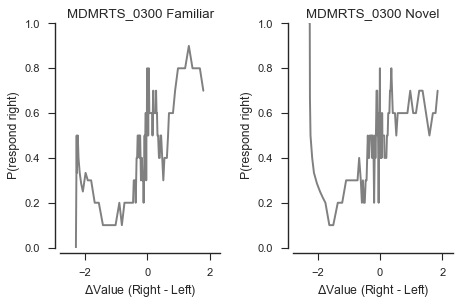

nFamiliarTrials:  140
nNovelTrials:  139



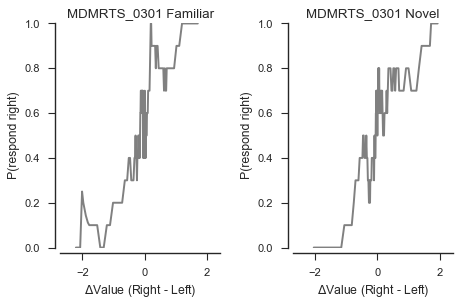

nFamiliarTrials:  138
nNovelTrials:  139



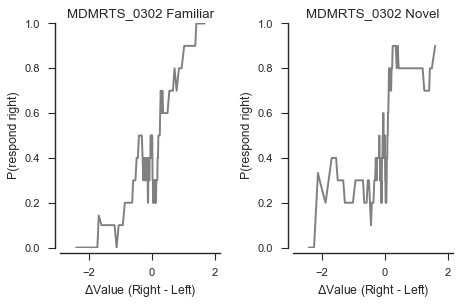

nFamiliarTrials:  140
nNovelTrials:  140



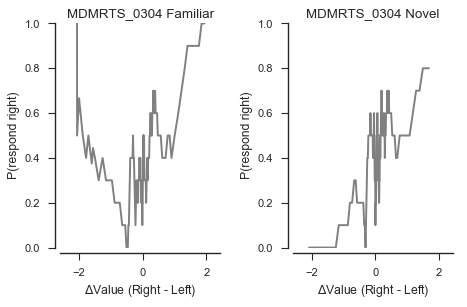

nFamiliarTrials:  139
nNovelTrials:  138



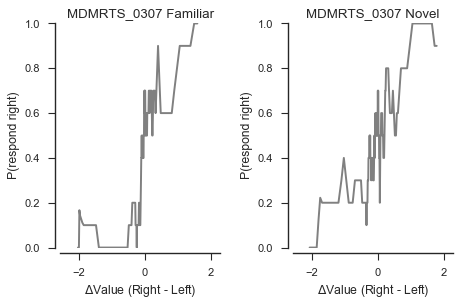

nFamiliarTrials:  139
nNovelTrials:  138



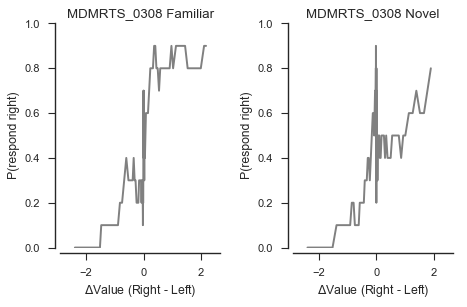

nFamiliarTrials:  139
nNovelTrials:  140



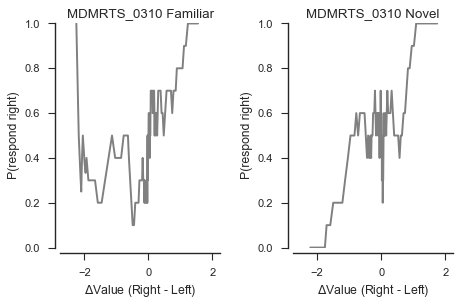

nFamiliarTrials:  139
nNovelTrials:  140



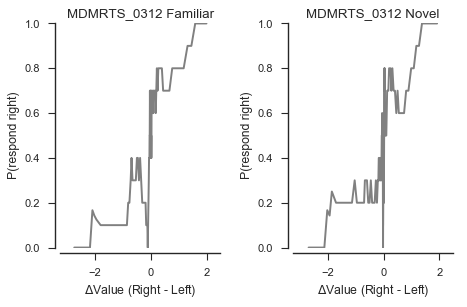

nFamiliarTrials:  133
nNovelTrials:  136



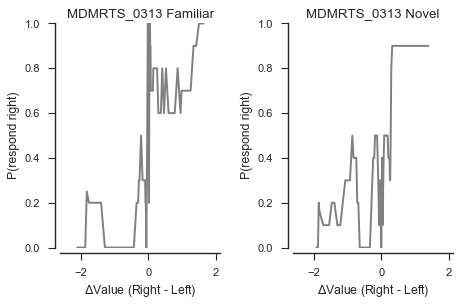

nFamiliarTrials:  152
nNovelTrials:  127



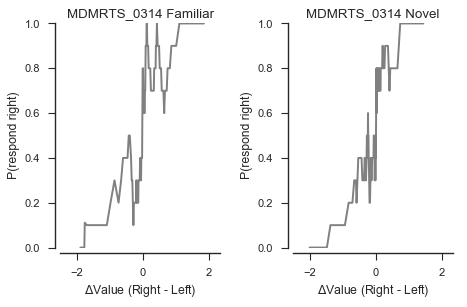

nFamiliarTrials:  138
nNovelTrials:  139



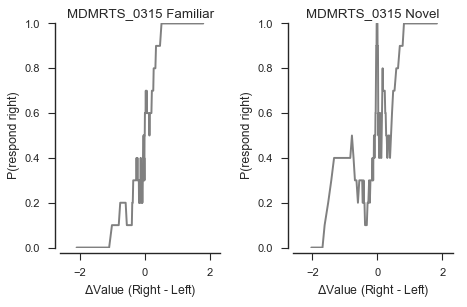

nFamiliarTrials:  140
nNovelTrials:  140



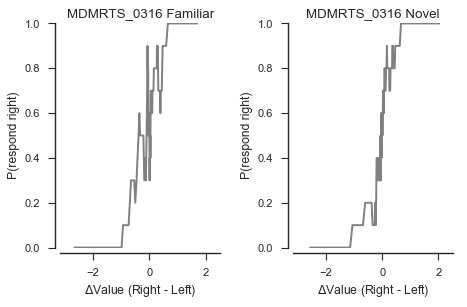

nFamiliarTrials:  140
nNovelTrials:  140

Of 102 subjects, 91 subjects had significant p values for the logistic regression.


In [25]:
get_p_logistic_plots_by_familiarity(zscoreRatings=True, printFigs=True);

In [26]:
def get_subject_rt_by_familiarity(subjectId, zscoreRatings, printFigs):
    subjectFolder = _dataDir + subjectId + '/'
    choiceFile = subjectFolder + subjectId + choiceFileEnd
    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        familiar_df = df.loc[df['sceneStimulusStatus'] == 'familiar']
        novel_df = df.loc[df['sceneStimulusStatus'] == 'novel']
        
        familiar_df2 = get_cleaned_data(familiar_df, zscoreRatings)
        familiar_y = familiar_df2.rolling(window=10,min_periods=1).mean()
        
        novel_df2 = get_cleaned_data(novel_df, zscoreRatings)
        novel_y = novel_df2.rolling(window=10,min_periods=1).mean()
        
        delta_max = max(np.append(familiar_y['delta'], novel_y['delta'])) + .5
        delta_min = min(np.append(familiar_y['delta'], novel_y['delta'])) - .5
        
        rt_max = max(np.append(familiar_y['RT'], novel_y['RT'])) + .5
        rt_min = min(np.append(familiar_y['RT'], novel_y['RT'])) - .5
        
        if printFigs:
            plt.rcParams['figure.dpi'] = 80
            fig = plt.figure()
            ax_rt = fig.add_subplot(1, 2, 1)
            ax_rt.plot(familiar_y['delta'],familiar_y['RT'],color='grey')
            ax_rt.set_title(subjectId + ' Familiar')
            ax_rt.set_xlabel(r'$\Delta$Value (Right - Left)')
            ax_rt.set_ylabel('RT (ms)')
            ax_rt.set_xlim(delta_min,delta_max)
            ax_rt.set_ylim(rt_min,rt_max)
            
            ax_rt = fig.add_subplot(1, 2, 2)
            ax_rt.plot(novel_y['delta'],novel_y['RT'],color='grey')
            ax_rt.set_title(subjectId + ' Novel')
            ax_rt.set_xlabel(r'$\Delta$Value (Right - Left)')
            ax_rt.set_ylabel('RT (ms)')
            ax_rt.set_xlim(delta_min,delta_max)
            ax_rt.set_ylim(rt_min,rt_max)
            
            sns.set_style("whitegrid")
            sns.set(style="ticks")
            sns.despine(offset=5)
            
            plt.tight_layout()
            plt.show()
            
            print "nFamiliarTrials: ", len(familiar_y)
            print "nNovelTrials: ", len(novel_y)
            print
        
            print 'mean RT in familiar condition:', mean(familiar_y['RT'])
            print 'mean RT novel condition:', mean(novel_y['RT'])
            print 
            print 'median RT in familiar condition:', np.median(familiar_y['RT'])
            print 'median RT novel condition:', np.median(novel_y['RT'])
            print
        return familiar_df2, novel_df2
        
def get_rt_plots_by_familiarity(zscoreRatings, printFigs):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    pvals = []
    for subject in subjects:
        sub_fam_df, sub_nov_df = get_subject_rt_by_familiarity(subject, zscoreRatings, printFigs)

total number of people who accepted the HIT 316
102 subjects completed the auction and choice tasks.


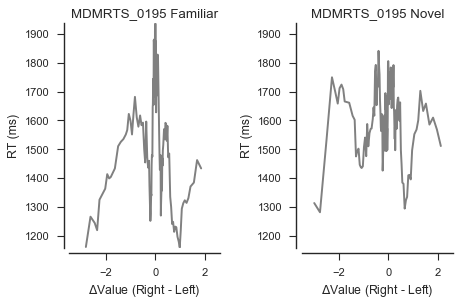

nFamiliarTrials:  137
nNovelTrials:  139

mean RT in familiar condition: 1548.56726596
mean RT novel condition: 1609.55734584

median RT in familiar condition: 1535.4900000010005
median RT novel condition: 1618.8899999969997



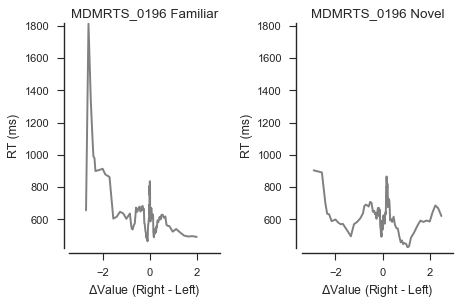

nFamiliarTrials:  121
nNovelTrials:  120

mean RT in familiar condition: 638.749473631
mean RT novel condition: 615.30086541

median RT in familiar condition: 606.3799999945331
median RT novel condition: 604.9450000034994



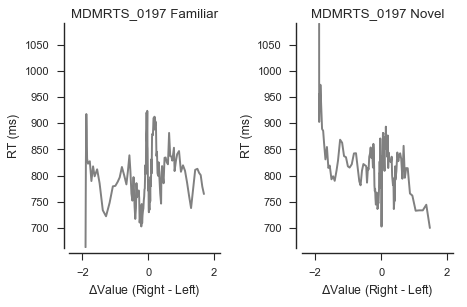

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 804.357153628
mean RT novel condition: 820.040767007

median RT in familiar condition: 801.6799999995998
median RT novel condition: 818.4349999988001



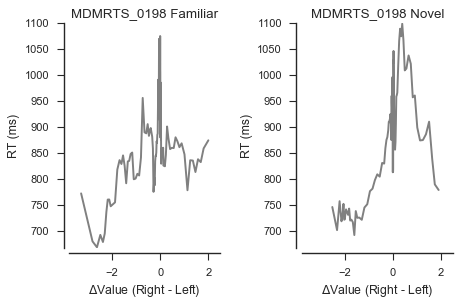

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 888.690611796
mean RT novel condition: 887.121233868

median RT in familiar condition: 883.2399999890006
median RT novel condition: 898.7999999899



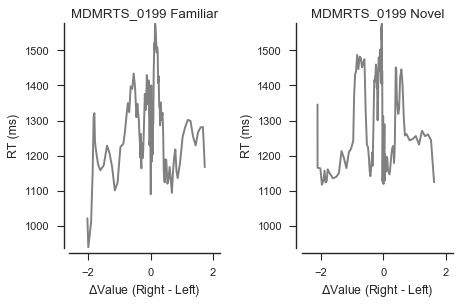

nFamiliarTrials:  137
nNovelTrials:  136

mean RT in familiar condition: 1273.12606042
mean RT novel condition: 1292.71168884

median RT in familiar condition: 1271.0199999972247
median RT novel condition: 1256.8599999998696



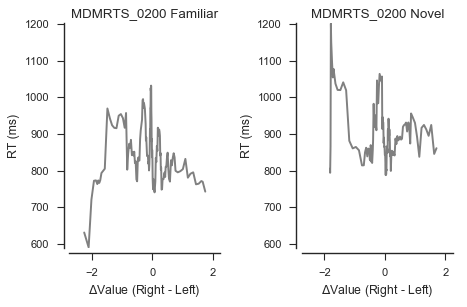

nFamiliarTrials:  136
nNovelTrials:  130

mean RT in familiar condition: 847.352847805
mean RT novel condition: 903.393492072

median RT in familiar condition: 835.8500000204247
median RT novel condition: 885.0000000209614



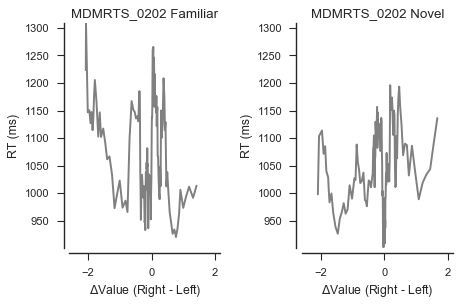

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 1075.55784886
mean RT novel condition: 1043.51326938

median RT in familiar condition: 1051.9299999996786
median RT novel condition: 1036.1099999998828



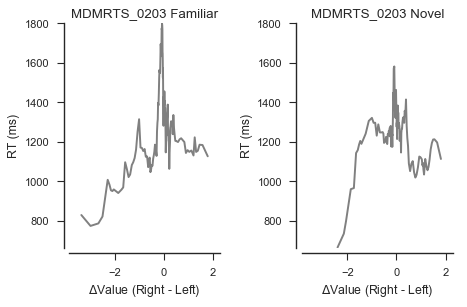

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1270.89951133
mean RT novel condition: 1247.22126786

median RT in familiar condition: 1241.3599999676483
median RT novel condition: 1249.0400000079999



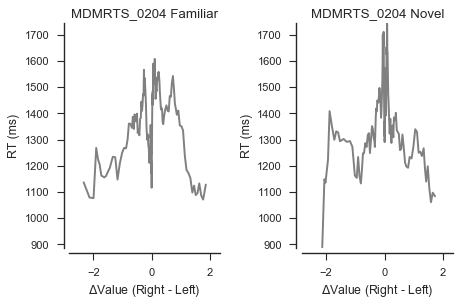

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1347.13906179
mean RT novel condition: 1374.6521165

median RT in familiar condition: 1359.6899999998495
median RT novel condition: 1351.2449999992505



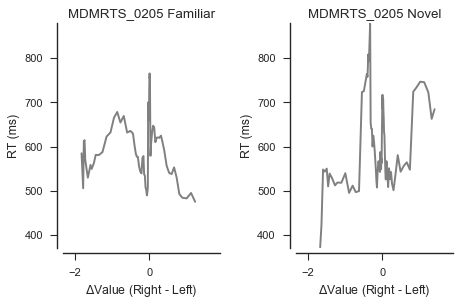

nFamiliarTrials:  71
nNovelTrials:  89

mean RT in familiar condition: 593.825069853
mean RT novel condition: 604.219676299

median RT in familiar condition: 583.7900000158697
median RT novel condition: 566.9699998106807



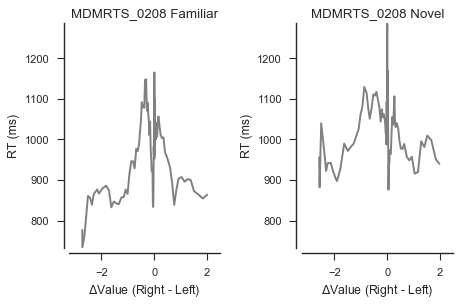

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 981.857578241
mean RT novel condition: 1053.61667161

median RT in familiar condition: 998.3450001113001
median RT novel condition: 1052.8650005354502



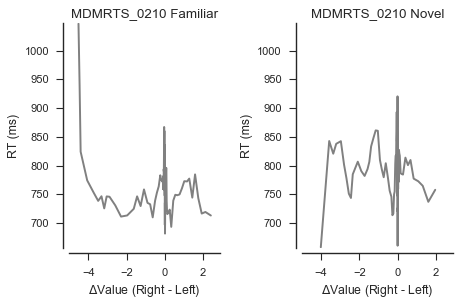

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 774.67627551
mean RT novel condition: 797.467720526

median RT in familiar condition: 772.4549999987
median RT novel condition: 798.3349999939496



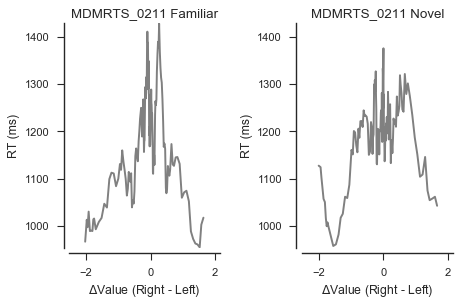

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1166.56321995
mean RT novel condition: 1194.57680272

median RT in familiar condition: 1161.5600000027503
median RT novel condition: 1206.8499999987007



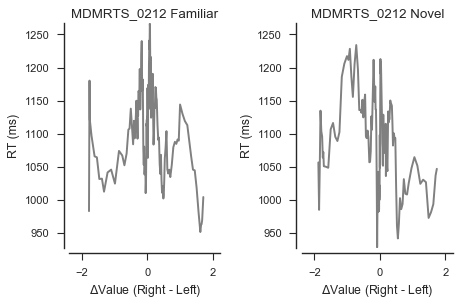

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1104.59035969
mean RT novel condition: 1089.6345051

median RT in familiar condition: 1104.95999999985
median RT novel condition: 1094.2099999998504



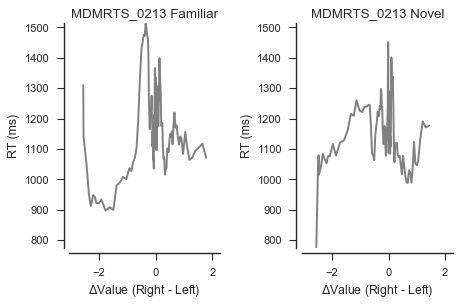

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1179.38867477
mean RT novel condition: 1169.49345805

median RT in familiar condition: 1177.7
median RT novel condition: 1166.25



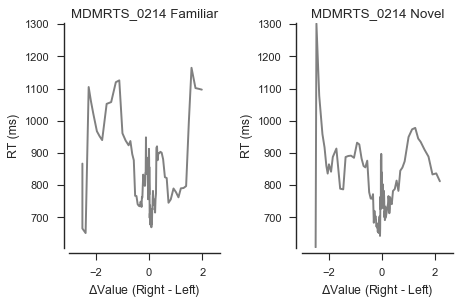

nFamiliarTrials:  125
nNovelTrials:  133

mean RT in familiar condition: 826.530292381
mean RT novel condition: 785.269677169

median RT in familiar condition: 798.8000000012113
median RT novel condition: 766.2799999973721



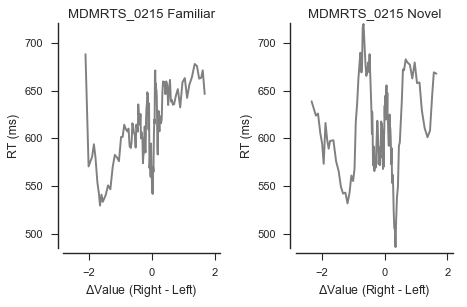

nFamiliarTrials:  138
nNovelTrials:  139

mean RT in familiar condition: 610.681564297
mean RT novel condition: 611.132014674

median RT in familiar condition: 612.5699999946498
median RT novel condition: 610.4099999939001



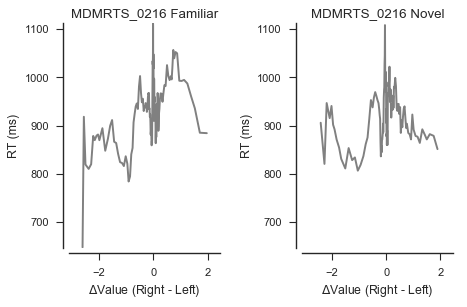

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 935.943971939
mean RT novel condition: 927.825613945

median RT in familiar condition: 937.1649999993001
median RT novel condition: 930.2150000011995



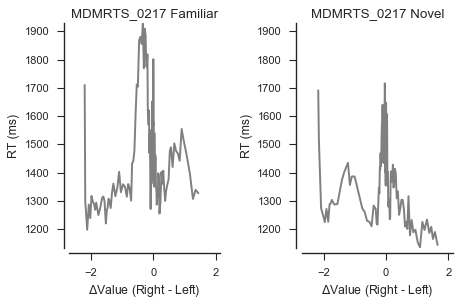

nFamiliarTrials:  140
nNovelTrials:  138

mean RT in familiar condition: 1461.34747846
mean RT novel condition: 1395.15943611

median RT in familiar condition: 1428.025000001071
median RT novel condition: 1388.2450000019162



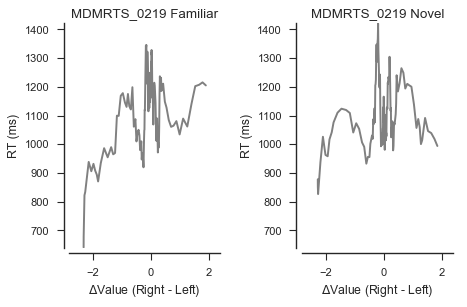

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1121.05654025
mean RT novel condition: 1099.53341041

median RT in familiar condition: 1150.3649999999502
median RT novel condition: 1078.4700000001



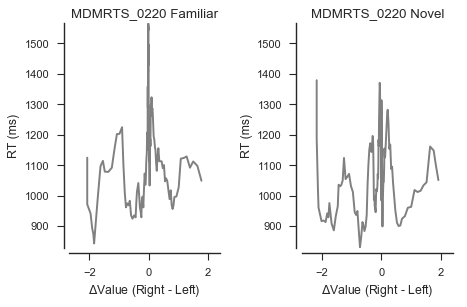

nFamiliarTrials:  130
nNovelTrials:  140

mean RT in familiar condition: 1134.45418498
mean RT novel condition: 1077.58161848

median RT in familiar condition: 1113.9000000035999
median RT novel condition: 1050.9499999999998



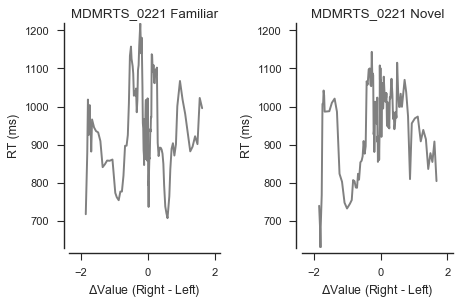

nFamiliarTrials:  138
nNovelTrials:  138

mean RT in familiar condition: 944.540818688
mean RT novel condition: 958.147901986

median RT in familiar condition: 932.583749975112
median RT novel condition: 983.3699999838109



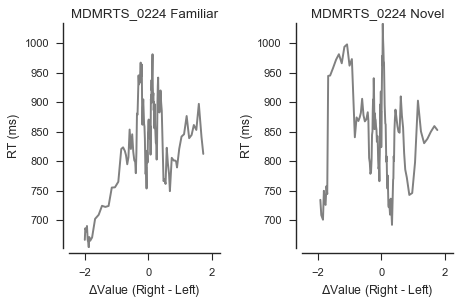

nFamiliarTrials:  138
nNovelTrials:  138

mean RT in familiar condition: 833.850597972
mean RT novel condition: 844.98521697

median RT in familiar condition: 840.3195668409767
median RT novel condition: 853.8654851063632



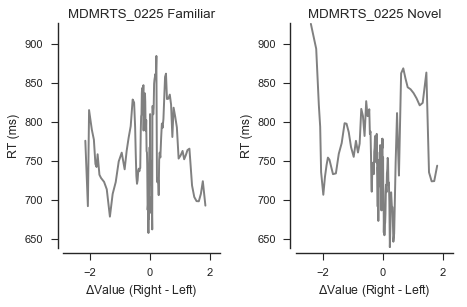

nFamiliarTrials:  139
nNovelTrials:  135

mean RT in familiar condition: 763.55031689
mean RT novel condition: 748.512645503

median RT in familiar condition: 757.5000000012001
median RT novel condition: 744.750000005375



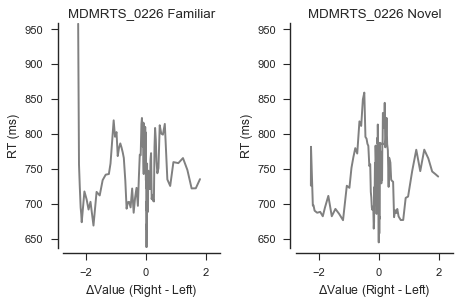

nFamiliarTrials:  140
nNovelTrials:  138

mean RT in familiar condition: 742.499499147
mean RT novel condition: 737.681652

median RT in familiar condition: 741.6899999953
median RT novel condition: 736.3899999939995



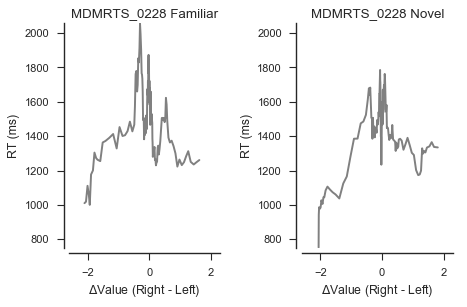

nFamiliarTrials:  138
nNovelTrials:  138

mean RT in familiar condition: 1484.66984127
mean RT novel condition: 1413.9544916

median RT in familiar condition: 1475.8500000010827
median RT novel condition: 1429.4999999998254



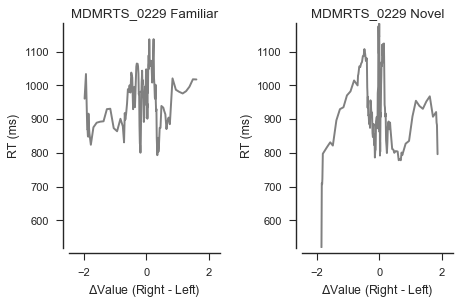

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 955.06896542
mean RT novel condition: 930.296561791

median RT in familiar condition: 960.4999999996667
median RT novel condition: 909.4999999999495



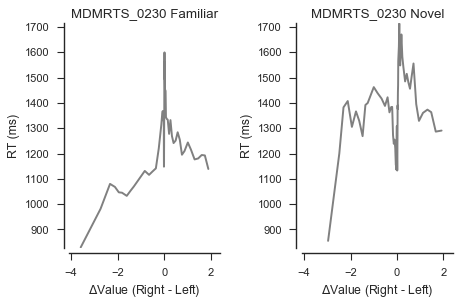

nFamiliarTrials:  64
nNovelTrials:  76

mean RT in familiar condition: 1258.57222841
mean RT novel condition: 1344.62590852

median RT in familiar condition: 1252.7999999760998
median RT novel condition: 1329.0928571520005



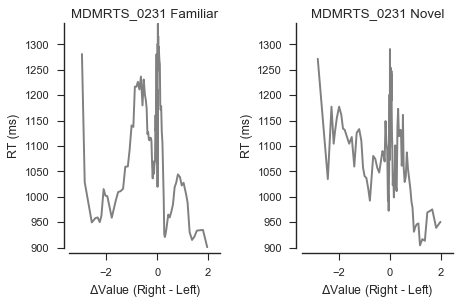

nFamiliarTrials:  140
nNovelTrials:  138

mean RT in familiar condition: 1106.97006604
mean RT novel condition: 1102.42268288

median RT in familiar condition: 1111.8499999984497
median RT novel condition: 1109.5799999782998



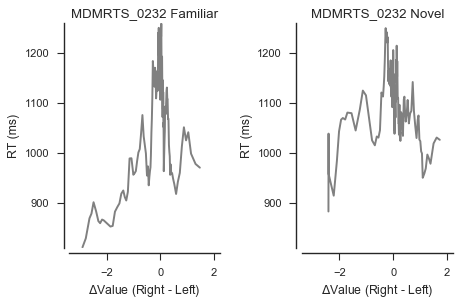

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1056.29530044
mean RT novel condition: 1097.76029195

median RT in familiar condition: 1064.0499999919502
median RT novel condition: 1097.3999999919997



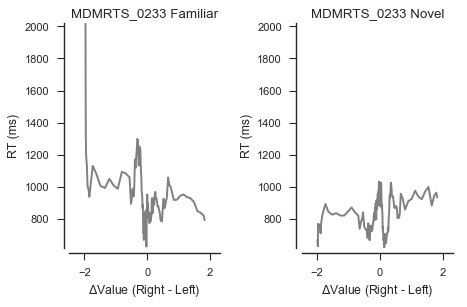

nFamiliarTrials:  132
nNovelTrials:  132

mean RT in familiar condition: 930.001428875
mean RT novel condition: 839.564201238

median RT in familiar condition: 903.2500000088476
median RT novel condition: 841.3700000150129



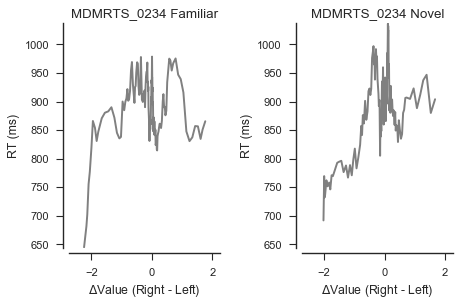

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 887.834563492
mean RT novel condition: 888.043826531

median RT in familiar condition: 890.9
median RT novel condition: 895.8499999999999



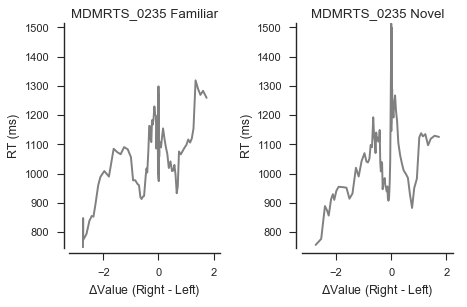

nFamiliarTrials:  140
nNovelTrials:  138

mean RT in familiar condition: 1099.83016894
mean RT novel condition: 1158.11607287

median RT in familiar condition: 1107.5799999993
median RT novel condition: 1147.3250000381497



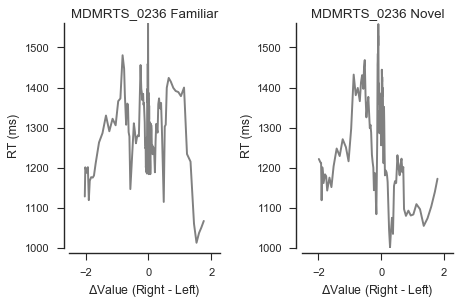

nFamiliarTrials:  134
nNovelTrials:  134

mean RT in familiar condition: 1293.70960733
mean RT novel condition: 1274.91638416

median RT in familiar condition: 1298.4249999975455
median RT novel condition: 1268.430000030975



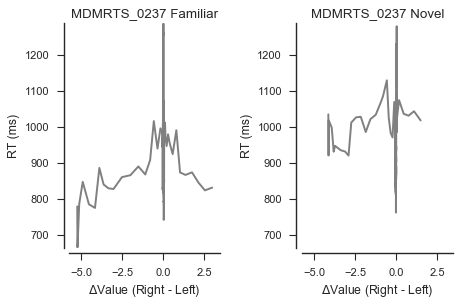

nFamiliarTrials:  126
nNovelTrials:  126

mean RT in familiar condition: 942.827847065
mean RT novel condition: 982.355183925

median RT in familiar condition: 942.75
median RT novel condition: 973.3499999999999



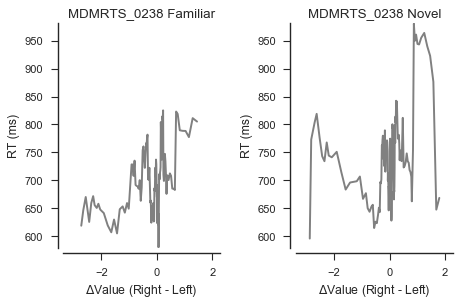

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 695.194267443
mean RT novel condition: 740.184481289

median RT in familiar condition: 690.2000000237998
median RT novel condition: 734.3428571425643



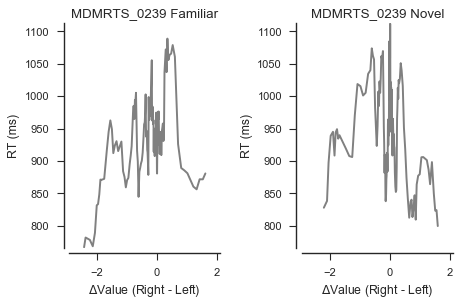

nFamiliarTrials:  140
nNovelTrials:  138

mean RT in familiar condition: 936.084577665
mean RT novel condition: 947.365809754

median RT in familiar condition: 938.7000000036471
median RT novel condition: 944.9499999991201



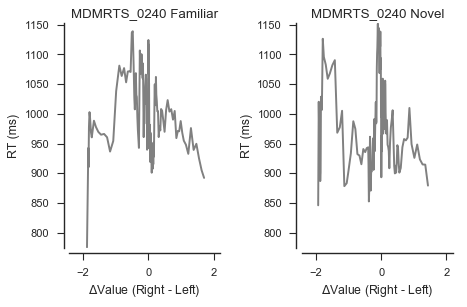

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 999.036253399
mean RT novel condition: 983.919071313

median RT in familiar condition: 991.1749999975558
median RT novel condition: 966.9200000122376



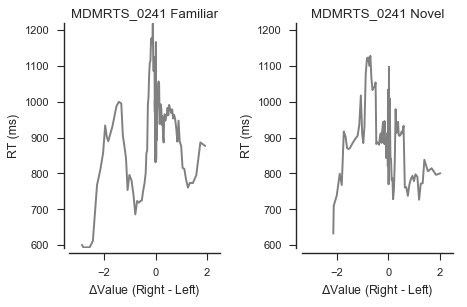

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 926.019285728
mean RT novel condition: 900.299702103

median RT in familiar condition: 933.9774999995748
median RT novel condition: 902.6442857388572



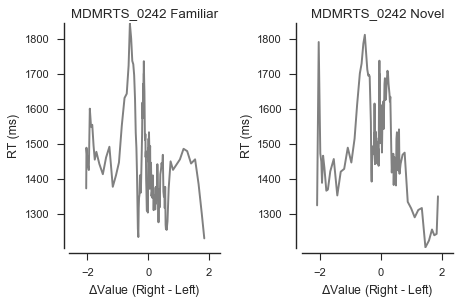

nFamiliarTrials:  137
nNovelTrials:  139

mean RT in familiar condition: 1446.22191391
mean RT novel condition: 1520.31804042

median RT in familiar condition: 1426.3100562449267
median RT novel condition: 1513.8401051680223



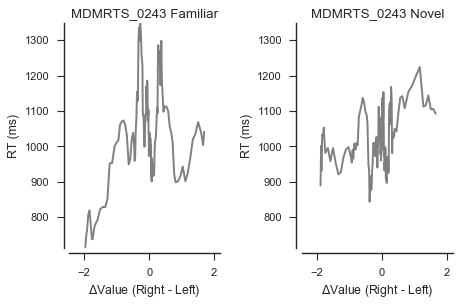

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 1038.63531774
mean RT novel condition: 1025.00827252

median RT in familiar condition: 1030.61000002888
median RT novel condition: 1010.0899999846179



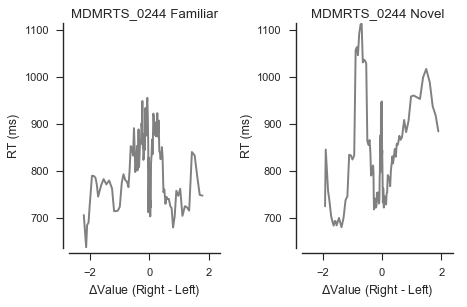

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 805.516836736
mean RT novel condition: 830.877944728

median RT in familiar condition: 802.2100000003002
median RT novel condition: 825.7200000025493



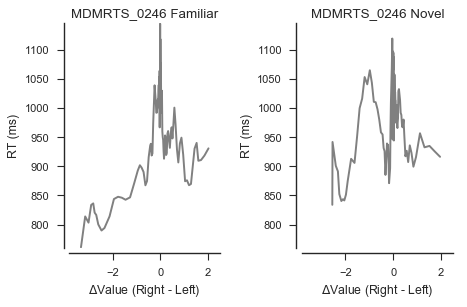

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 976.708446726
mean RT novel condition: 992.397970506

median RT in familiar condition: 997.9000000164506
median RT novel condition: 999.2000000317502



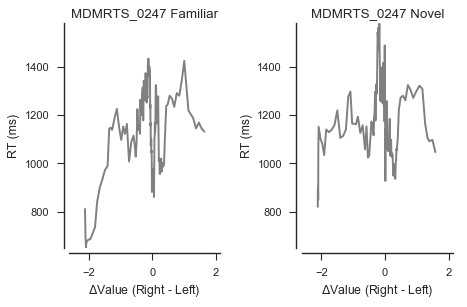

nFamiliarTrials:  139
nNovelTrials:  137

mean RT in familiar condition: 1109.95917123
mean RT novel condition: 1192.45079568

median RT in familiar condition: 1139.0400000018417
median RT novel condition: 1163.8800000000629



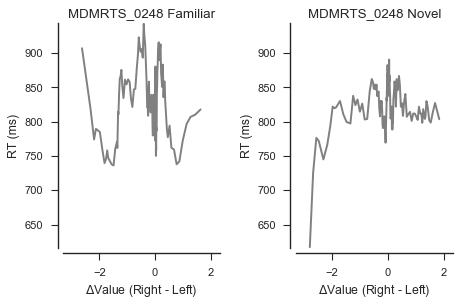

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 826.149657028
mean RT novel condition: 826.503253971

median RT in familiar condition: 826.0999999881501
median RT novel condition: 827.0000000075012



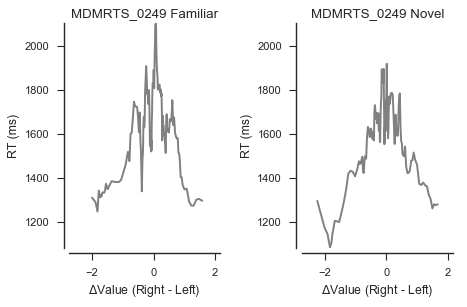

nFamiliarTrials:  140
nNovelTrials:  138

mean RT in familiar condition: 1625.5919572
mean RT novel condition: 1564.66777462

median RT in familiar condition: 1626.7600000077546
median RT novel condition: 1590.4550000003837



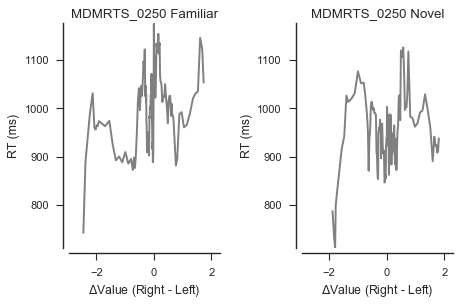

nFamiliarTrials:  138
nNovelTrials:  139

mean RT in familiar condition: 1004.32080487
mean RT novel condition: 948.462815747

median RT in familiar condition: 1003.0200000000002
median RT novel condition: 951.3900000000003



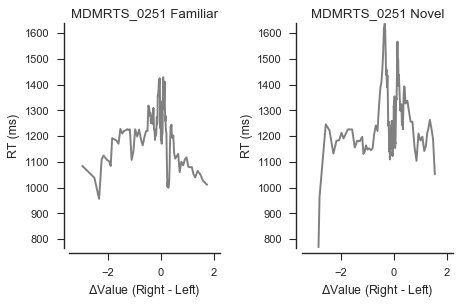

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1212.17792653
mean RT novel condition: 1276.4081284

median RT in familiar condition: 1224.0299999947
median RT novel condition: 1241.0250000073502



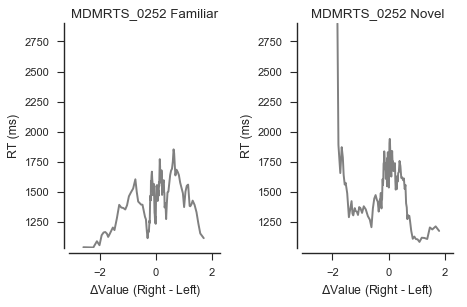

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1446.08016554
mean RT novel condition: 1550.60540854

median RT in familiar condition: 1466.1099999912499
median RT novel condition: 1576.762500014875



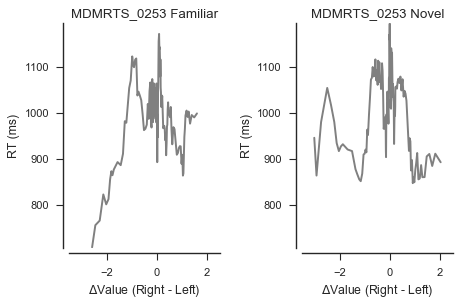

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 990.90225311
mean RT novel condition: 1001.56708946

median RT in familiar condition: 997.5099999456172
median RT novel condition: 1009.1699999294094



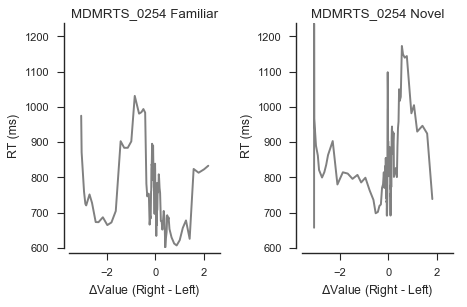

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 757.241712341
mean RT novel condition: 853.610286049

median RT in familiar condition: 745.9000000261142
median RT novel condition: 819.8000000091084



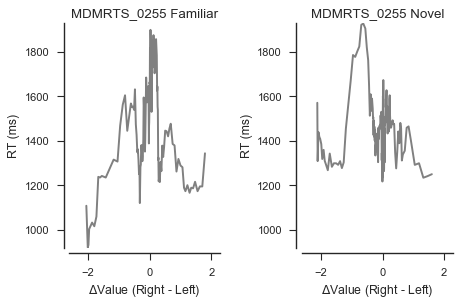

nFamiliarTrials:  135
nNovelTrials:  137

mean RT in familiar condition: 1462.76499412
mean RT novel condition: 1451.01472019

median RT in familiar condition: 1446.1
median RT novel condition: 1450.1



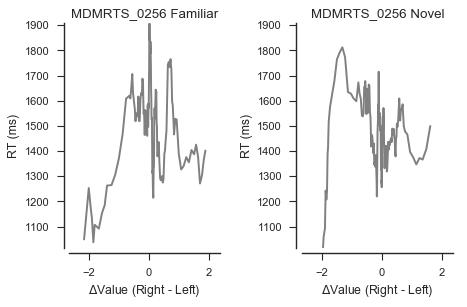

nFamiliarTrials:  132
nNovelTrials:  136

mean RT in familiar condition: 1502.74390965
mean RT novel condition: 1467.49132208

median RT in familiar condition: 1522.0050000354167
median RT novel condition: 1472.7850000373478



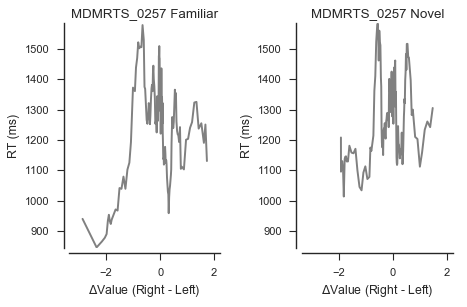

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1234.03821995
mean RT novel condition: 1274.7307554

median RT in familiar condition: 1254.5500000000002
median RT novel condition: 1266.1



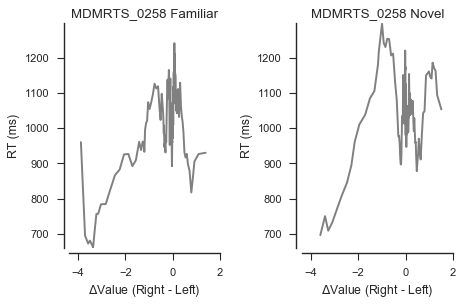

nFamiliarTrials:  139
nNovelTrials:  137

mean RT in familiar condition: 1017.34721423
mean RT novel condition: 1050.7025785

median RT in familiar condition: 1042.6300000050105
median RT novel condition: 1050.9900000062771



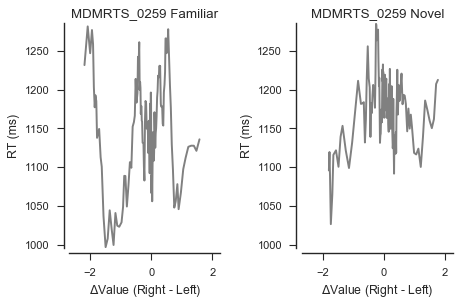

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1148.69258702
mean RT novel condition: 1175.29844496

median RT in familiar condition: 1152.0800000000004
median RT novel condition: 1181.5299999999004



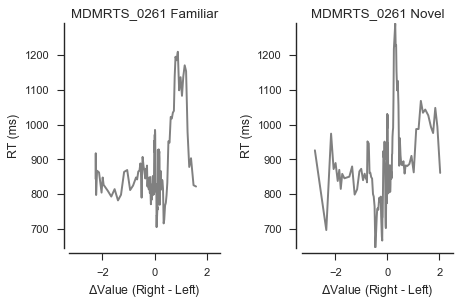

nFamiliarTrials:  137
nNovelTrials:  139

mean RT in familiar condition: 872.080063724
mean RT novel condition: 890.322692133

median RT in familiar condition: 845.1900000000023
median RT novel condition: 865.7400000010966



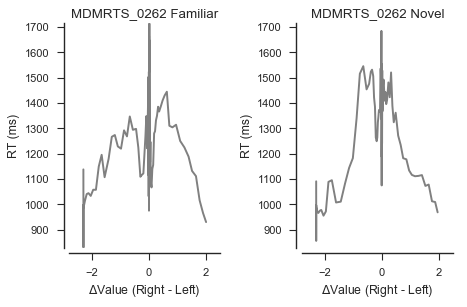

nFamiliarTrials:  139
nNovelTrials:  138

mean RT in familiar condition: 1277.01069716
mean RT novel condition: 1308.77096273

median RT in familiar condition: 1260.7
median RT novel condition: 1339.35



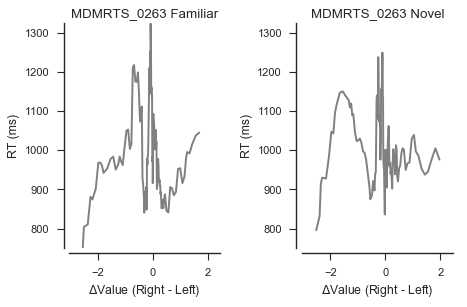

nFamiliarTrials:  136
nNovelTrials:  136

mean RT in familiar condition: 988.811601307
mean RT novel condition: 1008.66585551

median RT in familiar condition: 969.0500000001051
median RT novel condition: 989.4000000003783



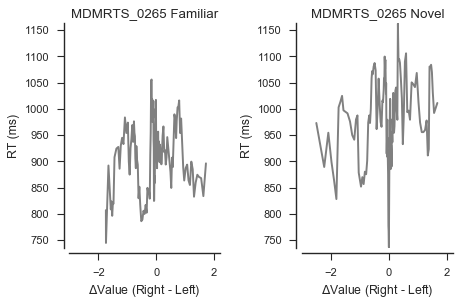

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 911.450463152
mean RT novel condition: 975.757627612

median RT in familiar condition: 914.5750000004969
median RT novel condition: 979.2499999993097



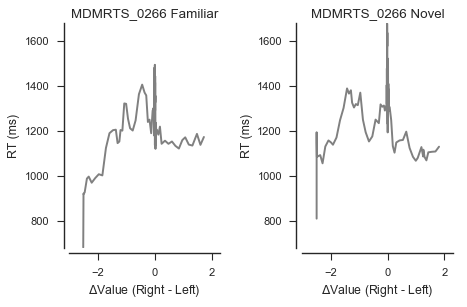

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1251.98375442
mean RT novel condition: 1304.49138889

median RT in familiar condition: 1253.5300000045904
median RT novel condition: 1306.195000000021



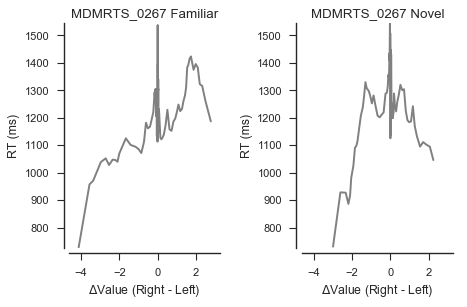

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1247.27649943
mean RT novel condition: 1263.03264531

median RT in familiar condition: 1248.0999999989922
median RT novel condition: 1248.0000000007105



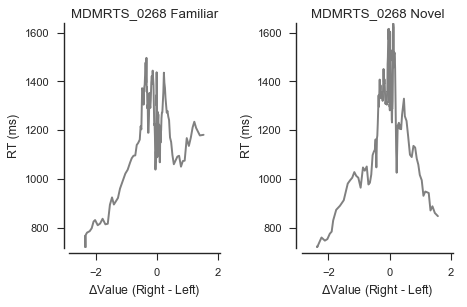

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1175.26931406
mean RT novel condition: 1228.13361338

median RT in familiar condition: 1190.4800000040498
median RT novel condition: 1293.0900000094507



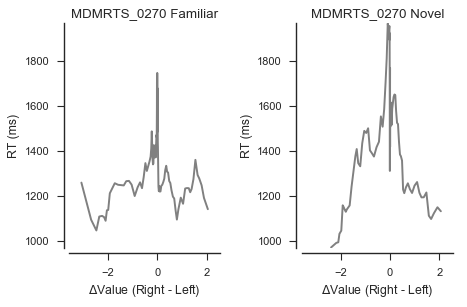

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1414.90453067
mean RT novel condition: 1472.60454252

median RT in familiar condition: 1409.8799999936
median RT novel condition: 1511.3599999925013



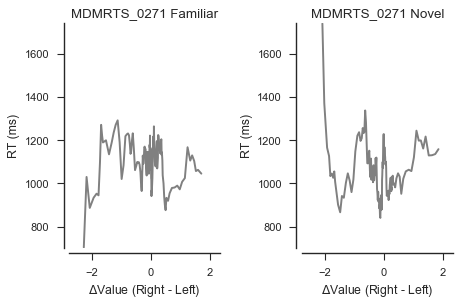

nFamiliarTrials:  132
nNovelTrials:  134

mean RT in familiar condition: 1099.98378517
mean RT novel condition: 1060.82970269

median RT in familiar condition: 1106.0049999852504
median RT novel condition: 1039.1999999989994



/Users/alicexue/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


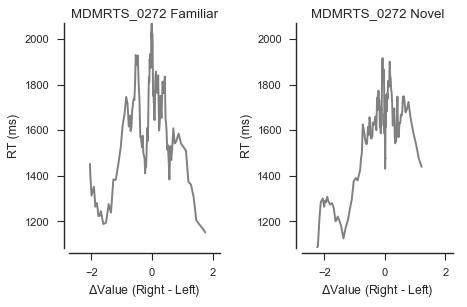

nFamiliarTrials:  138
nNovelTrials:  138

mean RT in familiar condition: 1642.25979411
mean RT novel condition: 1583.06740856

median RT in familiar condition: 1661.0
median RT novel condition: 1624.9



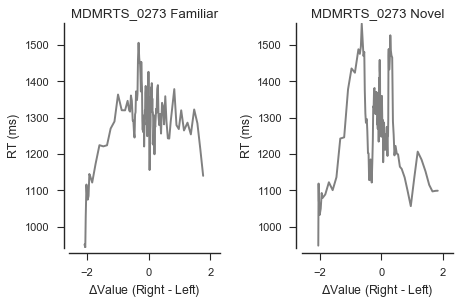

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1293.07066553
mean RT novel condition: 1277.21585989

median RT in familiar condition: 1303.3950000055002
median RT novel condition: 1281.6299999986006



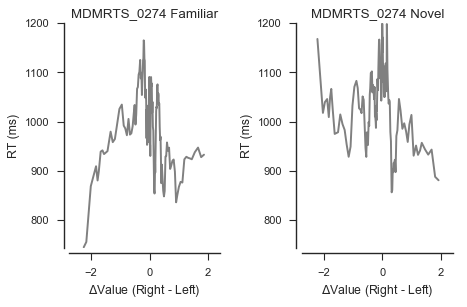

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 983.645096375
mean RT novel condition: 1038.07072875

median RT in familiar condition: 981.5100000357502
median RT novel condition: 1045.7775000088004



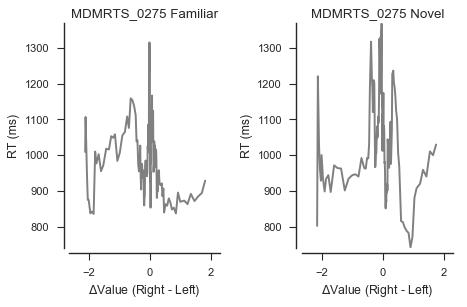

nFamiliarTrials:  135
nNovelTrials:  139

mean RT in familiar condition: 986.806995885
mean RT novel condition: 1053.58331906

median RT in familiar condition: 973.3
median RT novel condition: 1031.4



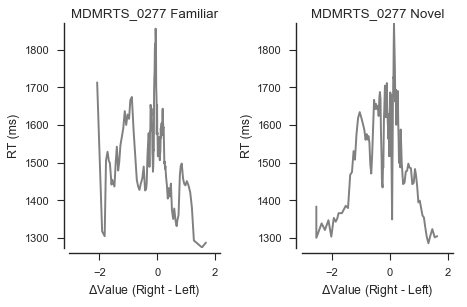

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1529.78667234
mean RT novel condition: 1535.35716553

median RT in familiar condition: 1524.9
median RT novel condition: 1550.5



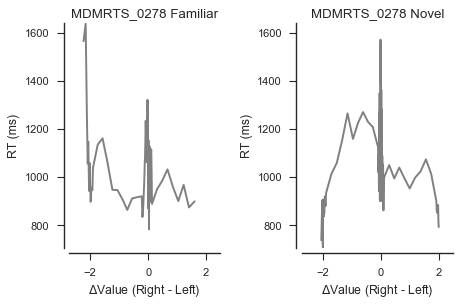

nFamiliarTrials:  130
nNovelTrials:  131

mean RT in familiar condition: 1045.08889194
mean RT novel condition: 1124.85826972

median RT in familiar condition: 1025.5
median RT novel condition: 1113.9



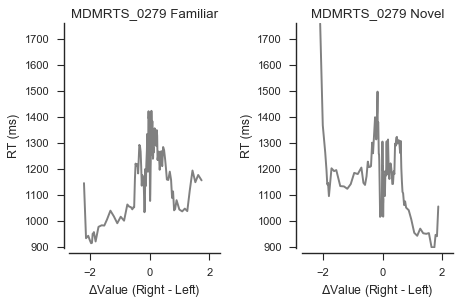

nFamiliarTrials:  138
nNovelTrials:  140

mean RT in familiar condition: 1180.59258023
mean RT novel condition: 1179.15309439

median RT in familiar condition: 1195.4650000086986
median RT novel condition: 1179.0050000068732



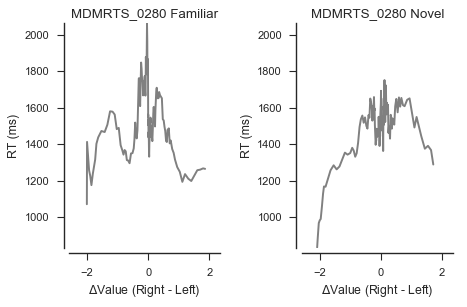

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1530.88487781
mean RT novel condition: 1485.25273243

median RT in familiar condition: 1501.6
median RT novel condition: 1517.9499999999998



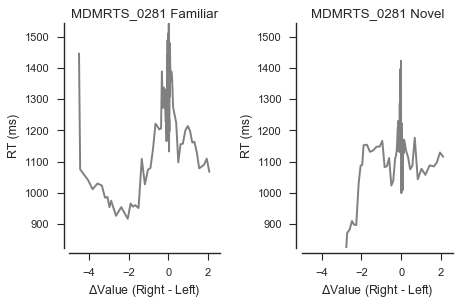

nFamiliarTrials:  140
nNovelTrials:  138

mean RT in familiar condition: 1260.13840224
mean RT novel condition: 1167.91119189

median RT in familiar condition: 1274.2999681820002
median RT novel condition: 1156.7549921294



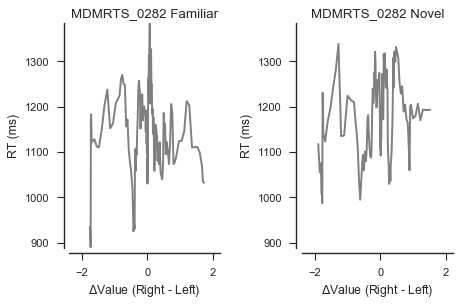

nFamiliarTrials:  135
nNovelTrials:  137

mean RT in familiar condition: 1143.85131188
mean RT novel condition: 1181.07277488

median RT in familiar condition: 1145.0100000249222
median RT novel condition: 1192.2444444304954



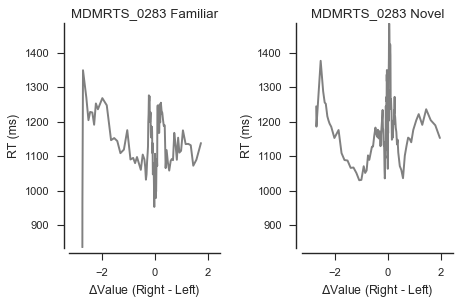

nFamiliarTrials:  138
nNovelTrials:  138

mean RT in familiar condition: 1121.6677125
mean RT novel condition: 1192.15221676

median RT in familiar condition: 1108.8400000022375
median RT novel condition: 1177.6149999990594



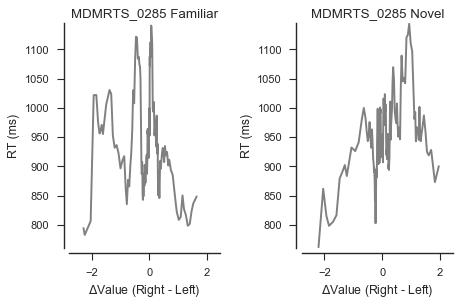

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 938.586951531
mean RT novel condition: 949.033514456

median RT in familiar condition: 928.0899999999999
median RT novel condition: 947.0849999999502



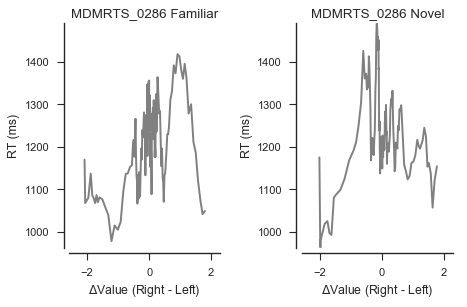

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1211.49729673
mean RT novel condition: 1225.42231434

median RT in familiar condition: 1219.0799999998394
median RT novel condition: 1209.3100000004902



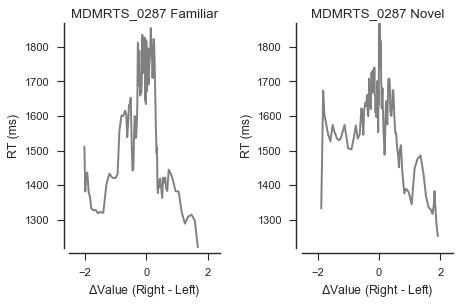

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1596.60420918
mean RT novel condition: 1615.01415249

median RT in familiar condition: 1648.4
median RT novel condition: 1627.45



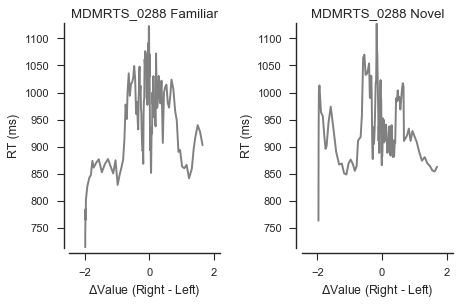

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 961.231230159
mean RT novel condition: 937.78279195

median RT in familiar condition: 978.55
median RT novel condition: 921.7



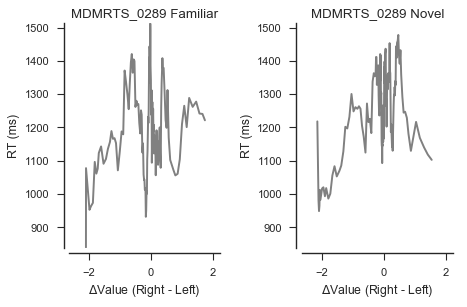

nFamiliarTrials:  138
nNovelTrials:  138

mean RT in familiar condition: 1198.45696659
mean RT novel condition: 1249.13907867

median RT in familiar condition: 1188.63500000472
median RT novel condition: 1257.9599999938534



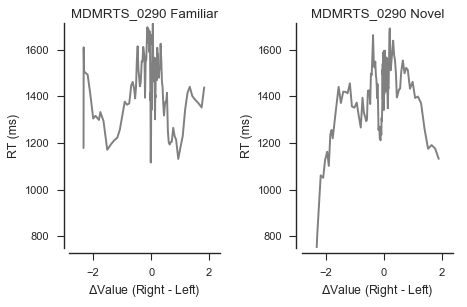

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1423.31982398
mean RT novel condition: 1411.86567744

median RT in familiar condition: 1428.1150000031494
median RT novel condition: 1433.0299999949993



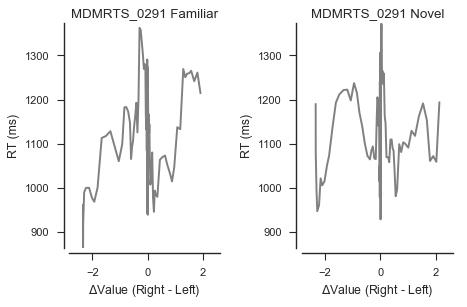

nFamiliarTrials:  138
nNovelTrials:  138

mean RT in familiar condition: 1111.5489533
mean RT novel condition: 1136.97262767

median RT in familiar condition: 1111.8000000007
median RT novel condition: 1137.79999999955



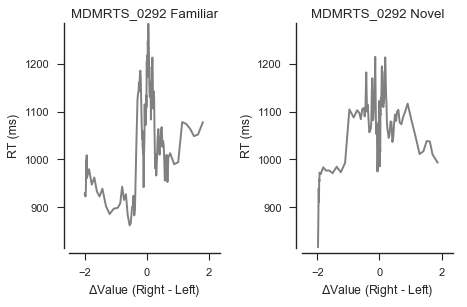

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1060.03644417
mean RT novel condition: 1072.62041724

median RT in familiar condition: 1056.0149999803
median RT novel condition: 1079.1399999750997



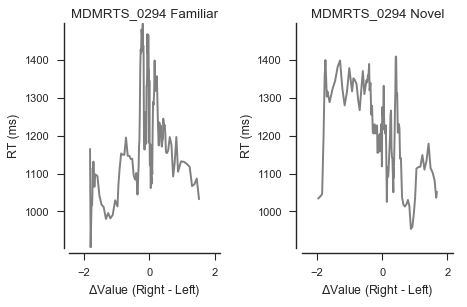

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1193.00523867
mean RT novel condition: 1204.44053288

median RT in familiar condition: 1174.3999999999346
median RT novel condition: 1206.7499999999795



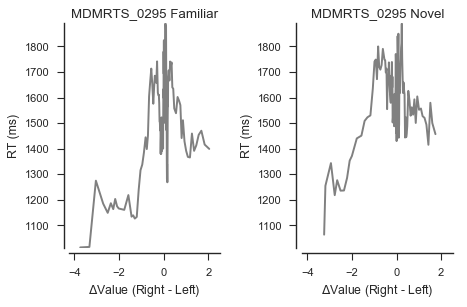

nFamiliarTrials:  127
nNovelTrials:  129

mean RT in familiar condition: 1502.74468816
mean RT novel condition: 1593.0975606

median RT in familiar condition: 1506.499999999968
median RT novel condition: 1594.0999999998924



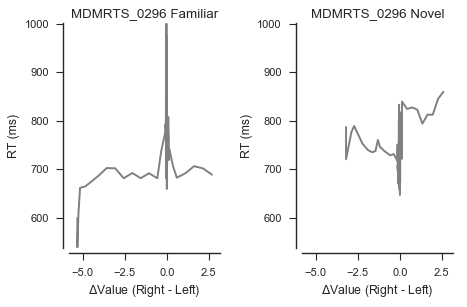

nFamiliarTrials:  126
nNovelTrials:  142

mean RT in familiar condition: 768.040624214
mean RT novel condition: 745.764280126

median RT in familiar condition: 752.5499999981548
median RT novel condition: 749.4500000000698



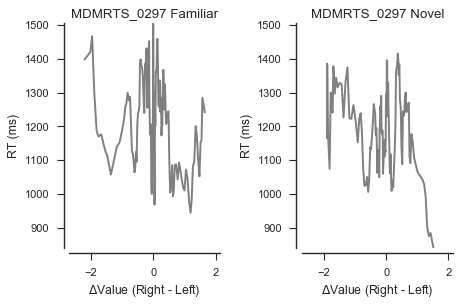

nFamiliarTrials:  138
nNovelTrials:  138

mean RT in familiar condition: 1213.45349091
mean RT novel condition: 1187.68643605

median RT in familiar condition: 1214.199999999255
median RT novel condition: 1189.4499999980326



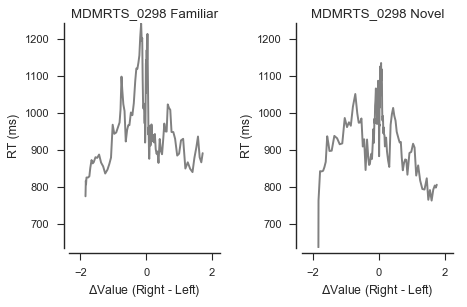

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 987.421882779
mean RT novel condition: 949.993751984

median RT in familiar condition: 953.8599999999899
median RT novel condition: 948.2499999999595



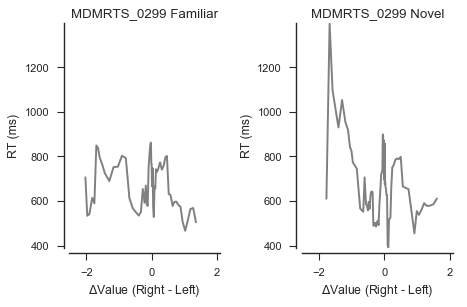

nFamiliarTrials:  60
nNovelTrials:  77

mean RT in familiar condition: 670.322632275
mean RT novel condition: 682.826360544

median RT in familiar condition: 666.6500000000001
median RT novel condition: 653.0



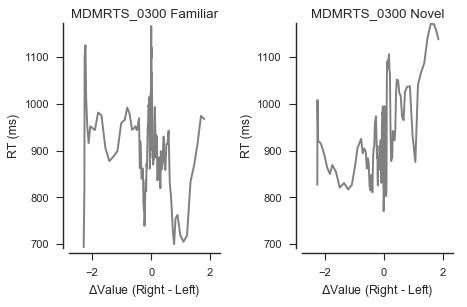

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 911.979883787
mean RT novel condition: 926.332251342

median RT in familiar condition: 908.1500000000001
median RT novel condition: 909.3



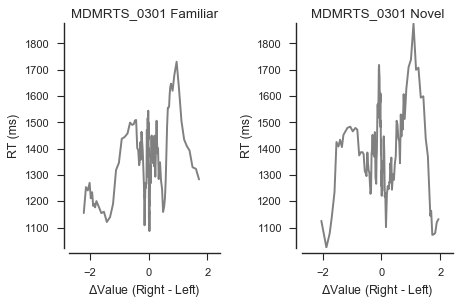

nFamiliarTrials:  138
nNovelTrials:  139

mean RT in familiar condition: 1346.02841126
mean RT novel condition: 1380.34494091

median RT in familiar condition: 1347.8949999965603
median RT novel condition: 1371.8200000111635



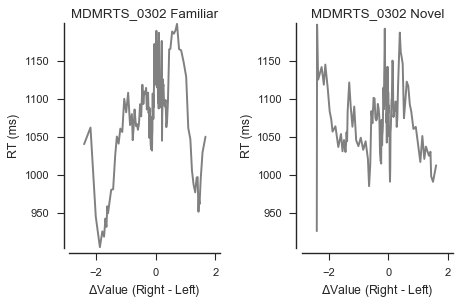

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1084.48737755
mean RT novel condition: 1079.68085261

median RT in familiar condition: 1090.9500000024004
median RT novel condition: 1081.8649999988993



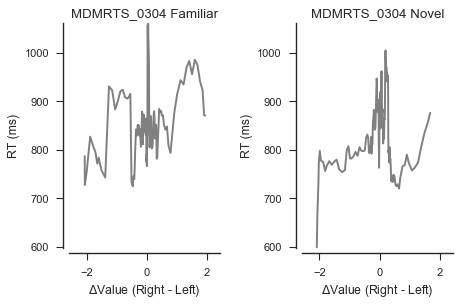

nFamiliarTrials:  139
nNovelTrials:  138

mean RT in familiar condition: 856.309255453
mean RT novel condition: 828.948993559

median RT in familiar condition: 847.0
median RT novel condition: 823.65



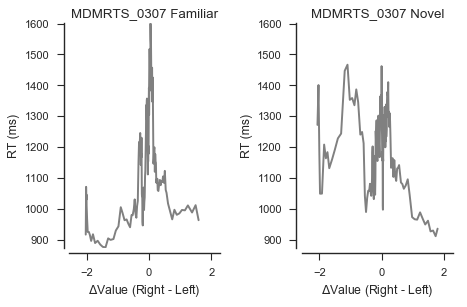

nFamiliarTrials:  139
nNovelTrials:  138

mean RT in familiar condition: 1131.21437421
mean RT novel condition: 1184.41195365

median RT in familiar condition: 1094.000000000243
median RT novel condition: 1184.04444444431



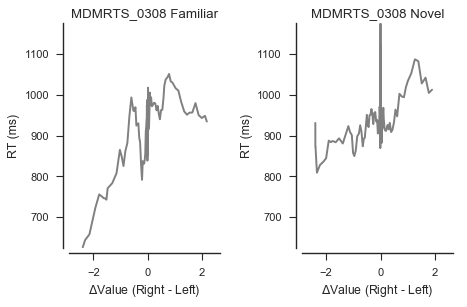

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 918.785685737
mean RT novel condition: 961.831879252

median RT in familiar condition: 940.1000000004
median RT novel condition: 942.25000000005



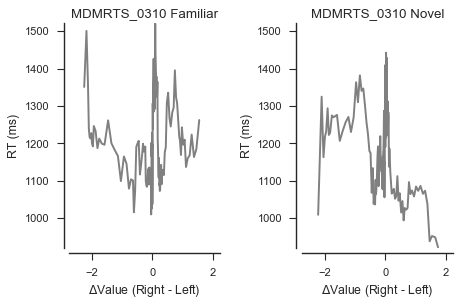

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1206.48437821
mean RT novel condition: 1192.040411

median RT in familiar condition: 1191.6
median RT novel condition: 1204.44999999995



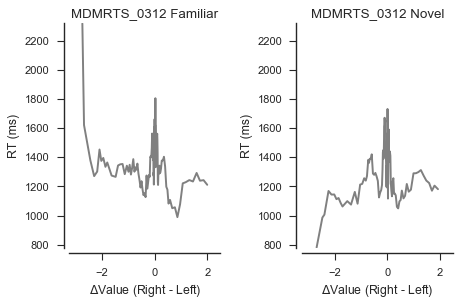

nFamiliarTrials:  133
nNovelTrials:  136

mean RT in familiar condition: 1386.55274126
mean RT novel condition: 1323.08026087

median RT in familiar condition: 1375.207999999995
median RT novel condition: 1290.7647500000032



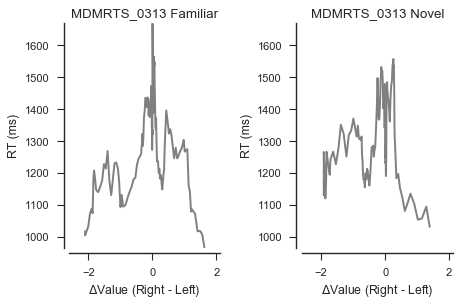

nFamiliarTrials:  152
nNovelTrials:  127

mean RT in familiar condition: 1311.55398185
mean RT novel condition: 1311.16299275

median RT in familiar condition: 1291.345000057951
median RT novel condition: 1303.729999997



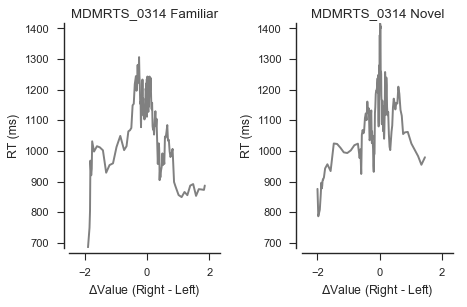

nFamiliarTrials:  138
nNovelTrials:  139

mean RT in familiar condition: 1073.84525535
mean RT novel condition: 1101.2909815

median RT in familiar condition: 1101.6
median RT novel condition: 1098.5



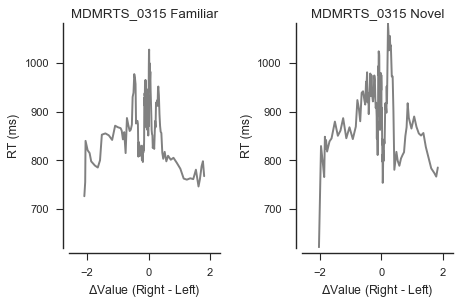

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 867.729580499
mean RT novel condition: 892.314872732

median RT in familiar condition: 865.1600000001501
median RT novel condition: 890.1950000003001



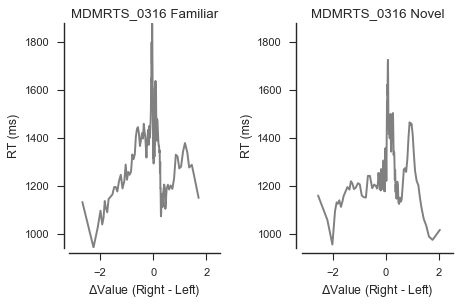

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1349.24309042
mean RT novel condition: 1268.10077948

median RT in familiar condition: 1342.9499999990494
median RT novel condition: 1235.11999999905



In [27]:
get_rt_plots_by_familiarity(zscoreRatings=True, printFigs=True)

In [17]:
def get_mean_rt_barplot_by_familiarity(zscoreRatings):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    pvals = []
    df = pd.DataFrame()
    
    rtLowerInFamiliarCondition = 0
    
    for subject in subjects:
        sub_fam_df, sub_nov_df = get_subject_rt_by_familiarity(subject, zscoreRatings, printFigs=False)
        
        fam = sub_fam_df['RT'].values
        nov = sub_nov_df['RT'].values
        
        if sub_fam_df.mean(axis=0)['RT'] < sub_nov_df.mean(axis=0)['RT']:
            rtLowerInFamiliarCondition += 1
        
        subjectN = int(subject[-4:])
        d = pd.DataFrame.from_dict(data={"Subject": subjectN, "Scene Condition":"familiar", "RT (ms)":fam})
        df = pd.concat([df, d])
        d = pd.DataFrame.from_dict(data={"Subject": subjectN, "Scene Condition":"novel", "RT (ms)":nov})
        df = pd.concat([df, d])
    
    rtLowerInFamiliarCondition = float(rtLowerInFamiliarCondition)/n
    print "RT was lower in the familiar condition for", rtLowerInFamiliarCondition*100, "% of subjects"
    """
    plt.rcParams['figure.dpi'] = 100
    fig = plt.figure()
    ax = sns.barplot(x="Subject", y="RT (ms)", hue="Scene Condition", data=df, ci="sd", errwidth=1.5)
    ax.set_title('Mean RT in Food Choice Task')
    plt.show()
    """

In [ ]:
get_mean_rt_barplot_by_familiarity(zscoreRatings=True)

In [28]:
def getfoodsubdf(subjectId, zscoreRatings):
    subjectFolder = _dataDir + subjectId + '/'

    auctionFile = subjectFolder + subjectId + auctionFileEnd
    choiceFile = subjectFolder + subjectId + choiceFileEnd

    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        
        rightStimRatings = df["stimulus2Bid"]
        leftStimRatings = df["stimulus1Bid"]
        
        if zscoreRatings:
            mean, std = get_ratings_mean_and_std(subjectId)
            df["stimulus2Bid"] = (rightStimRatings - mean) / std
            df["stimulus1Bid"] = (leftStimRatings - mean) / std
            df["delta"] = df["stimulus2Bid"] - df["stimulus1Bid"]

        df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
        
        if np.mean(df['rt']) > 3000:
            df['rt'] = df['rt_UNIX']
        
        choices = df['selected'] == df['stimulus2']
        subdf = df[['subjectId','delta','stimulus1','stimulus2','stimulus1Bid','stimulus2Bid','rt','sceneStimulusStatus']]
        subdf.columns = ['subjid','deltaval','ImageLeft','ImageRight','bidLeft','bidRight','RT','sceneStimulusStatus']

        subdf.loc[:,'choseright'] = choices
        
        return subdf

def getfoodcsv(zscoreRatings):
    df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=False)
    subjects = df_sig_pval['subjectId'].values
    outputDir = _thisDir + '/output/'
    food = pd.DataFrame()
    for i in range(0,len(subjects)):
        subject = subjects[i]
        df = getfoodsubdf(subject, zscoreRatings)
        food = pd.concat([food, df])
    food.reset_index(inplace=True, drop=True)
    if not os.path.exists(_thisDir + '/output'):
        os.mkdir(_thisDir + '/output/')
    if zscoreRatings:
        food.to_csv(_thisDir + '/output/food_zscoredratings.csv')
    else:
        food.to_csv(_thisDir + '/output/food.csv')

In [29]:
getfoodcsv(zscoreRatings=True)
getfoodcsv(zscoreRatings=False)

total number of people who accepted the HIT 316
102 subjects completed the auction and choice tasks.
Of 102 subjects, 96 subjects had significant p values for the logistic regression.


/Users/alicexue/anaconda2/lib/python2.7/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
/Users/alicexue/anaconda2/lib/python2.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


total number of people who accepted the HIT 316
102 subjects completed the auction and choice tasks.
Of 102 subjects, 96 subjects had significant p values for the logistic regression.


In [30]:
def getRunningMeanData(data):
    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','subj','deltaval'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    
    dfsorted=df.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop = pd.Series.rolling(dfsorted['ci'],100,min_periods=1).mean()

    #chose right or chose left
    cr=dfsorted[dfsorted['ci']==1]
    cl=dfsorted[dfsorted['ci']==0]
    
    #running mean of rt
    meanrt_lo = pd.Series.rolling(cl['rt'],50,min_periods=1).mean()
    meanrt_up = pd.Series.rolling(cr['rt'],50,min_periods=1).mean()
    meanrt_both = pd.Series.rolling(dfsorted['rt'],100,min_periods=1).mean()
    return dfsorted, meanprop, meanrt_both

In [31]:
def plotFoodDataRunningMean(fam_data, nov_data):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    Returns
    -------

    """

    plt.rcParams['figure.dpi'] = 90
    fig = plt.figure()

    fam_dfsorted, fam_meanprop, fam_meanrt_both = getRunningMeanData(fam_data)
    nov_dfsorted, nov_meanprop, nov_meanrt_both = getRunningMeanData(nov_data)
    
    ax_choice = fig.add_subplot(1, 2, 1)
    ax_choice.add_line(
        plt.Line2D(fam_dfsorted['deltaval'], fam_meanprop, color='xkcd:pale red'))
    ax_choice.add_line(
        plt.Line2D(nov_dfsorted['deltaval'], nov_meanprop, color='xkcd:denim blue'))

    ax_choice.set_xlim((-6, 6))
    ax_choice.set_ylim((-0.01, 1.01))
    ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond Right)')
    plt.title('Choices')

    ax_rt = fig.add_subplot(1, 2, 2)
    ax_rt.add_line(
        plt.Line2D(fam_dfsorted['deltaval'], fam_meanrt_both, color='xkcd:pale red', label='familiar'))
    ax_rt.add_line(
        plt.Line2D(nov_dfsorted['deltaval'], nov_meanrt_both, color='xkcd:denim blue', label='novel'))
  
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Reaction time (ms) preceded by scenes')
    plt.title('RT')
    
    ax_rt.set_xlim((-6, 6))
    ax_rt.set_ylim(600, 1350)
    
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Mean reaction times (ms)')
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    sns.despine(offset=5, trim=True)
    plt.tight_layout()
    plt.show()


In [ ]:
# Plot food data for familiar scenes
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
food['deltavalrnd']=food['deltaval'].round(1)
food = food.loc[food['sceneStimulusStatus'] == 'familiar']
datafood=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright']])
fam_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])

# Plot food data for novel scenes
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
food['deltavalrnd']=food['deltaval'].round(1)
food = food.loc[food['sceneStimulusStatus'] == 'novel']
datafood=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright']])
nov_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])
plotFoodDataRunningMean(fam_datafoodplot, nov_datafoodplot)

In [33]:
def binFoodData():
    zscoreRatings = True
    printFigs = False
    df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=False)
    subjects = df_sig_pval['subjectId'].values

    fam_df = pd.DataFrame()
    nov_df = pd.DataFrame()

    for subject in subjects:
        sub_df_fam, sub_df_nov, pval = get_subject_p_logistic_by_familiarity(subject, zscoreRatings, printFigs)
        sub_df_fam.columns = ['ChoseRight','RT','Delta']
        sub_df_nov.columns = ['ChoseRight','RT','Delta']
        """
        sub_rt_df_fam, sub_rt_df_nov = get_subject_rt_by_familiarity(subject, zscoreRatings, printFigs)["RT"]/1000
        sub_df_fam = pd.concat([sub_df_fam,sub_rt_df_fam], axis = 1)
        sub_df_nov = pd.concat([sub_df_nov,sub_rt_df_nov], axis = 1)
        """
        sub_df_fam['SubjectID'] = subject
        sub_df_nov['SubjectID'] = subject

        # bin delta values
        for i in range(0,2):
            if i == 0:
                sub_df = sub_df_fam
                df = fam_df
            else:
                sub_df = sub_df_nov
                df = nov_df
            sub_food = sub_df
            deltabins = pd.qcut(sub_food['Delta'], 14, duplicates = 'drop')
            sub_food = sub_food.set_index(deltabins)
            sub_food['DeltaRnd'] = sub_food['Delta']
            j = 0
            for interval in deltabins.unique():
                foodbin = sub_food.loc[interval]['DeltaRnd']
                foodbinmean = foodbin.mean()
                sub_food.loc[interval, 'DeltaRnd'] = foodbinmean
                sub_food.loc[interval, 'BinN'] = j
                j+=1
            sub_df = sub_food.reset_index(drop=True)
            sub_df.columns = ['choseright', 'RT', 'deltaval', 'subjid', 'deltavalrnd', 'binN']
            df = pd.concat([df,sub_df], axis = 0)
            df.columns = ['choseright', 'RT', 'deltaval', 'subjid', 'deltavalrnd', 'binN']
            if i == 0:
                sub_df_fam = sub_df
                fam_df = df
            else:
                sub_df_nov = sub_df
                nov_df = df

    return fam_df, nov_df

In [34]:
def sortedFunc(x, y, func):
    unique_y = np.sort(np.unique(y))
    ny = len(unique_y)

    out_x = np.empty(ny)
    counts_y = np.empty(ny)
    for i, j in zip(range(ny), unique_y):
        out_x[i] = getattr(np, func)(np.array(x)[np.array(y) == j])
        counts_y[i] = np.sum(np.array(y) == j)

    return(np.column_stack([unique_y, out_x, counts_y]))

In [35]:
def getBinnedDataForPlotting(data):
    stim_strengths, rt, ci, subj, binN = data[:, 0], data[:, 1], data[:, 2], data[:, 3], data[:,4]
    
    ustim_strengths = np.unique(stim_strengths)
    meanprop = sortedFunc(ci, binN, 'mean')[:, 1]
    
    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','subj','binN'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    df['stim_strength']=df['stim_strength'].astype('float64')
    
    bin_numbers = df['binN'].unique()
    binvalues=df.groupby('binN',as_index=False).median()['stim_strength']
    
    smean = df.groupby(['subj','binN'],as_index=False).mean()
    semprop = smean.groupby('binN').sem()['ci']
    
    #chose right or chose left
    cr=df[df['ci']==1]
    cl=df[df['ci']==0]
    
    #means per participant per stim_strenght
    scrmeans=cr.groupby(['subj','binN'],as_index=False).mean()
    sclmeans=cl.groupby(['subj','binN'],as_index=False).mean()
    bothmeans=df.groupby(['subj','binN'],as_index=False).mean()
    del sclmeans['ci'] 
    del scrmeans['ci'] 
    del bothmeans['ci']     
    
    meanrt_lo=cl.groupby(['binN'],as_index=False).mean()['rt']
    meanrt_up=cr.groupby(['binN'],as_index=False).mean()['rt']
    meanrt_both=df.groupby(['binN'],as_index=False).mean()['rt']
    
    semrt_lo=sclmeans.groupby('binN').sem()['rt']
    semrt_up=scrmeans.groupby('binN').sem()['rt']
    semrt_both=df.groupby('binN').sem()['rt']
    
    return bin_numbers, meanprop, semprop, meanrt_both, semrt_both, binvalues

In [36]:
def plotFoodData(fam_data, nov_data):
    """
    Plot raw behavioral data 

    Parameters
    ----------
    data : 2D array of shape (N, 4) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors

    fig = plt.figure()
    
    ax_choice = fig.add_subplot(1, 2, 1)
    plt.title('Choices')
    #ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond Right)')

    ax_rt = fig.add_subplot(1, 2, 2)
    plt.title('RT')

    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Reaction time (ms)')

    bin_numbers, meanprop, semprop, meanrt_both, semrt_both, binvalues = getBinnedDataForPlotting(fam_data)
    ax_choice.errorbar(binvalues, meanprop, yerr=semprop, color='xkcd:pale red',
                       linestyle='None', capsize=0, marker='o',label="familiar")
    ax_rt.errorbar(binvalues, meanrt_both, yerr=semrt_both,
                   color='xkcd:pale red', linestyle='None', marker='o', capsize=0, label="familiar")
    
    bin_numbers, meanprop, semprop, meanrt_both, semrt_both, binvalues = getBinnedDataForPlotting(nov_data)
    ax_choice.errorbar(binvalues, meanprop, yerr=semprop, color='xkcd:denim blue',
                       linestyle='None', capsize=0, marker='o',label="novel")
    ax_rt.errorbar(binvalues, meanrt_both, yerr=semrt_both,
                   color='xkcd:denim blue', linestyle='None', marker='o', capsize=0, label="novel")
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    sns.despine(offset=5, trim=True)
    plt.tight_layout()
    plt.show()

In [37]:
def getDataFoodPlot(food):
    food['deltavalrnd']=food['deltavalrnd'].round(1)
    datafood=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright']])
    datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['binN']])
    return datafoodplot

In [38]:
[fam_food,nov_food]=binFoodData()

total number of people who accepted the HIT 316
102 subjects completed the auction and choice tasks.
Of 102 subjects, 96 subjects had significant p values for the logistic regression.


/Users/alicexue/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


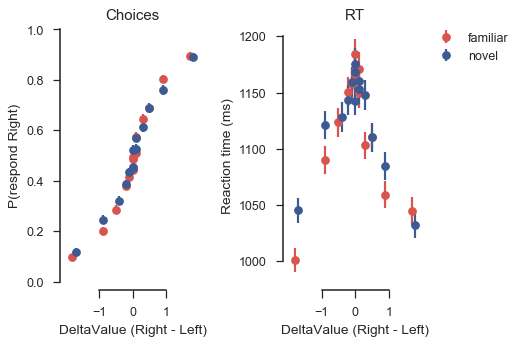

In [39]:
fam_foodplot = getDataFoodPlot(fam_food)
nov_foodplot = getDataFoodPlot(nov_food)

plotFoodData(fam_foodplot,nov_foodplot)

## Main Figures
<a id='main_figures'></a>

In [40]:
food=pd.read_csv(_thisDir + '/output/food.csv')
food=food.assign(absdeltaval=food['deltaval'].abs())

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseright ~ deltaval * sceneStimulusStatus + (1 | subjid)
   Data: food

     AIC      BIC   logLik deviance df.resid 
 31625.0  31665.9 -15807.5  31615.0    26413 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-47.879  -0.889  -0.199   0.914  40.718 

Random effects:
 Groups Name        Variance Std.Dev.
 subjid (Intercept) 0.04398  0.2097  
Number of obs: 26418, groups:  subjid, 96

Fixed effects:
                                  Estimate Std. Error z value Pr(>|z|)    
(Intercept)                       -0.06109    0.02878   -2.12   0.0338 *  
deltaval                           1.42800    0.03623   39.41   <2e-16 ***
sceneStimulusStatusnovel           0.01868    0.02704    0.69   0.4898    
deltaval:sceneStimulusStatusnovel -0.07495    0.05049   -1.48   0.1376    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correl

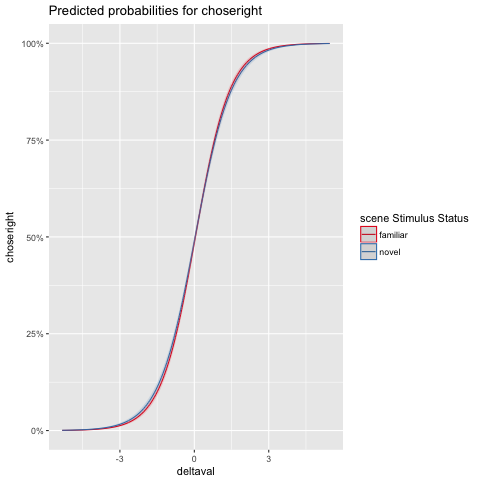

In [2]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus + (1|subjid), family='binomial', data=food)
print(summary(foodchmod))
plot_model(foodchmod,type='eff',show.ci=F, show.values=T,p.kr=FALSE, terms=c('deltaval','sceneStimulusStatus'))



Linear mixed model fit by REML ['lmerMod']
Formula: RT ~ absdeltaval * sceneStimulusStatus + (1 | subjid)
   Data: food

REML criterion at convergence: 380265.2

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.5340 -0.6440 -0.1549  0.4600  7.0962 

Random effects:
 Groups   Name        Variance Std.Dev.
 subjid   (Intercept)  54773   234.0   
 Residual             102656   320.4   
Number of obs: 26418, groups:  subjid, 96

Fixed effects:
                                     Estimate Std. Error t value
(Intercept)                          1164.802     24.149   48.23
absdeltaval                           -81.954      4.222  -19.41
sceneStimulusStatusnovel                1.145      5.038    0.23
absdeltaval:sceneStimulusStatusnovel    7.662      6.111    1.25

Correlation of Fixed Effects:
            (Intr) absdlt scnStS
absdeltaval -0.091              
scnStmlsStt -0.104  0.437       
absdltvl:SS  0.063 -0.691 -0.622


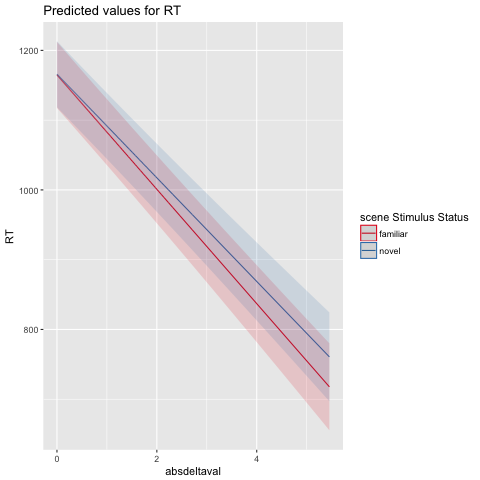

In [44]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodrtmod=lmer(RT ~ absdeltaval * sceneStimulusStatus + (1|subjid), data=food)
print(summary(foodrtmod))
plot_model(foodrtmod,type='eff',show.ci=F, show.values=T,p.kr=FALSE,terms=c('absdeltaval','sceneStimulusStatus'))


In [43]:
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
# RT mixed effects linear model
food=food.assign(absdeltaval=food['deltaval'].abs())
food['choseright']=food['choseright'].values.astype('int')

foodmd = smf.mixedlm('RT ~ absdeltaval * sceneStimulusStatus', food, groups=food['subjid'])
foodmdf = foodmd.fit()
print(foodmdf.summary())

                           Mixed Linear Model Regression Results
Model:                       MixedLM            Dependent Variable:            RT          
No. Observations:            26418              Method:                        REML        
No. Groups:                  96                 Scale:                         102655.8852 
Min. group size:             140                Likelihood:                    -190132.6060
Max. group size:             280                Converged:                     Yes         
Mean group size:             275.2                                                         
-------------------------------------------------------------------------------------------
                                           Coef.   Std.Err.    z    P>|z|  [0.025   0.975] 
-------------------------------------------------------------------------------------------
Intercept                                 1164.802   24.164  48.205 0.000 1117.442 1212.162
sceneStimulusSt

## Familiarity Ratings Analyses

In [9]:
def getsubfamiliarityratingsdf(subjectId):
    subjectFolder = _dataDir + subjectId + '/'

    familiarityFile = subjectFolder + subjectId + familiarityRatingsFileEnd

    if os.path.exists(familiarityFile):
        df = pd.read_csv(familiarityFile)
        subdf = df[['subjectId','stimulus1','rating']]
        subdf.columns = ['subjid','food','rating']
        return subdf

def getfamiliarityratings(printFig):
    subjects = get_subjects_w_all_data()
    familiarity_ratings = pd.DataFrame()
    
    for subject in subjects:
        df = getsubfamiliarityratingsdf(subject)
        #df['rating'] = (df['rating'] - df['rating'].mean()) / df['rating'].std()
        familiarity_ratings = pd.concat([familiarity_ratings, df])
    familiarity_ratings.reset_index(inplace=True, drop=True)
    
    if printFig:
        allratings = familiarity_ratings.groupby('food',as_index=False).median()

        #ratingssem = ratings.groupby('food').sem()['rating'].values    
        #allratings['sem'] = ratingssem

        allratings.sort_values('rating', ascending=True, inplace=True)
        allratings.reset_index(inplace=True, drop=True)

        #print "Mean Rating:", allratings['rating'].mean(), "±", allratings['rating'].std()
        #print allratings

        plt.rcParams['figure.dpi'] = 140
        fig = plt.figure()

        ax = sns.barplot(x="food", y="rating", data=allratings, color='xkcd:denim blue')
        ax.set_title('Median Food Familiarity Rating')
        plt.xticks(rotation=90)
        ax.set_ylim(0,10)
        ax.tick_params(labelsize=5)
        plt.show()
    return familiarity_ratings
    

total number of people who accepted the HIT 316
101 subjects completed all the tasks.


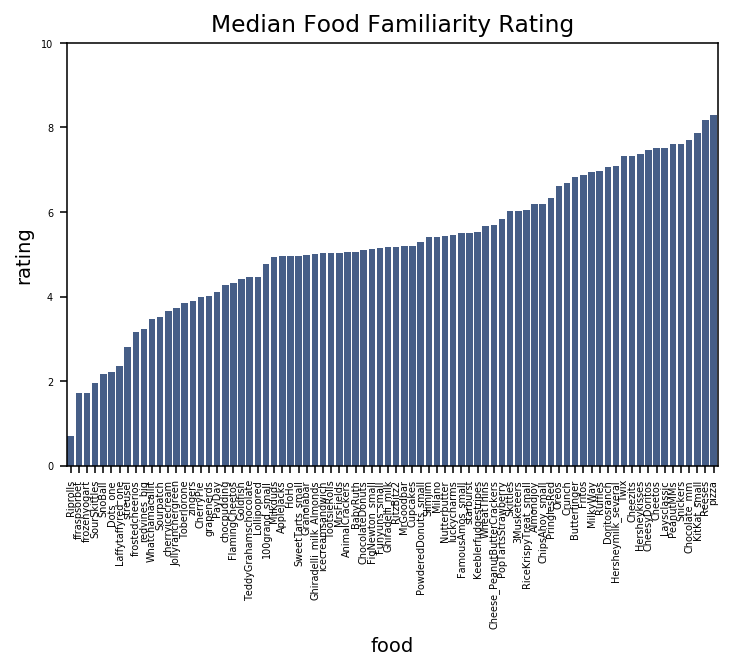

In [10]:
getfamiliarityratings(printFig=True);

In [11]:
familiarityratings = getfamiliarityratings(printFig=False);
food = pd.read_csv('./output/food_zscoredratings.csv')

total number of people who accepted the HIT 316
101 subjects completed all the tasks.


In [12]:
def getsubauctionratingsdf(subjectId):
    subjectFolder = _dataDir + subjectId + '/'

    familiarityFile = subjectFolder + subjectId + auctionFileEnd

    if os.path.exists(familiarityFile):
        df = pd.read_csv(familiarityFile)
        subdf = df[['subjectId','stimulus1','rating']]
        subdf.columns = ['subjid','food','rating']
        return subdf

def getauctionratings(printFig):
    subjects = get_subjects_w_all_data()
    familiarity_ratings = pd.DataFrame()
    
    for subject in subjects:
        df = getsubauctionratingsdf(subject)
        #df['rating'] = (df['rating'] - df['rating'].mean()) / df['rating'].std()
        familiarity_ratings = pd.concat([familiarity_ratings, df])
    familiarity_ratings.reset_index(inplace=True, drop=True)
    
    if printFig:
        allratings = familiarity_ratings.groupby('food',as_index=False).median()

        #ratingssem = ratings.groupby('food').sem()['rating'].values    
        #allratings['sem'] = ratingssem

        allratings.sort_values('rating', ascending=True, inplace=True)
        allratings.reset_index(inplace=True, drop=True)

        #print "Mean Rating:", allratings['rating'].mean(), "±", allratings['rating'].std()
        #print allratings

        plt.rcParams['figure.dpi'] = 140
        fig = plt.figure()

        ax = sns.barplot(x="food", y="rating", data=allratings, color='xkcd:denim blue')
        ax.set_title('Median Food Auction Rating')
        plt.xticks(rotation=90)
        ax.set_ylim(0,10)
        ax.tick_params(labelsize=5)
        plt.show()
    return familiarity_ratings

total number of people who accepted the HIT 316
101 subjects completed all the tasks.


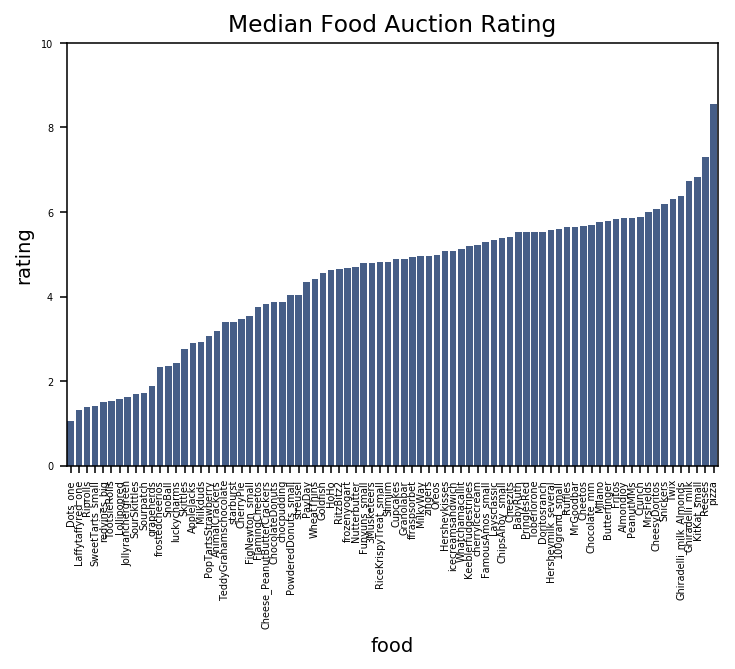

In [13]:
getauctionratings(printFig=True);

In [14]:
food = pd.read_csv('./output/food_zscoredratings.csv')
left = food.groupby('ImageLeft')
"""
plt.rcParams['figure.dpi'] = 140
fig = plt.figure()

ax = sns.barplot(x="food", y="rating", data=allratings, color='xkcd:denim blue')
ax.set_title('Median Food Familiarity Rating')
plt.xticks(rotation=90)
ax.set_ylim(0,10)
ax.tick_params(labelsize=5)
plt.show()
"""

'\nplt.rcParams[\'figure.dpi\'] = 140\nfig = plt.figure()\n\nax = sns.barplot(x="food", y="rating", data=allratings, color=\'xkcd:denim blue\')\nax.set_title(\'Median Food Familiarity Rating\')\nplt.xticks(rotation=90)\nax.set_ylim(0,10)\nax.tick_params(labelsize=5)\nplt.show()\n'

In [15]:
familiarityratings.columns = ['subjid','ImageLeft','ImageLeftFamiliarity']
df = food.merge(familiarityratings,left_on=['subjid','ImageLeft'],right_on=['subjid','ImageLeft'])
familiarityratings.columns = ['subjid','ImageRight','ImageRightFamiliarity']
df = df.merge(familiarityratings,left_on=['subjid','ImageRight'],right_on=['subjid','ImageRight'])
df['familiarityDelta'] = df['ImageRightFamiliarity'] - df['ImageLeftFamiliarity']
df.to_csv('./output/food_zscoredratings_with_food_familiarityratings.csv')

N=100 here because 2 of the 102 subjects with significant performance logistics didn't complete the familiarity ratings

In [16]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings_with_food_familiarityratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus + familiarityDelta + (1|subjid), family='binomial', data=food)
print(summary(foodchmod))

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseright ~ deltaval * sceneStimulusStatus + familiarityDelta +  
    (1 | subjid)
   Data: food

     AIC      BIC   logLik deviance df.resid 
 30575.5  30624.6 -15281.8  30563.5    26412 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-61.376  -0.827  -0.168   0.848  38.501 

Random effects:
 Groups Name        Variance Std.Dev.
 subjid (Intercept) 0.05088  0.2256  
Number of obs: 26418, groups:  subjid, 96

Fixed effects:
                                   Estimate Std. Error z value Pr(>|z|)    
(Intercept)                       -0.051745   0.030273   -1.71   0.0874 .  
deltaval                           1.231211   0.036829   33.43   <2e-16 ***
sceneStimulusStatusnovel           0.010606   0.027637    0.38   0.7012    
familiarityDelta                   0.154450   0.004959   31.14   <2e-16 ***
deltaval:sceneStimulusStatusnovel -0.056727 

In [17]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings_with_food_familiarityratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)
food$absfamiliaritydelta=abs(food$familiarityDelta)

foodrtmod=lmer(RT ~ absdeltaval * sceneStimulusStatus + absfamiliaritydelta + (1|subjid), data=food)
print(summary(foodrtmod))

Linear mixed model fit by REML ['lmerMod']
Formula: RT ~ absdeltaval * sceneStimulusStatus + absfamiliaritydelta +  
    (1 | subjid)
   Data: food

REML criterion at convergence: 380184.2

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.5576 -0.6426 -0.1534  0.4626  7.0894 

Random effects:
 Groups   Name        Variance Std.Dev.
 subjid   (Intercept)  54837   234.2   
 Residual             102351   319.9   
Number of obs: 26418, groups:  subjid, 96

Fixed effects:
                                      Estimate Std. Error t value
(Intercept)                          1182.3392    24.2427   48.77
absdeltaval                           -75.1428     4.2843  -17.54
sceneStimulusStatusnovel                1.1113     5.0306    0.22
absfamiliaritydelta                    -8.6782     0.9745   -8.90
absdeltaval:sceneStimulusStatusnovel    7.4616     6.1015    1.22

Correlation of Fixed Effects:
            (Intr) absdlt scnStS absfml
absdeltaval -0.075                     
scnStml

In [18]:
def getsubfoodratingsdf(subjectId):
    subjectFolder = _dataDir + subjectId + '/'

    auctionFile = subjectFolder + subjectId + auctionFileEnd

    if os.path.exists(auctionFile):
        df = pd.read_csv(auctionFile)
        subdf = df[['subjectId','stimulus1','rating']]
        subdf.columns = ['subjid','food','rating']
        return subdf

In [19]:
def getfamiliarityratings():
    subjects = get_subjects_w_all_data()
    df = pd.DataFrame()
    
    for subject in subjects:
        familiarity_df = getsubfamiliarityratingsdf(subject)
        familiarity_df.columns = ['subjid','food','familiarity']
        ratings_df = getsubfoodratingsdf(subject)
        familiarity_df.sort_values('food', ascending=True, inplace=True)
        ratings_df.sort_values('food', ascending=True, inplace=True)
        
        familiarity_df.reset_index(inplace=True, drop=True)
        ratings_df.reset_index(inplace=True, drop=True)
        
        assert (ratings_df['subjid'].values == familiarity_df['subjid'].values).mean() == 1.0
        assert (ratings_df['food'].values == familiarity_df['food'].values).mean() == 1.0
        
        sub_df = ratings_df
        sub_df['familiarity'] = familiarity_df['familiarity'].values
        df = pd.concat([df, sub_df])
        
    df.reset_index(inplace=True, drop=True)
    foodmd = smf.mixedlm('rating ~ familiarity', df, groups=df['subjid'])
    foodmdf = foodmd.fit()
    print(foodmdf.summary())
    

In [20]:
getfamiliarityratings()

total number of people who accepted the HIT 316
101 subjects completed all the tasks.
          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: rating     
No. Observations: 8080    Method:             REML       
No. Groups:       101     Scale:              4.7642     
Min. group size:  80      Likelihood:         -17952.2453
Max. group size:  80      Converged:          Yes        
Mean group size:  80.0                                   
---------------------------------------------------------
                Coef. Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------
Intercept       1.329    0.147  9.046 0.000  1.041  1.617
familiarity     0.604    0.009 66.594 0.000  0.586  0.622
Group Var       1.901    0.128                           



## Compile food data into csv

In [4]:
def getfoodsubdf(subjectId, zscoreRatings):
    subjectFolder = _dataDir + subjectId + '/'

    auctionFile = subjectFolder + subjectId + auctionFileEnd
    choiceFile = subjectFolder + subjectId + choiceFileEnd

    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        
        rightStimRatings = df["stimulus2Bid"]
        leftStimRatings = df["stimulus1Bid"]
        
        if zscoreRatings:
            mean, std = get_ratings_mean_and_std(subjectId)
            df["stimulus2Bid"] = (rightStimRatings - mean) / std
            df["stimulus1Bid"] = (leftStimRatings - mean) / std
            df["delta"] = df["stimulus2Bid"] - df["stimulus1Bid"]

        df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
        
        choices = df['selected'] == df['stimulus2']
        subdf = df[['subjectId','delta','stimulus1','stimulus2','stimulus1Bid','stimulus2Bid','rt','sceneStimulusStatus']]
        subdf.columns = ['subjid','deltaval','ImageLeft','ImageRight','bidLeft','bidRight','RT','sceneStimulusStatus']

        subdf.loc[:,'choseright'] = choices
        
        return subdf

def getfoodcsv(zscoreRatings):
    df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=False)
    subjects = df_sig_pval['subjectId'].values
    outputDir = _thisDir + '/output/'
    food = pd.DataFrame()
    for i in range(0,len(subjects)):
        subject = subjects[i]
        df = getfoodsubdf(subject, zscoreRatings)
        food = pd.concat([food, df])
    food.reset_index(inplace=True, drop=True)
    familiar_food=food.loc[food['sceneStimulusStatus']=='familisar']
    familiar_food.reset_index(inplace=True, drop=True)
    novel_food=food.loc[food['sceneStimulusStatus']=='novel']
    novel_food.reset_index(inplace=True, drop=True)
    if not os.path.exists(_thisDir + '/output'):
        os.mkdir(_thisDir + '/output/')
    if zscoreRatings:
        food.to_csv(_thisDir + '/output/food_zscoredratings.csv')
        familiar_food.to_csv(_thisDir + '/output/familiar_food_zscoredratings.csv')
        novel_food.to_csv(_thisDir + '/output/novel_food_zscoredratings.csv')
    else:
        food.to_csv(_thisDir + '/output/food.csv')
        familiar_food.to_csv(_thisDir + '/output/familiar_food.csv')
        novel_food.to_csv(_thisDir + '/output/novel_food.csv')


In [18]:
getfoodcsv(zscoreRatings=True)
getfoodcsv(zscoreRatings=False)

total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.
Of 106 subjects, 102 subjects had significant p values for the logistic regression.


/Users/alicexue/anaconda2/lib/python2.7/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
/Users/alicexue/anaconda2/lib/python2.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.
Of 106 subjects, 102 subjects had significant p values for the logistic regression.


## DDM fits

In [6]:
def discretize(theta, stim_strengths, tmax, dt):
    """
    Utility function that sets up the grid on which to do density propagation
    and also computes some additional required quantities

    Parameters
    ----------
    theta : 9 element list or array containing the DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    stim_strengths : array of unique stimulus strength for which to do
                     propagation

    tmax : float, maximum time for which to propagate

    dt : float, temporal resolution, in seconds, to use when propagating

    Returns
    -------
    drifts : array of shape (nd,) when nd is the number of drifts

    t : array of shape (nt,) where nt is the number of time points;
        vector of time points

    Bup : array of shape (nt,) where nt is the number of time points;
          vector of upper bounds, one value per each time bin

    Blo : array of shape (nt,) where nt is the number of time points;
          vector of lower bounds, one value per each time bin

    y : array of shape (ng,) where ng is the number of grid points
        over which to compute Gaussian density;
        these are the grid points to which y0 corresponds

    yinit : array of shape (ng,) where ng is the number of grid points
            over which to compute Gaussian density;
            these are the  actual initial density values

    """

    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta

    # time
    tmax = tmax + .3
    t = np.arange(0, tmax, dt)

    # bounds
    Bup = B0 * (t == t)
    s = t > Bdel

    #exponential
    Bup[s] = B0 * np.exp(-B2 * (t[s] - Bdel))
    Blo = -Bup

    # drift rate
    drifts = k * (stim_strengths + stim_strength_bias)
    
    # max unsigned drift
    md = np.max(np.abs(drifts))
    sm = md * dt + np.sqrt(dt) * 4
    y = np.linspace(np.min(Blo) - sm, np.max(Bup) + sm, 512)
    yinit = 0 * y

    i1 = np.where(y >= y0)[0][0]
    i2 = np.where(y <= y0)[0][-1]

    if i1 == i2:
        yinit[i1] = 1
    else:
        w2 = np.abs(y[i1] - y0)
        w1 = np.abs(y[i2] - y0)

        w1 = w1 / (w1 + w2)
        w2 = (1 - w1)
        yinit[i1] = w1
        yinit[i2] = w2

    drifts = drifts[np.newaxis, :]
    t = t.reshape(-1, 1)
    Bup = Bup.reshape(-1, 1)
    Blo = Blo.reshape(-1, 1)
    y = y.reshape(-1, 1)
    yinit = yinit.reshape(-1, 1)
    return drifts, t, Bup, Blo, y, yinit

In [7]:
def plotFoodsubDataWithFit(f_data, f_theta, n_data, n_theta, subjid, bindata, dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    subjid : subject id
    
    bindata : if True, plots mean with std error bars; if False, plots raw data

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors
    
    plt.rcParams['figure.dpi'] = 90
    fig = plt.figure()
    
    plt.suptitle(subjid)
    
    """ Familiar """
    sceneStimulusStatus='familiar'
    data=f_data
    theta=f_theta
    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    stim_strengths, rt, ci, deltaval = data[:, 0], data[:, 1], data[:, 2], data[:, 3]
    
    stim_strengths = stim_strengths.astype("complex") ** plaw
    ustim_strengths = np.unique(stim_strengths)
    stim_strengths_to_propagate = np.linspace(
        np.min(ustim_strengths), np.max(ustim_strengths), 51)

    drifts, t, Bup, Blo, y, yinit = discretize(
        theta, stim_strengths_to_propagate, np.max(rt), dt)

    D = propagate(drifts, t, Bup, Blo, y, yinit)

    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','deltaval'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    df['stim_strength']=stim_strengths
    
    dfsorted=df.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop = pd.Series.rolling(dfsorted['ci'],10,min_periods=1).mean()

    # predicted proportions
    predprop = D['up']['p'][:]

    #chose right or chose left
    cr=dfsorted[dfsorted['ci']==1]
    cl=dfsorted[dfsorted['ci']==0]
    
    #running mean of rt
    meanrt_lo = pd.Series.rolling(cl['rt'],10,min_periods=1).mean()
    meanrt_up = pd.Series.rolling(cr['rt'],10,min_periods=1).mean()
    meanrt_both = pd.Series.rolling(dfsorted['rt'],10,min_periods=1).mean()

    predrt_up = D['up']['mean_t'][0] + tnd
    predrt_lo = D['lo']['mean_t'][0] + tnd
    predrt_both=D['both']['mean_t'][0] + tnd
    
    ax_choice = fig.add_subplot(1, 2, 1)
    plt.title('Value-based choice')
    if bindata:
        meanbindata, stdbindata = get_binned_data(subjid, sceneStimulusStatus)
        ax_choice.plot(meanbindata['DeltaRnd'].values,meanbindata['Choice'].values,'o',color='xkcd:pale red')
        #ax_choice.errorbar(meanbindata['DeltaRnd'].values,meanbindata['Choice'].values,yerr=stdbindata['Choice'].values,fmt='o',color='grey')
    else: 
        ax_choice.add_line(
            plt.Line2D(dfsorted['deltaval'], meanprop, color='xkcd:pale red'))
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate, predprop, color='xkcd:pale red'))
    
    ax_rt = fig.add_subplot(1, 2, 2)
    plt.title('Value-based RT')
    if bindata:
        meanbindata, stdbindata = get_binned_data(subjid, sceneStimulusStatus)
        ax_rt.plot(meanbindata['DeltaRnd'].values,meanbindata['RT'].values,'o',color='xkcd:pale red', label='familiar')
        #ax_rt.errorbar(meanbindata['DeltaRnd'].values,meanbindata['RT'].values,yerr=stdbindata['RT'].values,fmt='o',color='grey')
    else:
        ax_rt.add_line(
        plt.Line2D(dfsorted['deltaval'], meanrt_both, color='xkcd:pale red', label='familiar'))

    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate, predrt_both,
        color='xkcd:pale red', marker='None'))
    
    """ Novel """
    sceneStimulusStatus='novel'
    data=n_data
    theta=n_theta
    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    stim_strengths, rt, ci, deltaval = data[:, 0], data[:, 1], data[:, 2], data[:, 3]
    
    stim_strengths = stim_strengths.astype("complex") ** plaw
    ustim_strengths = np.unique(stim_strengths)
    stim_strengths_to_propagate = np.linspace(
        np.min(ustim_strengths), np.max(ustim_strengths), 51)

    drifts, t, Bup, Blo, y, yinit = discretize(
        theta, stim_strengths_to_propagate, np.max(rt), dt)

    D = propagate(drifts, t, Bup, Blo, y, yinit)

    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','deltaval'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    df['stim_strength']=stim_strengths
    
    dfsorted=df.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop = pd.Series.rolling(dfsorted['ci'],10,min_periods=1).mean()

    # predicted proportions
    predprop = D['up']['p'][:]

    #chose right or chose left
    cr=dfsorted[dfsorted['ci']==1]
    cl=dfsorted[dfsorted['ci']==0]
    
    #running mean of rt
    meanrt_lo = pd.Series.rolling(cl['rt'],10,min_periods=1).mean()
    meanrt_up = pd.Series.rolling(cr['rt'],10,min_periods=1).mean()
    meanrt_both = pd.Series.rolling(dfsorted['rt'],10,min_periods=1).mean()

    predrt_up = D['up']['mean_t'][0] + tnd
    predrt_lo = D['lo']['mean_t'][0] + tnd
    predrt_both=D['both']['mean_t'][0] + tnd
    
    if bindata:
        meanbindata, stdbindata = get_binned_data(subjid, sceneStimulusStatus)
        ax_choice.plot(meanbindata['DeltaRnd'].values,meanbindata['Choice'].values,'o',color='xkcd:denim blue')
        #ax_choice.errorbar(meanbindata['DeltaRnd'].values,meanbindata['Choice'].values,yerr=stdbindata['Choice'].values,fmt='o',color='grey')
    else: 
        ax_choice.add_line(
            plt.Line2D(dfsorted['deltaval'], meanprop, color='xkcd:denim blue'))
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate, predprop, color='xkcd:denim blue'))

    xdata = stim_strengths_to_propagate
    
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond Right)')
    
    if bindata:
        meanbindata, stdbindata = get_binned_data(subjid, sceneStimulusStatus)
        ax_rt.plot(meanbindata['DeltaRnd'].values,meanbindata['RT'].values,'o',color='xkcd:denim blue', label='novel')
        #ax_rt.errorbar(meanbindata['DeltaRnd'].values,meanbindata['RT'].values,yerr=stdbindata['RT'].values,fmt='o',color='grey')
    else:
        ax_rt.add_line(
        plt.Line2D(dfsorted['deltaval'], meanrt_both, color='xkcd:denim blue', label='novel'))

    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate, predrt_both,
        color='xkcd:denim blue', marker='None'))

    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Reaction time (s)')
    
    ax_rt.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_rt.set_ylim(np.nanmin(np.concatenate([meanrt_up, meanrt_lo])) * .75,
                   np.nanmax(np.concatenate([meanrt_up, meanrt_lo])) * 1.1)
    
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Mean reaction times (s)')

    sns.despine(offset=5, trim=True)
    #plt.tight_layout()
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    plt.show()

In [8]:
def propagate(drifts, t, Bup, Blo, y, y0, notabs_flag=False):
    """
    Given a set of drift rates and bounds, compute various quantities
    that characterize the behavior of the drift-diffusion process

    Parameters
    ----------
    drifts : 2D array of shape (1, nd) where nd is the number of drift rates;
             this is a row vector of drifts

    t : 2D array of shape (nt, 1) where nt is the number of time points;
        this is a column vector of time points

    Bup : 2D array of shape (nt, 1) where nt is the number of time points;
          this is a column vector of upper bounds, one value per each time bin

    Blo : 2D array of shape (nt, 1) where nt is the number of time points;
          this is a column vector of lower bounds, one value per each time bin

    y : 2D array of shape (ng, 1) where ng is the number of grid points
        over which to compute Gaussian density; this is a column vector
        of grid points to which y0 corresponds

    y0 : 2D array of shape (ng, 1) where ng is the number of grid points
         over which to compute Gaussian density; this is a column vector
         of actual initial density values

    notabs_flag : boolean, whether to store the not absorbed portion of density

    Returns
    -------
    D : dictionary, contains for each unique stimulus strengh the probability
        of hitting the upper or lower bound, the mean reaction times for the
        two bounds, and the cumulative distribution of reaction times for the
        two bounds (and the not absored densities if requested)

    """
    
    nd = drifts.shape[1]
    nt = t.shape[0]
    dt = t[1, 0] - t[0, 0]
    ny = y.shape[0]

    D = {}
    D['bounds'] = np.column_stack([Bup, Blo])
    D['drifts'] = drifts

    # create fft of zero mean, unit variance gaussian
    kk = np.tile(np.atleast_2d(np.concatenate(
        [np.arange(0, ny / 2 + 1), np.arange(-ny / 2 + 1, 0)])).T, [1, nd])
    omega = 2 * np.pi * kk / (np.max(y) - np.min(y))
    E1 = np.exp(-0.5 * dt * np.power(omega, 2))
    D['up'] = {}
    D['lo'] = {}
    D['both'] = {}
    if notabs_flag:
        D['notabs'] = {}

    D['up']['pdf_t'] = np.zeros([nt, nd])
    D['lo']['pdf_t'] = np.zeros([nt, nd])
    D['both']['pdf_t'] = np.zeros([nt, nd])
    if notabs_flag:
        D['notabs']['pdf'] = np.zeros([nd, ny, nt])

    # U is initial state, one column for each drift rate
    U = np.tile(y0, [1, nd])

    # shift mean of zero mean, unit variance gaussian by drift
    E2 = E1 * np.exp(-1j * omega * np.tile(drifts, [ny, 1]) * dt)

    # prepare the values to propagate for vectorization
    y = np.tile(y, [1, nd])
    p_threshold = .00001
    for i in range(nt):
        # fft current pdf
        Ufft = np.fft.fft(U, axis=0)

        # convolve with gaussian with drift in the frequency domain
        Ufft = E2 * Ufft

        # turn back into time domain
        U = np.real(np.fft.ifft(Ufft, axis=0))
        U = np.clip(U, 0, np.inf)

        D['up']['pdf_t'][i, :] = np.sum(U * (y >= Bup[i]), axis=0)
        D['lo']['pdf_t'][i, :] = np.sum(U * (y <= Blo[i]), axis=0)
        D['both']['pdf_t'][i, :] = np.sum(U * ((y <= Blo[i]) | (y >= Bup[i])), axis=0)

        # keep only density within bounds
        U *= np.logical_and(y > Blo[i], y < Bup[i])

        # store not absorbed density if requested
        if notabs_flag:
            D['notabs']['pdf'][:, :, i] = U.T

        if np.sum(np.sum(U, axis=0) < p_threshold) == nd:
            break

    D['t'] = t

    D['up']['p'] = np.sum(D['up']['pdf_t'], axis=0)
    D['lo']['p'] = np.sum(D['lo']['pdf_t'], axis=0)
    D['both']['p'] = np.sum(D['both']['pdf_t'], axis=0)

    D['up']['mean_t'] = np.dot(t.T, D['up']['pdf_t']) / D['up']['p']
    D['lo']['mean_t'] = np.dot(t.T, D['lo']['pdf_t']) / D['lo']['p']
    D['both']['mean_t'] = np.dot(t.T, D['both']['pdf_t']) / D['both']['p']

    D['up']['cdf_t'] = np.cumsum(D['up']['pdf_t'], axis=0)
    D['lo']['cdf_t'] = np.cumsum(D['lo']['pdf_t'], axis=0)
    D['both']['cdf_t'] = np.cumsum(D['both']['pdf_t'], axis=0)
    return D

In [9]:
def get_binned_data(subject,sceneStimulusStatus):
    outputDir = _thisDir + '/output'
    datafoodfile = outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_datafood.pickle'
    if not os.path.exists(datafoodfile):
        print "Data file does not exist"
        sys.exit(-1)
    with open(datafoodfile, 'rb') as handle:
        datafoodsub = pickle.load(handle)
    
    df = pd.DataFrame(data = datafoodsub)

    df.columns = ['DeltaRnd', 'RT', 'Choice', 'Delta']
    
    bins = df['DeltaRnd'].unique()
    
    allmeanbindata = []
    allstdbindata = []
    
    meanchoice = df['Choice'].mean()
    meanrt = df['RT'].mean()
    
    for deltabin in bins:
        bindata = df.loc[df['DeltaRnd'] == deltabin]
        meanbindata = bindata.mean(axis = 0)
        tmp = bindata
        tmp.loc[:,'Choice'] = tmp['Choice'] - meanbindata['Choice'] + meanchoice
        tmp.loc[:,'RT'] = tmp['RT'] - meanbindata['RT'] + meanrt
        stdbindata = tmp.std(axis = 0)
        allmeanbindata.append(meanbindata)
        allstdbindata.append(stdbindata)
    
    m_bindf = pd.DataFrame(data = allmeanbindata)
    std_bindf = pd.DataFrame(data = allstdbindata)
    return m_bindf, std_bindf

In [10]:
def get_fit_data_and_plot(subject, outputDir):
    
    print 'subject:', subject
    sceneStimulusStatus = 'familiar'
    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_datafood.pickle', 'rb') as handle:
        f_datafoodsub = pickle.load(handle)
    
    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_foodfopt.pickle', 'rb') as handle:
        f_foodfoptsub = pickle.load(handle)
        print sceneStimulusStatus, "foodfoptsub:", f_foodfoptsub

    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_thetafood.pickle', 'rb') as handle:
        f_thetafoodsub = pickle.load(handle)
        print sceneStimulusStatus, "thetafoodsub:", f_thetafoodsub
    
    sceneStimulusStatus = 'novel'
    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_datafood.pickle', 'rb') as handle:
        n_datafoodsub = pickle.load(handle)

    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_foodfopt.pickle', 'rb') as handle:
        n_foodfoptsub = pickle.load(handle)
        print sceneStimulusStatus, "foodfoptsub:", n_foodfoptsub

    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_thetafood.pickle', 'rb') as handle:
        n_thetafoodsub = pickle.load(handle)
        print sceneStimulusStatus, "thetafoodsub:", n_thetafoodsub
        
    
    # k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    s = subject
    plotFoodsubDataWithFit(f_datafoodsub, f_thetafoodsub, n_datafoodsub, n_thetafoodsub, s, True, dt=.005)
    #outputfit(datafoodsub, thetafoodsub, s, 'food', dt=.0005)

In [ ]:
df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=False)
subjects = df_sig_pval['subjectId'].values
for subject in subjects:
    outputDir = _thisDir + '/output'
    get_fit_data_and_plot(subject, outputDir)

In [13]:
def get_model_params(subjects, type1, type2):
    subs = [] # subject ids for columns
    params = []
    columns = ["subjid", "k", "B0", "Bdel", "B2", "tnd", "tnd_sd", "stim_strength_bias", "y0", "plaw", "fopt"]
    
    names = [type1, type2]
    
    paramsbytype = {}
    
    for i in range(0, len(names)):
        typename = names[i]
        subs = [] # subject ids for columns
        params = []
        for subject in subjects:
            outputDir = _thisDir + '/output'
            subjectDir = outputDir + '/' + subject
            datafoodFile = subjectDir + '/' + subject + '_' + typename + '_datafood.pickle'
            foodfoptFile = subjectDir + '/' + subject + '_' + typename + '_foodfopt.pickle'
            thetafoodFile = subjectDir + '/' + subject + '_' + typename + '_thetafood.pickle'
            if os.path.exists(subjectDir) and os.path.exists(foodfoptFile) and os.path.exists(thetafoodFile):
                with open(datafoodFile, 'rb') as handle:
                    datafoodsub = pickle.load(handle)
                s = subject
                with open(foodfoptFile, 'rb') as handle:
                    foodfoptsub = pickle.load(handle)

                with open(thetafoodFile, 'rb') as handle:
                    thetafoodsub = pickle.load(handle)
                subs.append(s)
                s_params = np.append([s],thetafoodsub)
                s_params = np.append(s_params, foodfoptsub)
                params.append(s_params)
        
        paramsbytype[typename] = params
    
    df1 = pd.DataFrame(data = paramsbytype[type1], columns = columns)
    df2 = pd.DataFrame(data = paramsbytype[type2], columns = columns)
    
    df1 = df1.set_index('subjid')
    df2 = df2.set_index('subjid')
    
    df1_subs = df1.index.values
    df2_subs = df2.index.values
    
    subs = np.intersect1d(df1_subs, df2_subs)
    if len(df1_subs) > len(subs):
        subs = np.setdiff1d(df1_subs, subs)
        df1.drop(subs,axis=0,inplace=True)
    if len(df2_subs) > len(subs):
        subs = np.setdiff1d(df2_subs, subs)
        df2.drop(subs,axis=0,inplace=True)
    
    return df1, df2

In [14]:
def scatter_param_distribution(subjects, type1, type2):
    df1, df2 = get_model_params(subjects, type1, type2)
    
    params = ["k", "B0", "Bdel", "B2", "tnd", "tnd_sd", "stim_strength_bias", "y0", "plaw", "fopt"]
    for param in params:
        fig = plt.figure()
        x = df1[param].values
        y = df2[param].values
        x = x.astype(np.float)
        y = y.astype(np.float)
        plt.scatter(x, y, color = 'grey')
        plt.xlabel(type1)
        plt.ylabel(type2)
        
        minval = max([min(x), min(y)])
        maxval = max([max(x), max(y)])
        
        plt.plot([minval, maxval],[minval, maxval], 'r--', color = 'grey', linewidth = 1)
        
        plt.title(param + ' Scatterplot')
        plt.show()

In [2]:
#scatter_param_distribution(get_all_subjects(), 'novel', 'familiar')

In [17]:
def plotFoodDataWithFit(f_data, f_theta, n_data, n_theta, dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors
    
    plt.rcParams['figure.dpi'] = 90
    fig = plt.figure()
    
    """ Familiar """
    data = f_data
    theta = f_theta
    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    stim_strengths, rt, ci, subj = data[:, 0], data[:, 1], data[:, 2], data[:, 3]

    stim_strengths = stim_strengths.astype("complex") ** plaw
    ustim_strengths = np.unique(stim_strengths)
    stim_strengths_to_propagate = np.linspace(
        np.min(ustim_strengths), np.max(ustim_strengths), 51)

    drifts, t, Bup, Blo, y, yinit = discretize(
        theta, stim_strengths_to_propagate, np.max(rt), dt)

    D = propagate(drifts, t, Bup, Blo, y, yinit)

    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','subj','deltaval'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    
    dfsorted=df.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop = pd.Series.rolling(dfsorted['ci'],100,min_periods=1).mean()

    # predicted proportions
    predprop = D['up']['p'][:]

    #chose right or chose left
    cr=dfsorted[dfsorted['ci']==1]
    cl=dfsorted[dfsorted['ci']==0]
    
    #running mean of rt
    meanrt_lo = pd.Series.rolling(cl['rt'],50,min_periods=1).mean()
    meanrt_up = pd.Series.rolling(cr['rt'],50,min_periods=1).mean()
    meanrt_both = pd.Series.rolling(dfsorted['rt'],100,min_periods=1).mean()

    predrt_up = D['up']['mean_t'][0] + tnd
    predrt_lo = D['lo']['mean_t'][0] + tnd
    predrt_both = D['both']['mean_t'][0] + tnd
    
    ax_choice = fig.add_subplot(1, 2, 1)
    plt.title('Value-based choice')
    ax_choice.add_line(
        plt.Line2D(dfsorted['deltaval'], meanprop, color='xkcd:pale red', label='familiar'))
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate, predprop, color='xkcd:pale red'))

    ax_rt = fig.add_subplot(1, 2, 2)
    plt.title('Value-based RT')
    ax_rt.add_line(
        plt.Line2D(dfsorted['deltaval'], meanrt_both, color='xkcd:pale red'))
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate, predrt_both,
        color='xkcd:pale red', marker='None'))

    """ Novel """
    data = n_data
    theta = n_theta
    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    stim_strengths, rt, ci, subj = data[:, 0], data[:, 1], data[:, 2], data[:, 3]

    stim_strengths = stim_strengths.astype("complex") ** plaw
    ustim_strengths = np.unique(stim_strengths)
    stim_strengths_to_propagate = np.linspace(
        np.min(ustim_strengths), np.max(ustim_strengths), 51)

    drifts, t, Bup, Blo, y, yinit = discretize(
        theta, stim_strengths_to_propagate, np.max(rt), dt)

    D = propagate(drifts, t, Bup, Blo, y, yinit)

    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','subj','deltaval'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    
    dfsorted=df.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop = pd.Series.rolling(dfsorted['ci'],100,min_periods=1).mean()

    # predicted proportions
    predprop = D['up']['p'][:]

    #chose right or chose left
    cr=dfsorted[dfsorted['ci']==1]
    cl=dfsorted[dfsorted['ci']==0]
    
    #running mean of rt
    meanrt_lo = pd.Series.rolling(cl['rt'],50,min_periods=1).mean()
    meanrt_up = pd.Series.rolling(cr['rt'],50,min_periods=1).mean()
    meanrt_both = pd.Series.rolling(dfsorted['rt'],100,min_periods=1).mean()

    predrt_up = D['up']['mean_t'][0] + tnd
    predrt_lo = D['lo']['mean_t'][0] + tnd
    predrt_both = D['both']['mean_t'][0] + tnd
    
    #ax_choice = fig.add_subplot(1, 2, 1)
    ax_choice.add_line(
        plt.Line2D(dfsorted['deltaval'], meanprop, color='xkcd:denim blue',label='novel'))
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate, predprop, color='xkcd:denim blue'))

    #ax_rt = fig.add_subplot(1, 2, 2)
    ax_rt.add_line(
        plt.Line2D(dfsorted['deltaval'], meanrt_both, color='xkcd:denim blue'))
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate, predrt_both,
        color='xkcd:denim blue', marker='None'))

    """ Axis labels and limits"""
    xdata = stim_strengths_to_propagate
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond Right)')
    
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Reaction time (s)')
    
    ax_rt.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_rt.set_ylim(np.nanmin(np.concatenate([meanrt_up, meanrt_lo])) * .75,
                   np.nanmax(np.concatenate([meanrt_up, meanrt_lo])) * 1.1)
    
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Mean reaction times (s)')

    sns.despine(offset=5, trim=True)
    plt.tight_layout()
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()

In [ ]:
## get outputs of [thetafood,foodfopt]=fitData(datafood, dt=.0005)

outputDir = _thisDir + '/output'

sceneStimulusStatus = 'familiar'
with open(outputDir + '/' + sceneStimulusStatus + '_datafood.pickle', 'rb') as handle:
    f_datafood = pickle.load(handle)

with open(outputDir + '/' + sceneStimulusStatus + '_foodfopt.pickle', 'rb') as handle:
    f_foodfopt = pickle.load(handle)
    print sceneStimulusStatus, "foodfopt:", f_foodfopt

with open(outputDir + '/' + sceneStimulusStatus + '_thetafood.pickle', 'rb') as handle:
    f_thetafood = pickle.load(handle)
    print sceneStimulusStatus, "thetafood:", f_thetafood

sceneStimulusStatus = 'novel'
with open(outputDir + '/' + sceneStimulusStatus + '_datafood.pickle', 'rb') as handle:
    n_datafood = pickle.load(handle)

with open(outputDir + '/' + sceneStimulusStatus + '_foodfopt.pickle', 'rb') as handle:
    n_foodfopt = pickle.load(handle)
    print sceneStimulusStatus, "foodfopt:", n_foodfopt

with open(outputDir + '/' + sceneStimulusStatus + '_thetafood.pickle', 'rb') as handle:
    n_thetafood = pickle.load(handle)
    print sceneStimulusStatus, "thetafood:", n_thetafood

f_food=pd.read_csv(_thisDir + '/output/familiar_food_zscoredratings.csv')
f_food['deltavalrnd'] = f_food['deltaval'].round(1)
food = f_food
f_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])
    
n_food=pd.read_csv(_thisDir + '/output/novel_food_zscoredratings.csv')
n_food['deltavalrnd'] = n_food['deltaval'].round(1)
food = n_food
n_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])
    
datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])
plotFoodDataWithFit(f_datafoodplot, f_thetafood, n_datafoodplot, n_thetafood, dt=.0005)


In [ ]:

# Look at delta values - not z-scored
food=pd.read_csv(_thisDir + '/output/food.csv')
subs=np.unique(food['subjid'].values)

f_delta=food.loc[food['sceneStimulusStatus']=='familiar'].deltaval
n_delta=food.loc[food['sceneStimulusStatus']=='novel'].deltaval
print 'Mean delta across all trials'
print 'familiar',f_delta.mean()
print 'novel',n_delta.mean()

print ''

print 'Mean delta across participants'
tmp=food.groupby(['subjid','sceneStimulusStatus'],as_index=False)['deltaval'].mean()
print tmp.groupby(['sceneStimulusStatus']).mean()

print len(f_delta)
print len(n_delta)
print scipy.stats.ttest_ind(f_delta,n_delta)


## Dynamic Trial Analyses

In [21]:
# probability of choosing item if context of last trial with this stim was familiar/novel 
# AND if current trial is familiar/novel AND if item was chosen on previous trial with this stim
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
subs=np.unique(food['subjid'].values)
df_4dim=pd.DataFrame()

for sub in subs:
    # stimulus name is key, value is index of last trial in which the stimulus was show
    prevStimIndex = {}
    # stimulus name is key, value is boolean that is true if last time item was presented, it was on the right
    prevStimOnRight = {}
    
    subdf=food.loc[food['subjid']==sub]
    trialIndices=subdf.index.values # index in the food df, not actual trial numbers
    #print subdf

    for indexN in trialIndices:
        trial=subdf.loc[indexN,:]
        prevLeftImageIndex=-1
        prevRightImageIndex=-1
        # get trial index of last trial in which image left/right was presented
        if trial['ImageLeft'] in prevStimIndex.keys():
            prevLeftImageIndex = prevStimIndex[trial['ImageLeft']]
        if trial['ImageRight'] in prevStimIndex.keys():
            prevRightImageIndex = prevStimIndex[trial['ImageRight']]

        # check the sceneStimulusStatus of the last trial in which image left/right was presented
        for i in range(0,2):
            checkLeft = True
            prevImageIndex = prevLeftImageIndex
            if i == 1:
                checkLeft = False
                prevImageIndex = prevRightImageIndex
            
            # checking for ImageLeft
            if checkLeft and prevLeftImageIndex != -1:
                prevContext = subdf.loc[prevLeftImageIndex,'sceneStimulusStatus']
                choseItem = subdf.loc[indexN,'choseright'] == False
                choseRightOnPrevTrial = subdf.loc[prevLeftImageIndex,'choseright']
                if choseRightOnPrevTrial and prevStimOnRight[trial['ImageLeft']]: 
                    # chose right on prev trial and image was presented on right
                    choseItemOnPrevTrial = True
                elif not choseRightOnPrevTrial and not prevStimOnRight[trial['ImageLeft']]:
                    # chose left on prev trial and image was presented on left
                    choseItemOnPrevTrial = True
                else:
                    choseItemOnPrevTrial = False
                    
             # checking for ImageRight
            if not checkLeft and prevRightImageIndex != -1:
                prevContext = subdf.loc[prevRightImageIndex,'sceneStimulusStatus']
                choseItem = subdf.loc[indexN,'choseright'] == True
                if choseRightOnPrevTrial and prevStimOnRight[trial['ImageRight']]: 
                    # chose right on prev trial and image was presented on right
                    choseItemOnPrevTrial = True
                elif not choseRightOnPrevTrial and not prevStimOnRight[trial['ImageRight']]:
                    # chose left on prev trial and image was presented on left
                    choseItemOnPrevTrial = True
                else:
                    choseItemOnPrevTrial = False
            
            if prevImageIndex != -1:
                # store info in df_4dim dataframe
                prevDelta = subdf.loc[prevImageIndex,'deltaval']
                currDelta = subdf.loc[indexN,'deltaval']
                currRT = subdf.loc[indexN,'RT']
                trialData = {'subjid':sub,'Prev_context':prevContext, 'Curr_context':trial['sceneStimulusStatus'], 'Chose_item_on_prev_trial':choseItemOnPrevTrial, 'Chose_item_on_curr_trial':choseItem, 'Curr_RT':currRT, 'Prev_deltaval':prevDelta, 'Curr_deltaval':currDelta}
                df_4dim=df_4dim.append(trialData,ignore_index=True)
                

        # set prevStimIndex with value of current index for ImageLeft and ImageRight of current trial
        prevStimIndex[trial['ImageLeft']]=indexN
        prevStimIndex[trial['ImageRight']]=indexN
        
        prevStimOnRight[trial['ImageLeft']]=False
        prevStimOnRight[trial['ImageRight']]=True
        
df_4dim.to_csv(_thisDir + '/output/dynamic_trial_data.csv')

In [22]:
print df_4dim.columns

Index([u'Chose_item_on_curr_trial', u'Chose_item_on_prev_trial', u'Curr_RT',
       u'Curr_context', u'Curr_deltaval', u'Prev_context', u'Prev_deltaval',
       u'subjid'],
      dtype='object')


In [23]:
df_4dim.columns = ['Chose_item_on_prev_trial','Curr_context','Chose_item_on_curr_trial','Prev_deltaval','Prev_context','Curr_RT','Curr_deltaval','subjid']
df_4dim.to_csv(_thisDir + '/output/dynamic_trial_data.csv')

In [8]:
dynamic_trial_data = pd.read_csv(_thisDir + '/output/dynamic_trial_data.csv')

In [9]:
dynamic_trial_data.columns

Index([u'Unnamed: 0', u'Chose_item_on_prev_trial', u'Curr_context',
       u'Chose_item_on_curr_trial', u'Prev_deltaval', u'Prev_context',
       u'Curr_RT', u'Curr_deltaval', u'subjid'],
      dtype='object')

In [10]:
dynamic_trial_data.columns = ['Unnamed: 0', 'Chose item on prev trial', 'Context', 'P(Choosing item)', 'Previous deltaval', 'Previous context', 'RT', 'deltaval', 'subjid']

In [11]:
df_4dim=dynamic_trial_data

In [ ]:
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.barplot(x="Previous context", y="P(Choosing item)", data=df_4dim, palette=colors, ci=68)
#ax.set_title('')
plt.show()

In [ ]:
print 'N trials:'
print df_4dim.groupby(['Previous context'])['P(Choosing item)'].count()

tmp=df_4dim.groupby(['subjid','Previous context'],as_index=False)['P(Choosing item)'].mean()

print tmp.groupby(['Previous context']).mean()
print tmp.groupby(['Previous context']).sem()

In [ ]:
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.barplot(x="Previous context", y="P(Choosing item)", hue="Context", hue_order=['familiar','novel'], data=df_4dim, palette=colors, ci=68)
#ax.set_title('')
plt.show()

In [ ]:
print 'N trials:'
print df_4dim.groupby(['Previous context','Context'])['P(Choosing item)'].count()

tmp=df_4dim.groupby(['subjid','Previous context','Context'],as_index=False)['P(Choosing item)'].mean()

print tmp.groupby(['Previous context','Context']).mean()
print tmp.groupby(['Previous context','Context']).sem()

In [ ]:
plt.rcParams['figure.dpi'] = 80
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.factorplot(kind="bar", x="Previous context", y="P(Choosing item)", hue="Context", hue_order=['familiar','novel'], col="Chose item on prev trial", data=df_4dim, palette=colors, ci=68)
#ax.set_title('')
plt.show()

In [ ]:
print 'N trials:'
print df_4dim.groupby(['Previous context','Context','Chose item on prev trial'])['P(Choosing item)'].count()

tmp=df_4dim.groupby(['subjid','Previous context','Context','Chose item on prev trial'],as_index=False)['P(Choosing item)'].mean()

print tmp.groupby(['Previous context','Context','Chose item on prev trial']).mean()
print tmp.groupby(['Previous context','Context','Chose item on prev trial']).sem()

In [ ]:
data = dynamic_trial_data.loc[dynamic_trial_data['Chose_item_on_curr_trial']==1]
plt.rcParams['figure.dpi'] = 80
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.factorplot(kind="bar", x="Prev_context", y="Curr_RT", hue="Curr_context", hue_order=['familiar','novel'], col="Chose_item_on_prev_trial", data=data, palette=colors, ci=68)
plt.show()

In [ ]:
print 'N trials:'
print dynamic_trial_data.groupby(['Prev_context','Curr_context','Chose_item_on_prev_trial'])['Curr_RT'].count()

tmp=dynamic_trial_data.groupby(['subjid','Prev_context','Curr_context','Chose_item_on_prev_trial'],as_index=False)['Curr_RT'].mean()

print dynamic_trial_data.groupby(['Prev_context','Curr_context','Chose_item_on_prev_trial'])['Curr_RT'].mean()
print dynamic_trial_data.groupby(['Prev_context','Curr_context','Chose_item_on_prev_trial'])['Curr_RT'].sem()

In [ ]:
%%R -i dynamic_trial_data
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/dynamic_trial_data.csv', sep='')

dynamic_trial_data=read.table(foodFileName,header=T,sep=",")
#dynamic_trial_data$absdeltaval=abs(dynamic_trial_data$deltaval)

foodchmod=glmer(Chose_item_on_curr_trial ~ Chose_item_on_prev_trial * Prev_context * Curr_context + Curr_deltaval + Prev_deltaval + (1|subjid), family='binomial', data=dynamic_trial_data)
print(summary(foodchmod))

foodrtmod=lmer(Curr_RT ~ Chose_item_on_prev_trial * Prev_context * Curr_context + Curr_deltaval + Prev_deltaval + (1|subjid), data=dynamic_trial_data)
print(summary(foodrtmod))

In [ ]:
foodmd = smf.mixedlm('Curr_RT ~ Chose_item_on_prev_trial * Prev_context * Curr_context + Curr_deltaval + Prev_deltaval', dynamic_trial_data, groups=dynamic_trial_data['subjid'])
foodmdf = foodmd.fit()
print(foodmdf.summary())

In [30]:
print dynamic_trial_data.columns

Index([u'Unnamed: 0', u'Chose_item_on_prev_trial', u'Curr_context',
       u'Chose_item_on_curr_trial', u'Prev_deltaval', u'Prev_context',
       u'Curr_RT', u'Curr_deltaval', u'subjid'],
      dtype='object')


## Revaluation Analyses

In [ ]:
## Calculate revalued values

def fn_reval(delta_v,foodsub):
    # get number of trials
    ntrials=len(foodsub['subjid'])
    # make empty dataframe to populate with revalued values
    revalsub=pd.DataFrame(np.zeros((ntrials,2)),columns=['RevalueLeft','RevalueRight'])
    # get item names placed on left and right side of screen for all trials
    item=foodsub['ImageLeft']
    item=item.append(foodsub['ImageRight'])
    # get initial auction values for items on left and right for all trials
    value=foodsub['bidLeft']
    value=value.append(foodsub['bidRight'])
    # create a dataframe with item names and initial auction values
    tmp=pd.DataFrame({'item':item,'value':value})
    # create dataframe with 60 item names and initial auction values to be updated per trial
    value=tmp.groupby(['item'],as_index=False).mean()
    # go through trials to update values
    for t in range(ntrials):
        # get values for item on left and right from updated value dataframe
        valueleft=value[value['item']==foodsub.iloc[t]['ImageLeft']]['value']
        valueright=value[value['item']==foodsub.iloc[t]['ImageRight']]['value']
        # assign updated value for items on left and right on current trial
        revalsub.iloc[t]['RevalueLeft']= valueleft
        revalsub.iloc[t]['RevalueRight']= valueright
        # if right item chosen, increment value of item on right and decrement value of item on left
        if foodsub.iloc[t]['choseright']:
            value.loc[value['item']==foodsub.iloc[t]['ImageLeft'],'value']= valueleft - delta_v
            value.loc[value['item']==foodsub.iloc[t]['ImageRight'],'value']= valueright + delta_v
        # else if left item chosen, increment value of item on left and decrement value of item on right
        else:
            value.loc[value['item']==foodsub.iloc[t]['ImageLeft'],'value']= valueleft + delta_v
            value.loc[value['item']==foodsub.iloc[t]['ImageRight'],'value']= valueright - delta_v
    # calculate deltaval from revalued values
    revalsub['deltareval']=revalsub['RevalueRight'].values-revalsub['RevalueLeft'].values
    # choices and subject columns in ravalued dataframe
    revalsub['choseright']=foodsub['choseright'].values.astype('bool')
    revalsub['RT']=foodsub['RT'].values
    revalsub['ImageRight']=foodsub['ImageRight'].values
    revalsub['ImageLeft']=foodsub['ImageLeft'].values
    revalsub['subjid']=foodsub['subjid'].values
    # calculate goodness of fit to revalued values and output deviance
    mod=smf.glm('choseright ~ RevalueLeft + RevalueRight', data=revalsub,family = sm.families.Binomial())
    try:
        results = mod.fit()
        devsub=results.deviance
    except:
        pass
        devsub=9999
    return devsub, revalsub

def do_optim(s):
    tlow=-3
    thigh=3
    food=pd.read_csv('food.csv',header=0,index_col=0)
    uni_subj=food['subjid'].unique()
    foodsub=food[food['subjid']==uni_subj[s]]
    fn_fit = lambda x: fn_reval(x, foodsub)[0]
    # eval best delta_v:
    xopt=scipy.optimize.fminbound(func=fn_fit,x1=tlow,x2=thigh,disp=False)
    dev_opt=[uni_subj[s],fn_fit(xopt),xopt]
    return dev_opt

In [ ]:
# ran do_optim on habanero
dev_opt=pd.read_csv(_thisDir + '/output/reval/all_dev_opt.csv')
dev_opt_fake=pd.read_csv(_thisDir + '/output/reval/all_dev_opt_fake.csv')
#Plot delta_v from revaluation algorithm output using real vs. fake choices
sns.set(font_scale=1.5)
sns.set_style("white")
sns.set_style("ticks")
plt.figure()
plt.scatter(dev_opt['opt_deltav'],dev_opt_fake['opt_deltav'])
plt.xlabel(r'Optimal $\delta$ using actual choices')
plt.ylabel(r'Optimal $\delta$ using fake choices')
plt.title(r'Optimal $\delta$ using real vs. fake choices')
plt.axis([-1,3, -1, 3])
plt.plot( [-1,3],[-1,3] )
sns.despine()
plt.show()

In [ ]:
## Calculate revalued values

def fn_reval_scene_split(theta,foodsub):
    
    #medianrt=np.median(foodsub.RT)
    
    deltavlo,deltavhi = theta
    # get number of trials
    ntrials=len(foodsub['subjid'])
    # make empty dataframe to populate with revalued values
    revalsub=pd.DataFrame(np.zeros((ntrials,2)),columns=['RevalueLeft','RevalueRight'])
    # get item names placed on left and right side of screen for all trials
    item=foodsub['ImageLeft']
    item=item.append(foodsub['ImageRight'])
    # get initial auction values for items on left and right for all trials
    value=foodsub['bidLeft']
    value=value.append(foodsub['bidRight'])
    # create a dataframe with item names and initial auction values
    tmp=pd.DataFrame({'item':item,'value':value})
    # create dataframe with 60 item names and initial auction values to be updated per trial
    value=tmp.groupby(['item'],as_index=False).mean()
    # go through trials to update values
    for t in range(ntrials):
        # get values for item on left and right from updated value dataframe
        valueleft=value[value['item']==foodsub.iloc[t]['ImageLeft']]['value']
        valueright=value[value['item']==foodsub.iloc[t]['ImageRight']]['value']
        # assign updated value for items on left and right on current trial
        revalsub.iloc[t]['RevalueLeft']= valueleft
        revalsub.iloc[t]['RevalueRight']= valueright
        
        context=foodsub.iloc[t]['sceneStimulusStatus']
        if context == 'familiar':
            delta_v=deltavlo
        else:
            delta_v=deltavhi
            
        # if right item chosen, increment value of item on right and decrement value of item on left
        if foodsub.iloc[t]['choseright']:
            value.loc[value['item']==foodsub.iloc[t]['ImageLeft'],'value']= valueleft - delta_v
            value.loc[value['item']==foodsub.iloc[t]['ImageRight'],'value']= valueright + delta_v
        # else if left item chosen, increment value of item on left and decrement value of item on right
        else:
            value.loc[value['item']==foodsub.iloc[t]['ImageLeft'],'value']= valueleft + delta_v
            value.loc[value['item']==foodsub.iloc[t]['ImageRight'],'value']= valueright - delta_v
    # calculate deltaval from revalued values
    revalsub['deltareval']=revalsub['RevalueRight'].values-revalsub['RevalueLeft'].values
    # choices and subject columns in ravalued dataframe
    revalsub['choseright']=foodsub['choseright'].values.astype('bool')
    revalsub['RT']=foodsub['RT'].values
    revalsub['ImageRight']=foodsub['ImageRight'].values
    revalsub['ImageLeft']=foodsub['ImageLeft'].values
    revalsub['subjid']=foodsub['subjid'].values
    # calculate goodness of fit to revalued values and output deviance
    mod=smf.glm('choseright ~ RevalueLeft + RevalueRight', data=revalsub,family = sm.families.Binomial())
    try:
        results = mod.fit()
        devsub=results.deviance
    except:
        pass
        devsub=9999
    return devsub

def do_optim_scene_split(s):
    tlow=[-0.6,-0.6]
    thigh=[0.6,0.6]
    food=pd.read_csv('./output/food_zscoredratings.csv',header=0,index_col=0)
    uni_subj=food['subjid'].unique()
    foodsub=food[food['subjid']==uni_subj[s]]
    # eval best delta_v:
    theta_init=[0,0]
    theta, xopt = fminbnd.fminbnd(fn_reval_scene_split,theta_init,args=[foodsub],LB=tlow,UB=thigh,disp=False)

    dev_opt=[uni_subj[s],theta[0],theta[1],xopt]
    return dev_opt

"""
food=pd.read_csv('./output/food_zscoredratings.csv',header=0,index_col=0)
# run 30 participants in parallel
inputs = range(len(food['subjid'].unique()))
num_cores = multiprocessing.cpu_count()
results = Parallel(n_jobs=num_cores)(delayed(do_optim_scene_split)(i) for i in inputs)
# convert output to dataframe to make life easier
dev_opt_scene_split=pd.DataFrame(results,columns=['subjid','opt_deltavlo','opt_deltavhi','dev'])
"""

In [ ]:
# ran do_optim_scene_split on habanero
dev_opt_scene_split=pd.read_csv(_thisDir + '/output/reval/all_dev_opt_scene_split.csv')
#Plot delta_v from revaluation algorith output using real vs. fake choices
sns.set(font_scale=1.5)
sns.set_style("white")
sns.set_style("ticks")
plt.figure()
plt.scatter(dev_opt_scene_split.opt_deltavlo,dev_opt_scene_split.opt_deltavhi)
plt.xlabel(r'$\delta$, familiar')
plt.ylabel(r'$\delta$, novel')
plt.title(r'$\delta$ for familiar and novel scenes')
plt.axis([0, .7, 0, .7])
plt.plot( [0,.7],[0,.7] )
sns.despine()
plt.show()

In [24]:
scipy.stats.ttest_rel(dev_opt_scene_split.opt_deltavlo,dev_opt_scene_split.opt_deltavhi)

Ttest_relResult(statistic=-2.1565920229032023, pvalue=0.033410600471385395)

In [25]:
dev_opt_scene_split.opt_deltavlo.mean() #familiar

0.20031835665116812

In [26]:
dev_opt_scene_split.opt_deltavhi.mean() #novel

0.21813059283385688

In [ ]:
%%R 
library(readr)
library(lme4)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
subs=unique(food$subjid)

sceneRevalName <- paste(outputDir, '/reval/all_dev_opt_scene_split.csv', sep='')
dev_opt_scene_split=read.table(sceneRevalName,header=T,sep=",")
familiar_deltav=dev_opt_scene_split$opt_deltavlo
novel_deltav=dev_opt_scene_split$opt_deltavhi

n=(length(novel_deltav))

#foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus + (1|subjid), family='binomial', data=food)
foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus + (deltaval|subjid), family='binomial', data=food)
cf=coef(foodchmod)

slopes=cf[[1]]$deltaval


dev_opt_scene_split$slope=slopes
dev_opt_scene_split$familiar_deltav=dev_opt_scene_split$opt_deltavlo
dev_opt_scene_split$novel_deltav=dev_opt_scene_split$opt_deltavhi


chmod=lm(slope ~ familiar_deltav + novel_deltav, data=dev_opt_scene_split)
print(summary(chmod))